# Preamble, definitions and reference data

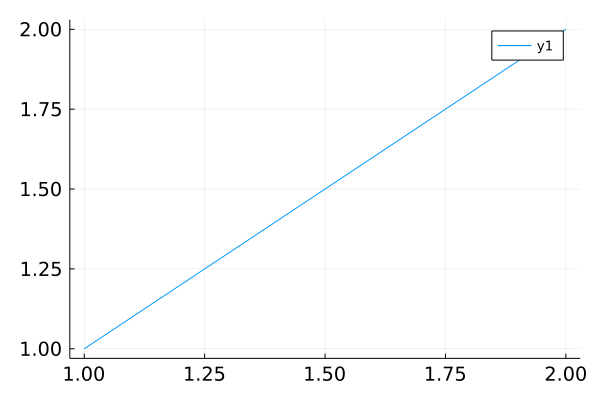

In [1]:
using DelimitedFiles
using Plots
#using Plotly
using Statistics
using LaTeXStrings

using ImageFiltering
using DataFrames
using Counters
using CSV


default(titlefont = (13), legendfontsize = 9, guidefont = (15, :black), tickfont = (13, :black),
margins = 3Plots.PlotMeasures.mm)
cd("/home/puercoerrante/fortranmc/dataAnalysisNotebooks")
include("$(pwd())/utilities.jl");

dirsMoreScalars = [
"/home/puercoerrante/fortranTests/2d/2022e03-dsig0.125-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022e03-dsig0.2857142857142857-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022e03-dsig0.125-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022e03-dsig0.2857142857142857-dtFixedfalse"
]
directoriesToAnalyze = [
#3d
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.515-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.515-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.565-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.565-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.615-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c08-dsig0.615-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.521-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.521-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.524-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.524-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.527-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.527-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.53-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.53-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c12-dsig0.5-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c12-dsig0.5-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.505-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.505-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.535-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.535-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.545-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.545-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.54-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.54-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.555-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.555-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.55-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.55-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.56-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c28-dsig0.56-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022b10-dsig0.5181489-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022b10-dsig0.5181489-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022b10-dsig0.51-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022b10-dsig0.51-dtFixedtrue"

#2d

#Removing old Ising REsults
#"/home/puercoerrante/fortranTests/2d/2022a04-dsig0.125-dtFixedfalse"
#"/home/puercoerrante/fortranTests/2d/2022a04-dsig0.125-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022a28-dsig0.2857142857142857-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022a28-dsig0.2857142857142857-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.2-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.2-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.223606797749979-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.223606797749979-dtFixedfalse"
# changed arbitrary value (v) for "really" irrational one (^)
#"/home/puercoerrante/fortranTests/2d/2022b10-dsig0.2312-dtFixedtrue"
#"/home/puercoerrante/fortranTests/2d/2022b10-dsig0.2312-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.175-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.15-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.15-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.175-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.3-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.25-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.3-dtFixedfalse"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.25-dtFixedfalse"

#more 3d
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.53-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.521-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.527-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.521-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.527-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.524-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.524-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c11-dsig0.53-dtFixedtrue"

#4d and extra 2d
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.15-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.05-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.05-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.3-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.15-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.1-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.0-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.0-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.1-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.2-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.2-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c12-dsig1.3-dtFixedtrue"
#3d stuff
"/home/puercoerrante/fortranTests/3d/2022c12-dsig0.5-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c12-dsig0.5-dtFixedtrue"
#new 2d
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.125-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.125-dtFixedfalse"

];

dirs2dGFT = [
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.125-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.2-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.15-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.3-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.2857142857142857-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.25-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.2312-dtFixedtrue"
"/home/puercoerrante/fortranTests/2d/2022d01-GFTfixed-dsig0.175-dtFixedtrue"
]

dirs4dGFT = [
"/home/puercoerrante/fortranTests/4d/2022d20-GFTfixed-dsig1.05-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022d20-GFTfixed-dsig1.1-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022d20-GFTfixed-dsig1.15-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022d20-GFTfixed-dsig1.2-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022d20-GFTfixed-dsig1.3-dtFixedtrue"
]

dirs3dGFT = [

"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.535-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.545-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.53-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.565-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.55-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.56-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.555-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.54-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.505-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.5181489-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.51-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixed-dsig0.524-dtFixedtrue"

]
dirsInconsistent = [

"/home/puercoerrante/fortranTests/3d/2022c23-inconsistent-dsig0.51-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c23-inconsistent-dsig0.51-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c23-inconsistent-dsig0.53-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c23-inconsistent-dsig0.53-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022d14-GFTfixedhigh-dsig0.5181489-dtFixedtrue"

]


#5from arXiv:1203.6064 fig. 3
extremalLine3d = [
    0.5 1
    0.5065625 1.1701923076923078
    0.5140625 1.3375000000000001
    0.518125 1.4125
    0.5375 1.4759615384615388
    #0.5784374999999999 1.6057692307692308
    0.5596875 1.5451923076923078
    0.64 1.8]

#from arXiv:1203.6064 fig. 9
extremalLine3dc = [
    0.500093023255814 0.9997737556561087
    0.5025116279069767 0.9950353923322461
    0.5052093023255814 0.9866031779438074
    0.5079069767441861 0.974475639271809
    0.5109767441860464 0.9602384510154689
    0.5133023255813953 0.9518042723350522
    0.5145116279069767 0.9481153320004211
    0.5159069767441861 0.9449552772808587
    0.5169302325581395 0.9417932582693186
    0.517953488372093 0.9423265635413379
    0.5194418604651163 0.9460297449928095
    0.5223255813953488 0.9581867480444772
    0.5247441860465116 0.9692854887930129
    0.528 0.9861955873583781
    0.5315348837209302 1.003371110877267
    0.5361860465116279 1.026887368901049
    0.5435348837209302 1.0591282752814901
    0.5471627906976744 1.0734008207934338
    0.5533953488372093 1.0966614753235822
    0.5570232558139534 1.107766600021046
    0.5615813953488372 1.1225719597320145
    0.5653953488372092 1.1336780665754675
    0.5733953488372092 1.1543085341471115
    0.5800930232558139 1.1691251885369534
    0.5860465116279069 1.1818263004665195
    0.5918139534883721 1.191886912904697
    0.5965581395348837 1.199830509663615
    0.6 1.204071907117051]

# from https://arxiv.org/pdf/1211.2810.pdf figure 1
extremalLine2d = [
    0.005322415557830095 0.027855153203342642
    0.02006141248720573 0.08913649025069637
    0.031729785056294785 0.14206128133704743
    0.049948822927328565 0.2367688022284118
    0.07001023541453429 0.34540389972144836
    0.09498464687819859 0.5264623955431755
    0.10522006141248721 0.6239554317548746
    0.11504605936540432 0.7576601671309191
    0.11995905834186285 0.8607242339832868
    0.1248720573183214 1.0055710306406684
    0.1498464687819857 1.0696378830083566
    0.17097257406914737 1.1286294622635789
    0.1850562947799386 1.1643454038997214
    0.22026612077789154 1.2590529247910862
    0.2310724119538109 1.2915731920008273
    0.24101373852119884 1.3192428819562092
    0.2702149437052201 1.3955431754874652
    0.2961429131221684 1.4698889717132881
    0.305424769703173 1.49025069637883
    0.31105490297325034 1.5098563016488395
    0.3661840775742199 1.6635768014009606]

#   from http://arxiv.org/abs/0807.0004 figure 1
extremalLine4d = [
    0.9996323529411765 2.0100000000000002
    1.0022058823529412 2.096666666666667
    1.0080882352941176 2.186666666666667
    1.0154411764705882 2.2766666666666673
    1.03125 2.413333333333334
    1.05 2.5466666666666673
    1.08125 2.7500000000000004
    1.111764705882353 2.926666666666667
    1.1463235294117649 3.1100000000000003
    1.1797794117647058 3.283333333333334
    1.2209558823529412 3.483333333333334
    1.25 3.6200000000000006
    1.2871323529411764 3.793333333333334
    1.3025735294117649 3.8633333333333337
]

# from http://arxiv.org/abs/1109.5176 figure 2
extremalLine4dSOTA = [1 2
    1.0082474226804123 2.0512195121951224
    1.01786941580756 2.102439024390244
    1.0261168384879726 2.1451219512195125
    1.0357388316151204 2.187804878048781
    1.0577319587628866 2.281707317073171
    1.1388316151202749 2.5719512195121954
    1.243298969072165 2.9048780487804877
    1.3628865979381444 3.2634146341463413
    1.4563573883161514 3.536585365853659
    1.5484536082474227 3.809756097560976
    1.6955326460481102 4.245121951219512
    1.7986254295532647 4.560975609756097]

# from http://arxiv.org/abs/1109.5176 figure 2
extremalLine4dc = [1.0 1
    #1.0018823529411764 1.1318327974276527
    1.0018823529411764 1.0610932475884245
    #1.003764705882353 1.189710610932476
    1.0056470588235293 1.2540192926045017
    1.0075294117647058 1.2990353697749197
    1.011294117647059 1.356913183279743
    1.0169411764705882 1.4083601286173635
    1.0244705882352942 1.4726688102893892
    1.0338823529411765 1.5434083601286175
    1.0414117647058823 1.5884244372990355
    1.0527058823529412 1.6334405144694535
    1.0658823529411765 1.6784565916398715
    1.0865882352941176 1.7234726688102895
    1.1035294117647059 1.7491961414791
    1.1298823529411766 1.7684887459807075
    1.1571764705882353 1.7717041800643087
    1.1769411764705882 1.7684887459807075
    1.212705882352941 1.7363344051446945
    1.2296470588235293 1.717041800643087
    1.2465882352941176 1.6913183279742765
    1.259764705882353 1.6688102893890675
    1.2729411764705882 1.64951768488746
    1.2879999999999998 1.6205787781350485
    1.3105882352941176 1.5755627009646305]

#from https://arxiv.org/pdf/1403.4545.pdf fig. 18
extremalLine2dc = [0.11989671082919842 0.5058450048595835
    0.12277603969512507 0.502444319402527
    0.12373592511125889 0.5010832267635172
    0.12479140621003632 0.5004051358125735
    0.12603676914420175 0.503823418077651
    0.1274738145173666 0.5075838150289017
    0.1296766074991048 0.5147604481047623
    0.1329332446672464 0.5246719525295411
    0.13551956621822087 0.5321915187477619
    0.13925516394700496 0.543470254232953
    0.1437573277405494 0.5564587446928231
    0.1471102153562842 0.5656880658857231
    0.14988821934625812 0.573549746790117
    0.15371990383139802 0.5844875952734154
    0.15898896107217758 0.5985032482479922
    0.18 0.65
    0.2 0.7
]

#from http://arxiv.org/abs/1712.06622 fig. 1
extremalLine2dBehanHi = [
    0.06544117647058825   0.2777777777777777
    0.07941176470588238   0.3504273504273505
    0.0933823529411765   0.4358974358974359
    0.10220588235294123   0.4957264957264955
    0.11323529411764713   0.5940170940170939
    0.11936560934891483 0.6626360338573156
    0.12554757929883134 1.0005562273276902
    0.2904841402337228 1.4510278113663844
    0.4273789649415692 1.8379685610640868
]
extremalLine2dBehanLo = [
    0.11686143572621033 0.15477629987908115
    0.21786310517529212 0.2950423216444982
    0.30050083472454087 0.4014510278113663
    0.38647746243739556 0.5175332527206771]
minimalModels =
[
    1/8 1   1/2
    1/5 6/5 7/10
    1/4 4/3 4/5
    2/7 10/7 6/7

]
gftReferenceValues = Dict()
tmp = readdlm("/home/puercoerrante/fortranTests/d2GFTref.dat")
dsigs = [0.125,0.15,0.175, 0.2, sqrt(5)/10,0.25, 2/7,3/10]
for (i,dsig) in enumerate(dsigs)
    gftReferenceValues[2,dsig] = tmp[i,:]
end 
plot([1,2])

# Result Summary

Here we attempt to summarize the most important results we have found so far with our method. This must be understood as a proof of concept more than as an exhaustive list. 


|$d$| $\Delta_T$ free | $\Delta_T = 2\Delta_\sigma + 2 $ | $\Delta_T = d $  | FT-like spectra    |
|---|-----------------|----------------------------------|------------------|--------------------|
|2  | full region between GFT and extremal line populated  |  only GFT| extremal + GFT image | N/A  |
|3  | full region between GFT and extremal line populated  |   N/A |  extremal + GFT image  | FT is the only consistent minimum   | 
|4  | full region between GFT and extremal line populated  | N/A   |  extremal + GFT image  | FT is the only consistent minimum   | 

## One Operator per spin results

#### $d=3$

##### ergodic landscape

In [ ]:
path = "/home/puercoerrante/fortranTests/3d/2022c22-ergodicLandscape"
cd(path)

```
#fname = "input0.8-multicritical"
fname = "inputOOPS"
testData = readdlm("$fname.dat")[:,[1,2,6]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

function substituteNaN!(MM::Matrix{Float64})
    matmax = maximum(filter(!isnan, MM))
    for i in 1:size(MM)[1], j in 1:size(MM)[2]
        if isnan(MM[i,j])
            MM[i,j]=matmax
        end
    end
    return MM
end
xvec = minimum(testData[:,1]):0.1:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.2:maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5

 xs,ys,data = smartBin(testData,xvec,yvec, 100,500)
writedlm( "grid_x.dat", collect(xs))
writedlm( "grid_y.dat", collect(ys))
writedlm("data.dat", data)
pwd()
testData = nothing
```

In [ ]:
xs = readdlm("grid_x.dat")
ys = readdlm("grid_y.dat")

data = readdlm("data.dat")
substituteNaN!(data);
data2 = imfilter(data, Kernel.gaussian(2))


###### Non unitary landscape (Detour)

In [ ]:
path = "/home/puercoerrante/fortranTests/3d/2022c22-ergodicLandscape"
cd(path)

In [ ]:
#fname = "input0.8-multicritical"
fname = "inputOOPS-nonUnit"
#fname = "inputOOPS"
testData = readdlm("$fname.dat")[:,[1,2,6]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

function substituteNaN!(MM::Matrix{Float64})
    matmax = maximum(filter(!isnan, MM))
    for i in 1:size(MM)[1], j in 1:size(MM)[2]
        if isnan(MM[i,j])
            MM[i,j]=matmax
        end
    end
    return MM
end
xvec = minimum(testData[:,1]):0.2:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.5:maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5


In [ ]:

unitData = readdlm("inputOOPS.dat")[:,[1,2,6]];

In [ ]:
upperRegion = testData[testData[:,2].>0.8,:]
goodBoys = sortperm(upperRegion[:,3])[1:length(upperRegion) ÷ 200]
#goodBoys = 1:100:length(testData[:,3]) 
goodBoysUnit = sortperm(unitData[:,3])[1:(length(unitData) ÷ 200)]
scatter(unitData[goodBoysUnit,1],unitData[goodBoysUnit,2], label="Unitary",   α=0.7, ms=3)
scatter!(upperRegion[goodBoys,1],upperRegion[goodBoys,2], label="Non-Unitary",α=0.7, ms=3)

xaxis!(L"\Delta_\sigma")
yaxis!(L"\Delta_\epsilon")

scatter!([1/2],[1],label="Free Theory",ms=10,legend=:topleft)

In [ ]:
savefig("../d3-nonUnit-OOPS.pdf")

In [ ]:
goodBoys = (testData[:,3] .< -26)
#goodBoys = 1:100:length(testData[:,3]) 
scatter(testData[goodBoys,1],testData[goodBoys,2], label=nothing,α=0.5)
#scatter!([1/2],[1],label="Free Theory",ms=10)
plot!(x->x,0.2:0.001:0.3, label=L"\Delta_\epsilon = \Delta_\phi",legend=:topleft,line=(4))
xaxis!(L"\Delta_\sigma")
yaxis!(L"\Delta_\epsilon")

In [ ]:
savefig("../d3-nonUnit-OOPS-YL.pdf")

In [ ]:

 xs,ys,data = smartBin(testData,xvec,yvec, 1000,1000)


writedlm( "grid_x.dat", collect(xs))
writedlm( "grid_y.dat", collect(ys))
writedlm("data.dat", data)
pwd()
testData = nothing

xs = readdlm("grid_x.dat")
ys = readdlm("grid_y.dat")


data = readdlm("data.dat")

In [ ]:
substituteNaN!(data);

In [ ]:
data2 = imfilter(data, Kernel.gaussian(2))

In [ ]:

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, clim=(-22,-15),ylim=(0.9,2.4),levels=5,line=(3),colorbar_title=L"S"
)
#title!(L"d = 3, minima distribution, fixed $\Delta_T$")

###### Unitary landscape

In [ ]:
stDim=3
directoriesToAnalyzeFT = [
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.6-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.65-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.55-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.6-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.65-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.55-dtFixedfalse"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.5-dtFixedtrue"
"/home/puercoerrante/fortranTests/3d/2022c18-oneOpPerSpin-dsig0.5-dtFixedfalse"
]

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyzeFT
    occursin("3d",dir) || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    wut = readdlm("cleanMinima.dat")

    cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
    #wut = readdlm("specsToPlot.dat")
    #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
    dsig = cleanMinima[1][2][1]
    specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima

end

In [ ]:
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 5
maxSize = 25
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:

isolatedMinima = union([minima for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed]...)


In [ ]:
#computing FT branch
cleanMinima = specsToPlotGlobal[3,true,0.5]

sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)



Above we made `relTol` smaller because otherwise we would get branches connecting the upper and lowe valleys.

In [ ]:
length.(branches)

In [ ]:
branchFT = branches[2]

In [ ]:
["& \$ $(round(delta,digits=10)) \$ " for delta in branchFT[end][2][[2,4,5,6,7]]]|>join|>clipboard

In [ ]:
["& \$ $(round(delta,digits=8)) \$ " for delta in [0.5000910291556153           0.9997447696874029           3.0000000000000000           5.0009145644533506           6.9974506885965537           8.9973882188640975          11.1505761345708141]]|>join|>clipboard

In [ ]:
#OPEs from  @favorita /scratch/uluviano/PhD/mc-boo/3d/fortranTests/2022c22-ergodicLandscape
["& \$ $(round(delta,sigdigits=5)) \$ " for delta in 
[2.0021541277670512           0.0937962137050449           0.0042723147559520           0.0002212798351337           0.0000116037067785           0.0000008338416315
]
]|>join|>clipboard

In [ ]:
#exact OPEs from  mathematica usefulBits.m
["& \$ $(round(delta, sigdigits=5)) \$ " for delta in 
[2., 0.09375, 0.00427246, 0.000220299, 0.0000119861, 6.72138*10^-7
]
]|>join|>clipboard

In [ ]:
setdiff!(isolatedMinima,branchFT)

In [ ]:
#computing ref branch
cleanMinima = specsToPlotGlobal[3,true,0.6]


sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)


In [ ]:
length.(branches)

In [ ]:
branchRef = branches[1]

In [ ]:
setdiff!(isolatedMinima,branchRef)

In [ ]:
#computing ref branch
cleanMinima = specsToPlotGlobal[3,true,0.65]


sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)


In [ ]:
length.(branches)

In [ ]:
branchRef2 = branches[1]

In [ ]:
setdiff!(isolatedMinima,branchRef2)

In [ ]:

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, clim=(-22,-10),ylim=(0.9,2.4),levels=5,line=(3),colorbar_title=L"S"
)

idata = 1
plotdsigdeps(branchFT,"Free theory Branch");
idata += 1
plotdsigdeps(isolatedMinima,"isolated Minima");
idata += 1
plotdsigdeps(branchRef, "Reference Branch 1");
idata += 1
plotdsigdeps(branchRef2,"Reference Branch 2");

#title!(L"d = 3, minima distribution, fixed $\Delta_T$")
xaxis!(L"\Delta_\sigma")
yaxis!(L"\Delta_\epsilon")

cp = xlims!(0.485,0.66)
scatter!(cp,[0.5182],[1.412],label="Ising",marker=(:x,15),color=2,legend=:topleft)

In [ ]:
savefig("../FT3d-dsigdeps.pdf")

In [ ]:
plot()
idata=1
plotactVsDstar(branchFT,"Free theory Branch")
idata+=1
    scatter!(
        [maximum(dd[1:(sum(sec) + 1)]) for (sec,dd) in isolatedMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in isolatedMinima],
        label = "isolated Minima",
line=(:dash, 4), marker=(:d, 6, 0.6, Plots.stroke(3, :green)),
color=idata,
    )
idata+=1
plotactVsDstar(branchRef, "Reference Branch 1")
idata+=1
plotactVsDstar(branchRef2,"Reference Branch 2")

In [ ]:
#        title!(L"d = 3, action evolution, fixed $\Delta_T$")
        xaxis!(L"\Delta^{*}")
        actp=yaxis!(L"S")

In [ ]:
plot!(cp,title="(a)")
plot!(actp,title="(b)",legend=:bottomleft)

In [ ]:
plot(cp,actp,plot_title=L"d=3",
size=1.5 .* (900,300),
margins = 10Plots.PlotMeasures.mm
)

In [ ]:

savefig("../FT3d-branchSummary.pdf")

#### $d=4$

##### ergodic landscape

In [ ]:
path = "/home/puercoerrante/fortranTests/4d/2022d02-ergodicLandscape"
cd(path)

```
#fname = "input0.8-multicritical"
fname = "inputOOPS"
testData = readdlm("$fname.dat")[:,[1,2,6]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

xvec = minimum(testData[:,1]):0.1:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.2: maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5

 xs,ys,data = smartBin(testData,xvec,yvec, 100,500)
testData = nothing
substituteNaN!(data);
writedlm( "grid_x.dat", collect(xs))
writedlm( "grid_y.dat", collect(ys))
writedlm("data.dat", data)
```

In [ ]:

xs = readdlm( "grid_x.dat")
ys = readdlm( "grid_y.dat")

In [ ]:

data = readdlm("data.dat")

In [ ]:
data2 = imfilter(data, Kernel.gaussian(2))

##### Minima analysis

In [ ]:
stDim=4
directoriesToAnalyzeFT = [
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.3-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.2-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.3-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.2-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.1-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.1-dtFixedfalse"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.0-dtFixedtrue"
"/home/puercoerrante/fortranTests/4d/2022c18-oneOpPerSpin-dsig1.0-dtFixedfalse"
]

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyzeFT
    occursin("4d",dir) || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    wut = readdlm("cleanMinima.dat")

    cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
    #wut = readdlm("specsToPlot.dat")
    #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
    dsig = cleanMinima[1][2][1]
    specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima

end

In [ ]:
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 5
maxSize = 25
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:

isolatedMinima = union([minima for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed]...)


In [ ]:
#computing FT branch
cleanMinima = specsToPlotGlobal[4,true,1]

sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)



Above we made `relTol` smaller because otherwise we would get branches connecting the upper and lowe valleys.

In [ ]:
length.(branches)

In [ ]:
branchFT = branches[2]

###### $\Delta$ and $\lambda^2$ formatting

In [ ]:
["& \$ $(round(delta,digits=10)) \$ " for delta in branchFT[end][2][[2,4,5,6,7]]]|>join|>clipboard

In [ ]:
#Deltas from @favorita /scratch/uluviano/PhD/mc-boo/4d/fortranTests/2022d02-ergodicLandscape
["& \$ $(round(delta,digits=5)) \$ " for delta in 
[1.0000056674459921           2.0035652293428696           4.0000000000000000           6.0000862965866446           7.9995137097772266           9.9997815979925164          12.0368575603777757]
]|>join|>clipboard

In [ ]:
#OPEs from  @favorita /scratch/uluviano/PhD/mc-boo/4d/fortranTests/2022d02-ergodicLandscape
["& \$ $(round(delta,sigdigits=5)) \$ " for delta in 
[1.9926514175461936           0.3334279993694919           0.0285300177480532           0.0021856607774187           0.0001455395266274           0.0000145381026535
]
]|>join|>clipboard

In [ ]:
#exact OPEs from  mathematica usefulBits.m
["& \$ $(round(delta, sigdigits=5)) \$ " for delta in 
[2., 0.333333, 0.0285714, 0.0021645, 0.0001554, 0.0000108251
]
]|>join|>clipboard

In [ ]:
setdiff!(isolatedMinima,branchFT)

In [ ]:
#computing ref branch
cleanMinima = specsToPlotGlobal[4,true,1.2]


sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)


In [ ]:
length.(branches)

In [ ]:
branchRef = branches[1]

In [ ]:
setdiff!(isolatedMinima,branchRef)

In [ ]:
#computing ref branch
cleanMinima = specsToPlotGlobal[4,true,1.3]


sss,branches = branchesFromCleanMinima(cleanMinima, 0.1, 2)


In [ ]:
length.(branches)

In [ ]:
branchRef2 = branches[1]

In [ ]:
setdiff!(isolatedMinima,branchRef2)

In [ ]:
function plotdsigdeps(minima,name::String)
    scatter!(
        [dd[1] for (sec,dd) in minima ],
        [dd[2] for (sec,dd) in minima ],
    
            ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minima], 
            α=0.5,
        label = nothing ,color=idata,
    )
end

In [ ]:

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, clim=(-19,-8),ylim=(1.4,4),
levels=5,line=(3),colorbar_title=L"S"
)

idata = 1
plotdsigdeps(branchFT,"Free theory Branch");
idata += 1
plotdsigdeps(isolatedMinima,"isolated Minima");
idata += 1
plotdsigdeps(branchRef, "Reference Branch 1");
idata += 1
plotdsigdeps(branchRef2,"Reference Branch 2");

#title!(L"d = 3, minima distribution, fixed $\Delta_T$")
xaxis!(L"\Delta_\sigma")
yaxis!(L"\Delta_\epsilon")

cp = xlims!(0.985, 1.35)
#scatter!(cp,[0.5182],[1.412],label="Ising",marker=(:x,10),color=2,legend=:topleft)

In [ ]:
plot()
idata=1
plotactVsDstar(branchFT,"Free theory Branch")
idata+=1
    scatter!(
        [maximum(dd[1:(sum(sec) + 1)]) for (sec,dd) in isolatedMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in isolatedMinima],
        label = "isolated Minima",
line=(:dash, 4), marker=(:d, 6, 0.6, Plots.stroke(3, :green)),
color=idata,
    )
idata+=1
plotactVsDstar(branchRef, "Reference Branch 1")
idata+=1
plotactVsDstar(branchRef2,"Reference Branch 2")

In [ ]:
#        title!(L"d = 3, action evolution, fixed $\Delta_T$")
        xaxis!(L"\Delta^{*}")
        actp=yaxis!(L"S")
        plot!(actp,legend=:bottomleft)

In [ ]:
plot!(cp,title="(c)")
plot!(actp,title="(d)")
plot(cp,actp,plot_title=L"d=4",
size=1.5 .* (900,300),
margins = 10Plots.PlotMeasures.mm
)

In [ ]:

savefig("../FT4d-branchSummary.pdf")

## More than one operator per spin

### $d=2$

In [2]:
stDim=2

2

##### ergodic landscape

In [9]:
path = "/home/puercoerrante/fortranTests/2d/2022d01-ergodicLandscape"
cd(path)

Getting data
```
#fname = "input0.8-multicritical"
fname = "input0.9"
testData = readdlm("$fname.dat")[:,[1,2,10]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

xvec = minimum(testData[:,1]):0.1:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.2: maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5

 xs,ys,data = smartBin(testData,xvec,yvec, 100,500)
testData = nothing
substituteNaN!(data);
writedlm( "T0.9-grid_x.dat", collect(xs))
writedlm( "T0.9-grid_y.dat", collect(ys))
pwd()
writedlm("T0.9-data.dat", data)
 ```

In [10]:

data = readdlm("T0.9-data.dat");

xs = readdlm( "T0.9-grid_x.dat")
ys = readdlm( "T0.9-grid_y.dat");
data2 = imfilter(data, Kernel.gaussian(2));

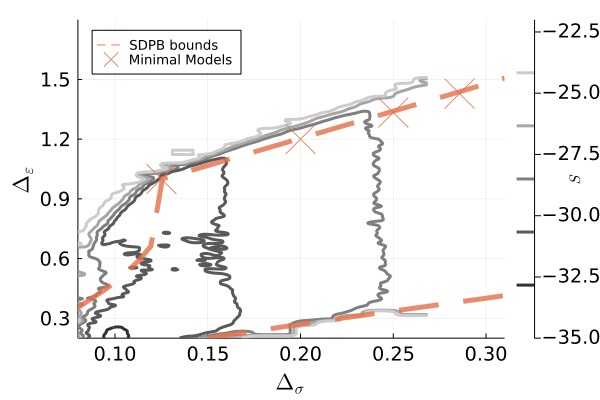

In [11]:

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, 
clim=(-35,-22),
levels = 5,
line=(3),
colorbar_title=L"S",
)


 plot!(extremalLine2dBehanHi[:,1],extremalLine2dBehanHi[:,2],label="SDPB bounds",
line=(:dash, 5,0.8))
 plot!(extremalLine2dBehanLo[:,1],extremalLine2dBehanLo[:,2],label=nothing,
line=(:dash, 5,0.8),color=2)

ylims!(0.2,1.8),
xlims!(0.08,0.31)
plot!(legend=:topleft)
contourAndExtremalPlot =scatter!(
    minimalModels[:,1],
    minimalModels[:,2],
    label="Minimal Models",
    marker=(:x,15,),
    color=2,
    xaxis=L"\Delta_\sigma",
    yaxis=L"\Delta_\epsilon",
)

#### proof of instability in $\Delta_\sigma$

In [2]:
path = "/home/puercoerrante/fortranTests/2d/2022c23-gridInitialPoints-d2"
cd(path)

In [3]:

   spins=readdlm("n1")[15:end,1] |> Vector{Int}

nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

9-element BitVector:
 0
 1
 0
 0
 0
 1
 1
 0
 0

In [4]:
inits = Matrix{Float64}[ ]
		dsig0 = (stDim-2)/2 + 0.005
		dsig1 = (stDim-2)/2 + 0.2
		deps0 = (stDim-2) - 0.1
		deps1 = (stDim-2) + 0.9
		for dsig in dsig0:0.01:dsig1, deps in deps0:0.1:deps1
            push!(inits, [dsig deps -10])
        end

UndefVarError: UndefVarError: stDim not defined

In [5]:
trajectoriesMC = Matrix{Float64}[ ]
endPointsMC = Vector{Float64}[ ]

nMins = 220
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l n$i.dat`,String))
                dd =readdlm("n$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtraj = Float64.(dd[1:end,:])
                cleanTraj = [ddtraj[:,1] leadingScalar ddtraj[:,10]]
                push!(endPointsMC, cleanTraj[end,:] )
                
                push!(trajectoriesMC,[
                    inits[i]
                    #[ddtrajInit[:,1] leadingScalar ddtrajInit[:,10]]
                    cleanTraj
                ])
            end
            catch e
                @show i
                @show e
            
        end
    end
endPointsMC = vcat([x' for x in endPointsMC]...)

i = 1
e = 

BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))


i = 2
e = 

BoundsError(Matrix{Float64}[], (2,))
i = 3
e = BoundsError(Matrix{Float64}[], (3,))
i = 4
e = BoundsError(Matrix{Float64}[], (4,))
i = 5
e = BoundsError(Matrix{Float64}[], (5,))
i = 6
e = BoundsError(Matrix{Float64}[], (6,))
i = 7
e = BoundsError(Matrix{Float64}[], (7,))
i = 8
e = BoundsError(Matrix{Float64}[], (8,))
i = 9
e = BoundsError(Matrix{Float64}[], (9,))
i = 10
e = BoundsError(Matrix{Float64}[], (10,))
i = 11
e = BoundsError(Matrix{Float64}[], (11,))
i = 12
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 13
e = BoundsError(Matrix{Float64}[], (13,))
i = 14
e = BoundsError(Matrix{Float64}[], (14,))
i = 15
e = BoundsError(Matrix{Float64}[], (15,))
i = 16
e = BoundsError(Matrix{Float64}[], (16,))
i = 17
e = BoundsError(Matrix{Float64}[], (17,))
i = 18
e = BoundsError(Matrix{Float64}[], (18,))
i = 19
e = BoundsError(Matrix{Float64}[], (19,))
i = 20
e = BoundsError(Matrix{Float64}[], (20,))
i = 21
e = BoundsError(Matrix{Float64}[], (21,))


i = 22
e = BoundsError(Matrix{Float64}[], (22,))
i = 23
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 24
e = BoundsError(Matrix{Float64}[], (24,))
i = 25
e = BoundsError(Matrix{Float64}[], (25,))
i = 26
e = BoundsError(Matrix{Float64}[], (26,))
i = 27
e = BoundsError(Matrix{Float64}[], (27,))
i = 28
e = BoundsError(Matrix{Float64}[], (28,))
i = 29
e = BoundsError(Matrix{Float64}[], (29,))
i = 30
e = BoundsError(Matrix{Float64}[], (30,))
i = 31
e = BoundsError(Matrix{Float64}[], (31,))
i = 32
e = BoundsError(Matrix{Float64}[], (32,))
i = 33
e = BoundsError(Matrix{Float64}[], (33,))
i = 34
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 35
e = BoundsError(Matrix{Float64}[], (35,))
i = 36
e = BoundsError(Matrix{Float64}[], (36,))
i = 37
e = BoundsError(Matrix{Float64}[], (37,))
i = 38
e = BoundsError(Matrix{Float64}[], (38,))
i = 39
e = BoundsError(Matrix{Float64}[], (39,))
i = 40
e = BoundsError(Matrix{Float64}[], (40,))
i = 41
e = BoundsError(Matrix{Float64}[], (41

BoundsError(Matrix{Float64}[], (42,))
i = 43
e = BoundsError(Matrix{Float64}[], (43,))
i = 44
e = BoundsError(Matrix{Float64}[], (44,))
i = 45
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 46
e = BoundsError(Matrix{Float64}[], (46,))
i = 47
e = BoundsError(Matrix{Float64}[], (47,))
i = 48
e = BoundsError(Matrix{Float64}[], (48,))
i = 49
e = BoundsError(Matrix{Float64}[], (49,))
i = 50
e = BoundsError(Matrix{Float64}[], (50,))
i = 51
e = BoundsError(Matrix{Float64}[], (51,))
i = 52
e = BoundsError(Matrix{Float64}[], (52,))
i = 53
e = BoundsError(Matrix{Float64}[], (53,))
i = 54
e = BoundsError(Matrix{Float64}[], (54,))
i = 55
e = BoundsError(Matrix{Float64}[], (55,))
i = 56
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 57
e = BoundsError(Matrix{Float64}[], (57,))
i = 58
e = BoundsError(Matrix{Float64}[], (58,))
i = 59
e = 

BoundsError(Matrix{Float64}[], (59,))
i = 60
e = BoundsError(Matrix{Float64}[], (60,))
i = 61
e = BoundsError(Matrix{Float64}[], (61,))
i = 62
e = BoundsError(Matrix{Float64}[], (62,))
i = 63
e = BoundsError(Matrix{Float64}[], (63,))
i = 64
e = BoundsError(Matrix{Float64}[], (64,))
i = 65
e = BoundsError(Matrix{Float64}[], (65,))
i = 66
e = BoundsError(Matrix{Float64}[], (66,))
i = 67
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 68
e = BoundsError(Matrix{Float64}[], (68,))
i = 69
e = BoundsError(Matrix{Float64}[], (69,))
i = 70
e = BoundsError(Matrix{Float64}[], (70,))
i = 71
e = BoundsError(Matrix{Float64}[], (71,))
i = 72
e = BoundsError(Matrix{Float64}[], (72,))
i = 73
e = BoundsError(Matrix{Float64}[], (73,))
i = 74
e = BoundsError(Matrix{Float64}[], (74,))
i = 75
e = BoundsError(Matrix{Float64}[], (75,))
i = 76
e = BoundsError(Matrix{Float64}[], (76,))
i = 77
e = BoundsError(Matrix{Float64}[], (77,))
i = 78
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 79


BoundsError(Matrix{Float64}[], (79,))
i = 80
e = BoundsError(Matrix{Float64}[], (80,))
i = 81
e = BoundsError(Matrix{Float64}[], (81,))
i = 82
e = BoundsError(Matrix{Float64}[], (82,))
i = 83
e = BoundsError(Matrix{Float64}[], (83,))
i = 84
e = BoundsError(Matrix{Float64}[], (84,))
i = 85
e = BoundsError(Matrix{Float64}[], (85,))
i = 86
e = BoundsError(Matrix{Float64}[], (86,))
i = 87
e = BoundsError(Matrix{Float64}[], (87,))
i = 88
e = BoundsError(Matrix{Float64}[], (88,))
i = 89
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 90
e = BoundsError(Matrix{Float64}[], (90,))


i = 91
e = BoundsError(Matrix{Float64}[], (91,))
i = 92
e = BoundsError(Matrix{Float64}[], (92,))
i = 93
e = BoundsError(Matrix{Float64}[], (93,))
i = 94
e = BoundsError(Matrix{Float64}[], (94,))
i = 95
e = BoundsError(Matrix{Float64}[], (95,))
i = 96
e = BoundsError(Matrix{Float64}[], (96,))
i = 97
e = BoundsError(Matrix{Float64}[], (97,))
i = 98
e = BoundsError(Matrix{Float64}[], (98,))
i = 99
e = BoundsError(Matrix{Float64}[], (99,))
i = 100
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 101
e = BoundsError(Matrix{Float64}[], (101,))
i = 102
e = BoundsError(Matrix{Float64}[], (102,))
i = 103
e = BoundsError(Matrix{Float64}[], (103,))
i = 104
e = BoundsError(Matrix{Float64}[], (104,))
i = 105
e = BoundsError(Matrix{Float64}[], (105,))
i = 106
e = 

BoundsError(Matrix{Float64}[], (106,))
i = 107
e = BoundsError(Matrix{Float64}[], (107,))
i = 108
e = BoundsError(Matrix{Float64}[], (108,))
i = 109
e = BoundsError(Matrix{Float64}[], (109,))
i = 110
e = BoundsError(Matrix{Float64}[], (110,))
i = 111
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 112
e = BoundsError(Matrix{Float64}[], (112,))
i = 113
e = BoundsError(Matrix{Float64}[], (113,))
i = 114
e = BoundsError(Matrix{Float64}[], (114,))
i = 115
e = BoundsError(Matrix{Float64}[], (115,))
i = 116
e = BoundsError(Matrix{Float64}[], (116,))
i = 117
e = BoundsError(Matrix{Float64}[], (117,))
i = 118
e = BoundsError(Matrix{Float64}[], (118,))
i = 119
e = BoundsError(Matrix{Float64}[], (119,))
i = 120
e = BoundsError(Matrix{Float64}[], (120,))
i = 121
e = 

BoundsError(Matrix{Float64}[], (121,))
i = 122
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 123
e = BoundsError(Matrix{Float64}[], (123,))
i = 124
e = BoundsError(Matrix{Float64}[], (124,))
i = 125
e = BoundsError(Matrix{Float64}[], (125,))
i = 126
e = BoundsError(Matrix{Float64}[], (126,))
i = 127
e = BoundsError(Matrix{Float64}[], (127,))
i = 128
e = BoundsError(Matrix{Float64}[], (128,))
i = 129
e = BoundsError(Matrix{Float64}[], (129,))
i = 130
e = BoundsError(Matrix{Float64}[], (130,))
i = 131
e = BoundsError(Matrix{Float64}[], (131,))
i = 132
e = BoundsError(Matrix{Float64}[], (132,))
i = 133
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 134
e = BoundsError(Matrix{Float64}[], (134,))
i = 135
e = BoundsError(Matrix{Float64}[], (135,))
i = 136
e = BoundsError(Matrix{Float64}[], (136,))
i = 137
e = BoundsError(Matrix{Float64}[], (137,))
i = 138
e = BoundsError(Matrix{Float64}[], (138,))
i = 139
e = BoundsError(Matrix{Float64}[], (139,))


i = 140
e = BoundsError(Matrix{Float64}[], (140,))
i = 141
e = BoundsError(Matrix{Float64}[], (141,))
i = 142
e = BoundsError(Matrix{Float64}[], (142,))
i = 143
e = BoundsError(Matrix{Float64}[], (143,))
i = 144
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 145
e = BoundsError(Matrix{Float64}[], (145,))
i = 146
e = BoundsError(Matrix{Float64}[], (146,))
i = 147
e = BoundsError(Matrix{Float64}[], (147,))
i = 148
e = BoundsError(Matrix{Float64}[], (148,))
i = 149
e = BoundsError(Matrix{Float64}[], (149,))
i = 150
e = BoundsError(Matrix{Float64}[], (150,))
i = 151
e = 

BoundsError(Matrix{Float64}[], (151,))
i = 152
e = BoundsError(Matrix{Float64}[], (152,))
i = 153
e = BoundsError(Matrix{Float64}[], (153,))
i = 154
e = BoundsError(Matrix{Float64}[], (154,))
i = 155
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 156
e = BoundsError(Matrix{Float64}[], (156,))
i = 157
e = BoundsError(Matrix{Float64}[], (157,))
i = 158
e = BoundsError(Matrix{Float64}[], (158,))
i = 159
e = BoundsError(Matrix{Float64}[], (159,))
i = 160
e = BoundsError(Matrix{Float64}[], (160,))
i = 161
e = BoundsError(Matrix{Float64}[], (161,))
i = 162
e = BoundsError(Matrix{Float64}[], (162,))
i = 163
e = BoundsError(Matrix{Float64}[], (163,))
i = 164
e = BoundsError(Matrix{Float64}[], (164,))
i = 165
e = BoundsError(Matrix{Float64}[], (165,))
i = 166
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))


i = 167
e = BoundsError(Matrix{Float64}[], (167,))
i = 168
e = BoundsError(Matrix{Float64}[], (168,))
i = 169
e = BoundsError(Matrix{Float64}[], (169,))
i = 170
e = BoundsError(Matrix{Float64}[], (170,))
i = 171
e = BoundsError(Matrix{Float64}[], (171,))
i = 172
e = BoundsError(Matrix{Float64}[], (172,))
i = 173
e = BoundsError(Matrix{Float64}[], (173,))
i = 174
e = BoundsError(Matrix{Float64}[], (174,))
i = 175
e = BoundsError(Matrix{Float64}[], (175,))
i = 176
e = BoundsError(Matrix{Float64}[], (176,))
i = 177
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 178
e = BoundsError(Matrix{Float64}[], (178,))
i = 179
e = BoundsError(Matrix{Float64}[], (179,))


i = 180
e = BoundsError(Matrix{Float64}[], (180,))
i = 181
e = BoundsError(Matrix{Float64}[], (181,))
i = 182
e = BoundsError(Matrix{Float64}[], (182,))
i = 183
e = BoundsError(Matrix{Float64}[], (183,))
i = 184
e = BoundsError(Matrix{Float64}[], (184,))
i = 185
e = BoundsError(Matrix{Float64}[], (185,))
i = 186
e = BoundsError(Matrix{Float64}[], (186,))
i = 187
e = BoundsError(Matrix{Float64}[], (187,))
i = 188
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 189
e = BoundsError(Matrix{Float64}[], (189,))
i = 190
e = BoundsError(Matrix{Float64}[], (190,))
i = 191
e = BoundsError(Matrix{Float64}[], (191,))
i = 192
e = BoundsError(Matrix{Float64}[], (192,))
i = 193
e = BoundsError(Matrix{Float64}[], (193,))
i = 194
e = BoundsError(Matrix{Float64}[], (194,))
i = 195
e = BoundsError(Matrix{Float64}[], (195,))
i = 196
e = BoundsError(Matrix{Float64}[], (196,))
i = 197
e = 

BoundsError(Matrix{Float64}[], (197,))
i = 198
e = BoundsError(Matrix{Float64}[], (198,))
i = 199
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))
i = 200
e = BoundsError(Matrix{Float64}[], (200,))
i = 201
e = BoundsError(Matrix{Float64}[], (201,))
i = 202
e = BoundsError(Matrix{Float64}[], (202,))
i = 203
e = BoundsError(Matrix{Float64}[], (203,))
i = 204
e = BoundsError(Matrix{Float64}[], (204,))
i = 205
e = BoundsError(Matrix{Float64}[], (205,))
i = 206
e = BoundsError(Matrix{Float64}[], (206,))
i = 207
e = BoundsError(Matrix{Float64}[], (207,))
i = 208
e = BoundsError(Matrix{Float64}[], (208,))
i = 209
e = BoundsError(Matrix{Float64}[], (209,))
i = 210
e = BoundsError(Any[1 0.0 2.0; -0.1 "" ""], (1, 1:9))


i = 211
e = BoundsError(Matrix{Float64}[], (211,))
i = 212
e = BoundsError(Matrix{Float64}[], (212,))
i = 213
e = BoundsError(Matrix{Float64}[], (213,))
i = 214
e = BoundsError(Matrix{Float64}[], (214,))
i = 215
e = BoundsError(Matrix{Float64}[], (215,))
i = 216
e = BoundsError(Matrix{Float64}[], (216,))
i = 217
e = BoundsError(Matrix{Float64}[], (217,))
i = 218
e = BoundsError(Matrix{Float64}[], (218,))
i = 219
e = BoundsError(Matrix{Float64}[], (219,))
i = 220
e = BoundsError(Matrix{Float64}[], (220,))


200×3 Matrix{Float64}:
  1.21911e-8   0.000126165  -71.0178
 -0.0          0.0905989    -Inf
  0.0          0.197414     -Inf
  0.0          0.120275     -Inf
 -0.0          0.392095     -Inf
 -0.0          0.207649     -Inf
  0.0          0.577587     -Inf
 -0.0          0.115802     -Inf
 -0.0          0.796196     -Inf
 -0.0          0.465065     -Inf
  ⋮                         
  1.97873e-8   4.18267e-5   -70.9145
  0.000139448  0.000266904  -51.8634
  3.95458e-7   0.000142595  -71.0734
  3.33349e-7   6.57565e-5   -70.5774
  1.25131e-9   5.01834e-5   -71.0468
  0.000425275  0.000598045  -48.0855
  1.93293e-7   1.4387e-5    -71.638
  4.97598e-9   0.00106538   -71.6278
  1.55742e-8   0.00060274   -70.5371

In [ ]:
trajectoriesMC[200]

In [ ]:
bb=deepcopy(contourAndExtremalPlot);
i=1
for dd in trajectoriesMC[2:5:end]
    if i!=2
        plot!(bb,
            dd[:,1],
            dd[:,2],
            line = (
            5,0.6
            ),
            label = nothing,
            color=i
        )
    end
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,L"\Delta_\sigma")
        yaxis!(bb,L"\Delta_\epsilon")
        plot!(bb,legend=:topleft)
        xlims!(bb,0.0,0.2)
        ylims!(bb,0.0,1)

In [ ]:

        plot!(bb,
            trajectoriesMC[10][:,1],
            trajectoriesMC[10][:,2],
            line = (
            5,0.6
            ),
            label = nothing,
            color=i
        )

In [ ]:

        plot!(bb,
            trajectoriesMC[21][:,1],
            trajectoriesMC[21][:,2],
            line = (
            5,0.6
            ),
            label = nothing,
            color=i+1
        )

In [ ]:

        plot!(bb,
            trajectoriesMC[12*11 + 4][:,1],
            trajectoriesMC[12*11 + 4][:,2],
            line = (
            5,0.6
            ),
            label = nothing,
            color=i+2
        )

In [ ]:
plot!(bb, 
    colorbar_title=L"S"
)

In [ ]:
savefig(bb,"../lowTMCevolutiond2.pdf")

##### all $\ell_{max}$ analysis

In [ ]:
stDim=2

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("2d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        #sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:
    actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && dd[2] > 0.8 && getAction(sec,dd)<actionCutoff && length(sec)==5];
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
    ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    #label = L"\ell_{max} ="*"$lLimit" 
    label=nothing,
)

In [ ]:
actionCutoff=-25
for lLimit in [5]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$lLimit" 
)
end

We take all the minima and compute the mean and std to obtain an empiric cutoff defined as
$S_{cutoff}  = \bar S + 2\sigma_S$

In [ ]:
cutoffAtlmax = Dict()
actionCutoff=-2
for lLimit in [6,5,4,3]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    cutoffAtlmax[lLimit] = Statistics.mean(actionsVec) + 5*Statistics.std(actionsVec)
end

In [ ]:
cutoffAtlmax[5]=20

In [ ]:

bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.1,0.3],label="GFT",line=( 5,0.8), color=3)
for lLimit in [5,4,3]
#actionCutoff=cutoffAtlmax[lLimit]
actionCutoff= -2
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 5
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$(2*lLimit - 2)" 
)
end
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")

In [ ]:
savefig(bb,"../d2-multiLmaxPlot.pdf")

###### Comparing MC to exact generalized MMs

In [ ]:
writedlm("../MClmax8Data.dat",vcat([
                hcat([dsig ],
     Statistics.mean([
                hcat([[ getOpDelta(sec,dd,l,n) l getOpOPE(sec,dd,l,n)] for l in 0:2:6 for n in 0:1 ]...) 
                for (sec,dd) in specsToPlotGlobal[(2,true,dsig)] if dd[2] > 0.9 && length(sec) == 5  ]
     )
                )[1,1:end-3]

for dsig in [1/8, 0.15, 0.175, 0.2,  0.223606797749979 , 0.25, 2/7,0.3]
]'...))

In [ ]:
dataForMarco = [
]
for dsig in [1/8, 0.15, 0.175, 0.2, 0.25, 0.223606797749979 , 0.25, 0.3]
    push!(dataForMarco, 
     Statistics.mean(
        [[dd[1] dd[2] getC(sec,dd,stDim) sqrt(getOpOPE(sec,dd,0,0) )] for (sec,dd) in specsToPlotGlobal[(2,true,dsig)] if dd[2] > 0.9]
    )
    ,
    Statistics.std(
        [[dd[1] dd[2] getC(sec,dd,stDim) sqrt(getOpOPE(sec,dd,0,0) )] for (sec,dd) in specsToPlotGlobal[(2,true,dsig)] if dd[2] > 0.9]
    )
    
)
end

In [ ]:
round(1.0435345345,digits=4)

In [ ]:
round5(x) = round(x, digits=5)
round5.(vcat(dataForMarco...))

In [ ]:
for line in dataForMarco
        @show round(line[1])
end


##### Branch Analysis

In [76]:
#get the data
specsToPlotGlobal = Dict()
nMinima = Dict()
for dir in directoriesToAnalyze
    occursin("2d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
        #continue
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 5, cleanMinima)
        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains]
        nMinima[(stDim,DTfixed,dsig)] = length(cleanMinima)
    catch e
        @show dir, e
    end

end

dir = "/home/puercoerrante/fortranTests/2d/2022a28-dsig0.2857142857142857-dtFixedtrue"
length(allBranches) = 

10
dir = "/home/puercoerrante/fortranTests/2d/2022a28-dsig0.2857142857142857-dtFixedfalse"
length(allBranches) = 

12331
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-34.31792764453045, -34.31672666431528)
(i, j) = (1, 2)
keeping 1(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-34.25697068751355, -34.25392939319173)
(i, j) = (6, 19)
keeping 6

dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.2-dtFixedtrue"
length(allBranches) = 14
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.2-dtFixedfalse"
length(allBranches) = 31
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.223606797749979-dtFixedtrue"
length(allBranches) = 12
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.223606797749979-dtFixedfalse"
length(allBranches) = 518
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.75333653458421, -35.75292085625577)
(i, j) = (1, 2)
keeping 1(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.75333653458421, -35.75278334993789)
(i, j) = (1, 4)
keeping 1keeping 8keeping 8dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.175-dtFixedfalse"
length(allBranches) = 

574
keeping 6keeping 11dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.15-dtFixedtrue"
length(allBranches) = 38
keeping 2dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.15-dtFixedfalse"
length(allBranches) = 283
keeping 15keeping 7(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-37.90710599437291, -37.90342471568376)
(i, j) = (4, 9)
keeping 4keeping 15(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-37.90878828849126, -37.9070554870214)
(i, j) = (7, 11)
keeping 7dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.175-dtFixedtrue"
length(allBranches) = 18
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.3-dtFixedtrue"
length(allBranches) = 11
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.25-dtFixedtrue"
length(allBranches) = 5
dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.3-dtFixedfalse"
length(allBranches) = 

6282
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-34.01878888034987, -34.01876947877205)
(i, j) = (2, 8)
keeping 2keeping 10(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-34.02038668661288, -34.02035491743811)
(i, j) = (9, 15)
keeping 9dir = 

"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.25-dtFixedfalse"


length(allBranches) = 2077
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.11121018088765, -35.11116365879991)
(i, j) = (3, 7)
keeping 3keeping 15keeping 15(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.11175716224026, -35.11111981514166)
(i, j) = (14, 16)
keeping 14dir = 

"/home/puercoerrante/fortranTests/2d/2022c07-dsig0.125-dtFixedtrue"
length(allBranches) = 54
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-38.77634902076333, -38.77466241961967)
(i, j) = (2, 3)
keeping 2dir = "/home/puercoerrante/fortranTests/2d/2022c07-dsig0.125-dtFixedfalse"
length(allBranches) = 135
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-38.83288657641796, -38.83188624044993)
(i, j) = (2, 9)
keeping 2

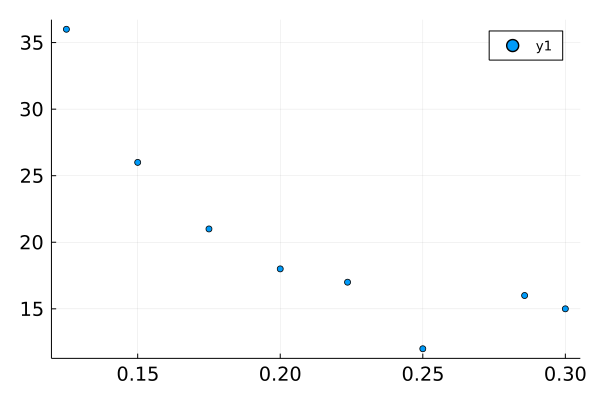

In [77]:
scatter([dsig for ((stDim,xx,dsig),dd) in nMinima if xx],[dd for ((stDim,xx,dsig),dd) in nMinima if xx])

In [ ]:
#get the data
specsToPlotGFT = Dict()
for dir in dirs2dGFT
    occursin("2d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGFT[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains]
        
    catch e
        @show dir, e
    end

end

In [7]:
actionCutoff=-20
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)>=5 && getAction(sec,dd)<actionCutoff ];
unique!(minimaList)
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 4
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


actionToSize (generic function with 1 method)

actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff && dd[2]<0.8 ];
unique!(minimaList)
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
    ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
    color = [Int(getOpDelta(sec,dd,0,1) >2.4) for (sec,dd) in minimaList],
            α=0.4,
    #label = L"\ell_{max} ="*"$lLimit" 
    label=nothing,
    xaxis=L"\Delta_\sigma",
    yaxis=L"\Delta_{\epsilon'}",

)

In [ ]:
savefig("../subleadingScalar.pdf")

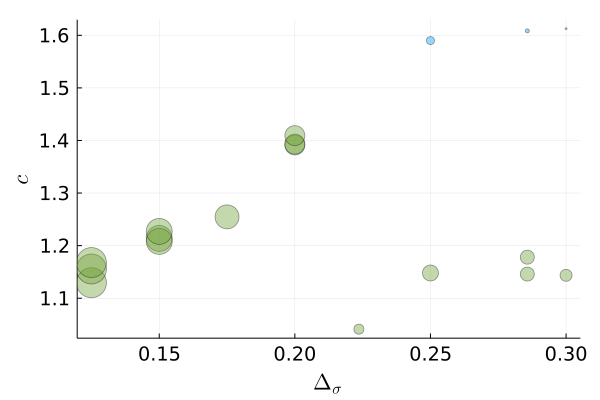

In [5]:
actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff && dd[2]<0.8 ];
unique!(minimaList)
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList],
    ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
    color = [Int(getOpDelta(sec,dd,0,1) >2.4) for (sec,dd) in minimaList],
            α=0.4,
    #label = L"\ell_{max} ="*"$lLimit" 
    label=nothing,
    xaxis=L"\Delta_\sigma",
    yaxis=L"c",
)


In [ ]:
savefig("../centralChargeScalar.pdf")

In [ ]:
[dd[1] for (sec,dd) in minimaList]
#0.22360 -  sqrt(5)/10

In [ ]:
n=1
l=2
[[getOpDelta(sec,dd,l,n) getOpOPE(sec,dd,l,n)] for (sec,dd) in minimaList if dd[2]>0.8 && dd[1]==0.3]

In [6]:
actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff ];
unique!(minimaList)
minimaListGFT = []
minimaListGFT = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGFT for (sec,dd) in minima if DTfixed && length(sec)==5  && getAction(sec,dd)<actionCutoff];
unique!(minimaListGFT)
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for  (sec,dd) in [minimaList...,minimaListGFT...] ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 3
maxSize = 9
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


UndefVarError: UndefVarError: specsToPlotGFT not defined

In [ ]:
writedlm("../2dMinimaDTd.dat",[[sectorToString(sec) dd'] for (sec,dd) in minimaList])

In [ ]:
writedlm("../2dMinimaDTd-GFTLike.dat",[[sectorToString(sec) dd'] for (sec,dd) in minimaList if dd[2]<0.8])

In [ ]:
writedlm("../2dMinimaDTGFT.dat",[[sectorToString(sec) dd'] for (sec,dd) in minimaListGFT])

In [ ]:

minimaListFree = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if !DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff ];
writedlm("../2dMinimaDTFree.dat",[[sectorToString(sec) dd'] for (sec,dd) in minimaListFree])

In [ ]:
scatter(actionsVec)

In [8]:
bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.1,0.3],label="GFT",line=( 5,0.8), color=3)

scatter!(bb,
    [dd[1] for (sec,dd) in minimaList if dd[2]>0.8],
    [dd[2] for (sec,dd) in minimaList if dd[2]>0.8],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList if dd[2]>0.8 ], 
            α=0.4,
    label = nothing ,color=1
)
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList if dd[2]<0.8],
    [dd[2] for (sec,dd) in minimaList if dd[2]<0.8],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList if dd[2]<0.8], 
            α=0.4,
    label = nothing ,color=3
)


        #title!(L"d = 3, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")
        #xlims!(bb, (0.1,0.3))
        #ylims!(bb, (0.9,1.75))



UndefVarError: UndefVarError: contourAndExtremalPlot not defined

###### getting sqrt(5)/10 point

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.2236",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
isolatedMinimum = filter(x->x[2][2]>1.2 && getAction(x...)<-35 &&length(x[1])==5,cleanMinima)

In [ ]:
filter(x->x[2][1]==0.3 && x[2][2]>0.7, minimaList)

In [ ]:

scatter!(bb,
    [dd[1] for (sec,dd) in isolatedMinimum ],
    [dd[2] for (sec,dd) in isolatedMinimum ],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in isolatedMinimum], 
            α=0.4,
    label = nothing ,color=1
)

###### getting 0.175 point

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.175-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
isolatedMinimum = filter(x->x[2][2]>1. && getAction(x...)<-25 &&length(x[1])==5,cleanMinima)

In [ ]:
filter(x->x[2][1]==0.3 && x[2][2]>0.7, minimaList)

In [ ]:

scatter!(bb,
    [dd[1] for (sec,dd) in isolatedMinimum ],
    [dd[2] for (sec,dd) in isolatedMinimum ],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in isolatedMinimum], 
            α=0.4,
    label = nothing ,color=1
)

In [ ]:
savefig(bb,"../2d-generalSpectrum-overview-DTfixed.pdf")

In [ ]:

scatter!(bb,
    [dd[1] for (sec,dd) in minimaListGFT],
    [dd[2] for (sec,dd) in minimaListGFT],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaListGFT], 
            α=0.4,
            #marker=(:square),
    label = L"\Delta_T = 2\Delta_\sigma  + 2 " ,color=2,
)


In [ ]:
savefig(bb,"../d2-GFTvsDTdcomparison.pdf")

In [ ]:
 d2-cvsdsig-compariso

#### counting Sectors

In [ ]:
sectorToLatex(minimaList[1][1])

In [ ]:
secStrings = [sectorToLatex(sec) for (sec,dd) in minimaList]
c = Counter{String}()
incr!(c,secStrings)

output = raw"Sector & frequency \\ "
for (i,sec) in enumerate(c) 
    tmp = c[sec]
    output*=" \n $(sec) & \$ $(tmp) \$ \\\\"
end

In [ ]:
output

In [ ]:
scatter([dd[2] for (sec,dd) in minimaList],actionsVec,xaxis=L"\Delta_\epsilon",yaxis=L"S")

In [ ]:
bb=deepcopy(contourAndExtremalPlot)

plot!(bb,x->2x,[0.1,0.3],label="GFT",line=( 5,0.8),color=3)

In [ ]:
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = "ΔT fixed" ,color=1
)


In [ ]:
savefig("../$(stDim)d-generalSpectrum-overview-DTfixed.pdf")

In [ ]:
plot();
for branch in chains 
    plot!([maximum(dd[2:sum(sec)+1]) for (sec,dd) in sss],
    [getAction(sec,dd) for (sec,dd) in branch],
    label=nothing,)
end

#### c bounds

In [ ]:
function cfromSigma(σ::Real) 
    m = 3/(1-2σ) -1
    return 1 - 6/(m*(m+1))
end

In [ ]:

plot(extremalLine2dc[:,1],extremalLine2dc[:,2],
label="lower bound (2014)",line=(:dash, 5,0.8),
color=2)
minimaList1 = filter(x->x[2][2]<0.8, minimaList)
minimaList2 = filter(x->x[2][2]>=0.8, minimaList)

plot(cfromSigma,1/8:0.001:0.3,
label = L"Analytic continuation of $c$",
color=2)

scatter!(
    [dd[1] for (sec,dd) in minimaList1],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList1],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList1], 
            α=0.4,
    label = nothing ,color=3,

)

scatter!(
    [dd[1] for (sec,dd) in minimaList2],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList2],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList2], 
            α=0.4,
    label = nothing ,color=1,

)

        yaxis!( L"c")
        xaxis!( L"\Delta_\sigma")

scatter!(minimalModels[:,1], minimalModels[:,3], marker=(:x, 12, ), label = "Minimal Models", color = 2,
legend=:topleft)

In [ ]:

scatter!(
    [dd[1] for (sec,dd) in isolatedMinimum ],
    [getC(sec,dd,stDim) for (sec,dd) in isolatedMinimum ],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in isolatedMinimum], 
            α=0.4,
    label = nothing ,
    color=1
)

In [ ]:
savefig("../d$(stDim)-cvsdsig-comparison.pdf")

In [ ]:
#Here we create the reference plot for the $c vs deps$ plots
mmPlotCvsDeps = 
scatter(minimalModels[:,2], minimalModels[:,3], marker=(:x, 12, ), label = "Minimal Models", color = 2,
legend=:topleft,

        yaxis =  L"c",
        xaxis =  L"\Delta_\epsilon",
)

In [ ]:
dsigRange = 1/8:0.001:0.35
epsOPE = [0.25, 0.251741, 0.253478, 0.255213, 0.256944, 0.258672, 0.260396,  
0.262118, 0.263836, 0.265552, 0.267264, 0.268973, 0.270679, 0.272381,  
0.274081, 0.275778, 0.277471, 0.279162, 0.280849, 0.282534, 0.284215,  
0.285894, 0.28757, 0.289242, 0.290912, 0.292579, 0.294243, 0.295904,  
0.297562, 0.299217, 0.30087, 0.302519, 0.304166, 0.30581, 0.307451,  
0.309089, 0.310725, 0.312358, 0.313988, 0.315615, 0.31724, 0.318861,  
0.320481, 0.322097, 0.323711, 0.325322, 0.32693, 0.328536, 0.330139,  
0.33174, 0.333338, 0.334933, 0.336526, 0.338116, 0.339704, 0.341289,  
0.342871, 0.344451, 0.346029, 0.347604, 0.349176, 0.350746, 0.352313,  
0.353878, 0.355441, 0.357001, 0.358558, 0.360114, 0.361666, 0.363217,  
0.364765, 0.36631, 0.367853, 0.369394, 0.370933, 0.372469, 0.374002,  
0.375534, 0.377063, 0.37859, 0.380114, 0.381636, 0.383156, 0.384673,  
0.386189, 0.387702, 0.389213, 0.390721, 0.392227, 0.393731, 0.395233,  
0.396733, 0.39823, 0.399725, 0.401218, 0.402709, 0.404198, 0.405684,  
0.407169, 0.408651, 0.410131, 0.411609, 0.413084, 0.414558, 0.41603,  
0.417499, 0.418966, 0.420432, 0.421895, 0.423356, 0.424815, 0.426272,  
0.427727, 0.42918, 0.43063, 0.432079, 0.433526, 0.434971, 0.436413,  
0.437854, 0.439293, 0.44073, 0.442164, 0.443597, 0.445028, 0.446457,  
0.447883, 0.449308, 0.450731, 0.452152, 0.453571, 0.454988, 0.456404,  
0.457817, 0.459228, 0.460638, 0.462045, 0.463451, 0.464854, 0.466256,  
0.467656, 0.469054, 0.470451, 0.471845, 0.473237, 0.474628, 0.476017,  
0.477404, 0.478789, 0.480172, 0.481554, 0.482933, 0.484311, 0.485687,  
0.487061, 0.488434, 0.489804, 0.491173, 0.49254, 0.493905, 0.495269,  
0.49663, 0.49799, 0.499348, 0.500704, 0.502059, 0.503412, 0.504763,  
0.506112, 0.50746, 0.508805, 0.510149, 0.511492, 0.512832, 0.514171,  
0.515508, 0.516844, 0.518177, 0.519509, 0.52084, 0.522168, 0.523495,  
0.52482, 0.526144, 0.527466, 0.528786, 0.530104, 0.531421, 0.532736,  
0.534049, 0.535361, 0.536671, 0.537979, 0.539286, 0.540591, 0.541894,  
0.543196, 0.544496, 0.545795, 0.547091, 0.548386, 0.54968, 0.550972,  
0.552262, 0.55355, 0.554837, 0.556123, 0.557406, 0.558688, 0.559969,  
0.561247, 0.562525, 0.5638, 0.565074, 0.566346, 0.567617, 0.568886,  
0.570154, 0.571419, 0.572684, 0.573946, 0.575207, 0.576467, 0.577724,  
0.578981, 0.580235]

epsDelta=[1., 1.00267, 1.00533, 1.008, 1.01067, 1.01333, 1.016, 1.01867,  
1.02133, 1.024, 1.02667, 1.02933, 1.032, 1.03467, 1.03733, 1.04,  
1.04267, 1.04533, 1.048, 1.05067, 1.05333, 1.056, 1.05867, 1.06133,  
1.064, 1.06667, 1.06933, 1.072, 1.07467, 1.07733, 1.08, 1.08267,  
1.08533, 1.088, 1.09067, 1.09333, 1.096, 1.09867, 1.10133, 1.104,  
1.10667, 1.10933, 1.112, 1.11467, 1.11733, 1.12, 1.12267, 1.12533,  
1.128, 1.13067, 1.13333, 1.136, 1.13867, 1.14133, 1.144, 1.14667,  
1.14933, 1.152, 1.15467, 1.15733, 1.16, 1.16267, 1.16533, 1.168,  
1.17067, 1.17333, 1.176, 1.17867, 1.18133, 1.184, 1.18667, 1.18933,  
1.192, 1.19467, 1.19733, 1.2, 1.20267, 1.20533, 1.208, 1.21067,  
1.21333, 1.216, 1.21867, 1.22133, 1.224, 1.22667, 1.22933, 1.232,  
1.23467, 1.23733, 1.24, 1.24267, 1.24533, 1.248, 1.25067, 1.25333,  
1.256, 1.25867, 1.26133, 1.264, 1.26667, 1.26933, 1.272, 1.27467,  
1.27733, 1.28, 1.28267, 1.28533, 1.288, 1.29067, 1.29333, 1.296,  
1.29867, 1.30133, 1.304, 1.30667, 1.30933, 1.312, 1.31467, 1.31733,  
1.32, 1.32267, 1.32533, 1.328, 1.33067, 1.33333, 1.336, 1.33867,  
1.34133, 1.344, 1.34667, 1.34933, 1.352, 1.35467, 1.35733, 1.36,  
1.36267, 1.36533, 1.368, 1.37067, 1.37333, 1.376, 1.37867, 1.38133,  
1.384, 1.38667, 1.38933, 1.392, 1.39467, 1.39733, 1.4, 1.40267,  
1.40533, 1.408, 1.41067, 1.41333, 1.416, 1.41867, 1.42133, 1.424,  
1.42667, 1.42933, 1.432, 1.43467, 1.43733, 1.44, 1.44267, 1.44533,  
1.448, 1.45067, 1.45333, 1.456, 1.45867, 1.46133, 1.464, 1.46667,  
1.46933, 1.472, 1.47467, 1.47733, 1.48, 1.48267, 1.48533, 1.488,  
1.49067, 1.49333, 1.496, 1.49867, 1.50133, 1.504, 1.50667, 1.50933,  
1.512, 1.51467, 1.51733, 1.52, 1.52267, 1.52533, 1.528, 1.53067,  
1.53333, 1.536, 1.53867, 1.54133, 1.544, 1.54667, 1.54933, 1.552,  
1.55467, 1.55733, 1.56, 1.56267, 1.56533, 1.568, 1.57067, 1.57333,  
1.576, 1.57867, 1.58133, 1.584, 1.58667, 1.58933, 1.592, 1.59467,  
1.59733, 1.6]

In [ ]:
plot(epsDelta,epsOPE,label="Generalized MMs ",
color=2)
scatter!(
    [dd[2] for (sec,dd) in minimaList if dd[2]>0.9],
    [getOpOPE(sec,dd,0,0) for (sec,dd) in minimaList if dd[2]>0.9],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList if dd[2]>0.9], 
            α=0.4,
    color=1,
    label = nothing,
    xaxis=L"\Delta_\epsilon",
    yaxis=L"$\lambda_{\sigma\sigma\epsilon}^2$",
    legend=:topleft
)
xlims!(0.99,1.55)


In [ ]:

scatter!(
    [dd[2] for (sec,dd) in isolatedMinimum ],
    [getOpOPE(sec,dd,0,0) for (sec,dd) in isolatedMinimum ],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in isolatedMinimum], 
            α=0.4,
    label = nothing ,
    color=1,
)

In [ ]:
xlims!(0.98,1.52)
ylims!(0.23,0.55)

In [ ]:
savefig("../OPEcomparison.pdf")

In [ ]:
scatter!(mmPlotCvsDeps,
    [dd[2] for (sec,dd) in minimaList2],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList2],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList2], 
            α=0.4,
    color=1,
    label = nothing,
    margins = marginConstant 
)

In [ ]:
savefig("../d$(stDim)-cvsdeps-comparison.pdf")

#### Free DT

In [78]:
actionCutoff=-27
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if !DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff ];
unique!(minimaList)
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


actionToSize (generic function with 1 method)

In [79]:
quickFixDictKey(x::Float64) = x ≈ 0.2857143 ? 2/7 : x

quickFixDictKey (generic function with 1 method)

In [80]:
distanceData = vcat([[dd[1] getQuality(gftReferenceValues[2,quickFixDictKey(dd[1])],(sec,dd))] for (sec,dd) in minimaList]...)


175×2 Matrix{Float64}:
 0.25      0.41625
 0.25      0.228359
 0.25      0.00746165
 0.25      0.0298944
 0.25      0.0122676
 0.25      0.00779018
 0.25      0.0060942
 0.25      0.00355907
 0.25      0.00429927
 0.25      0.00313098
 ⋮         
 0.223607  0.461176
 0.223607  0.300105
 0.223607  0.00664269
 0.223607  0.00954684
 0.223607  0.00686237
 0.223607  0.00808239
 0.223607  0.0053022
 0.223607  0.00399073
 0.223607  0.00416915

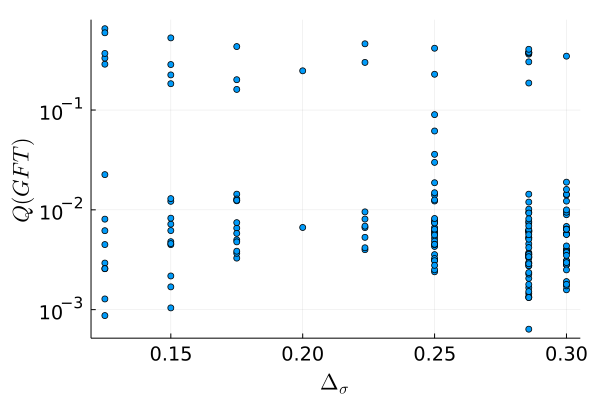

In [81]:
scatter(distanceData[:,1],distanceData[:,2],label=nothing,
xaxis=(L"\Delta_\sigma"),
yaxis=(:log,L"Q(GFT)"))

In [ ]:
savefig("../2dGFTComparison.pdf")

In [ ]:
#bb=deepcopy(contourAndExtremalPlot);
bb=plot()

plot!(bb,x->2x+2,[0.1,0.3],label="GFT",line=( 5,0.8), color=3)

scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = L"\Delta_T \geq d " ,color=1
)
dsig=1/8
dsig125Data = [(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.00089]
scatter!(bb,
    [dd[1] for (sec,dd) in dsig125Data],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in dsig125Data],
 ms = 5, 
            α=0.9,
    label = nothing,
    color=3
)

dsig=3/10
dsig3Data = [(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.0016]
scatter!(bb,
    [dd[1] for (sec,dd) in dsig3Data],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in dsig3Data],
 ms = 5, 
            α=0.9,
    label = nothing,
    color=2
)

        #title!(L"d = 3, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_T")
        #xlims!(bb, (0.1,0.3))
        #ylims!(bb, (0.9,1.75))
        plot!(bb,title = "(a)", 
        #size=3 .* (400,100),margins = 10Plots.PlotMeasures.mm,
        legend = :topleft, )


savefig(bb,"../d2-DTFree-overview.pdf")

In [ ]:
bb

In [ ]:
minimum([ getQuality(gftReferenceValues[2,0.3],(sec,dd)) for (sec,dd) in minimaList if dd[1] == 0.3 ])

In [106]:
# plotting several spectra
dsig=0.125
GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
specsToPlot = [(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.00089]
    refSecVec = containerVector([sec for (sec,xxx) in specsToPlot])

        spinPair = [(2.0*(i-1), refSecVec[i]) for i in 1:length(refSecVec)]
        refTemp = vcat([ GFTdataMatrix[(GFTdataMatrix[:,2].==spin),:][1:min(mult,sum(GFTdataMatrix[:,2].==spin)),:] for (spin, mult) in spinPair]...)

        x = refTemp[1,2]
        y = refTemp[1,1]

            result = plot(
             [x- 0.7,x + 0.1],
            [y,y],
                label=nothing,
            line=(
                2, 0.9,
            ),
                color=:purple,
                        )
        for iOp in 2:length(refTemp[:,1])
            x = refTemp[iOp,2]
            y = refTemp[iOp,1]
            plot!(
                [x-0.7, x + 0.1],
                [y,y],
                label=nothing,
                line=(
                    2, 0.9,
                ),
                color=:purple,
            )
        end

(sec,dd) = specsToPlot[1]
        plot!(result,
            spinVec(sec .+ 1) .- 0.3, 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond,
        ),
                color=3,
        line=(3,0.5),
            label=L"MC $\Delta_\sigma = 1/8$",
        )

dsig=0.3

GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
specsToPlot = [(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.0016]
    refSecVec = containerVector([sec for (sec,xxx) in specsToPlot])

        spinPair = [(2.0*(i-1), refSecVec[i]) for i in 1:length(refSecVec)]
        refTemp = vcat([ GFTdataMatrix[(GFTdataMatrix[:,2].==spin),:][1:min(mult,sum(GFTdataMatrix[:,2].==spin)),:] for (spin, mult) in spinPair]...)

        x = refTemp[1,2]
        y = refTemp[1,1]

        result = plot!(result,
             [x- 0.1,x + 0.7],
            [y,y],
                label=nothing,
            line=(
                2, 0.9,
            ),
                color=:purple,
                        )
        for iOp in 2:length(refTemp[:,1])
            x = refTemp[iOp,2]
            y = refTemp[iOp,1]
            plot!(result,
             [x- 0.1,x + 0.7],
                [y,y],
                label=nothing,
                line=(
                    2, 0.9,
                ),
                color=:purple,
            )
        end

(sec,dd) = specsToPlot[1]
        plot!(result,
            spinVec(sec .+ 1) .+ 0.3, 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond,
        ),
                color=2,
        line=(3,0.5),
            label=L"MC $\Delta_\sigma = 3/10$",
        )

    xaxis!(result, L"\ell")
    yaxis!(result, L"\Delta")
    xticks!(result, 0:2:(length(refSecVec)*2 - 2))
    plot!(result, title="(b)", legend=:bottomright)
savefig(result,"../2dSpecComparison-FreeDT.pdf")

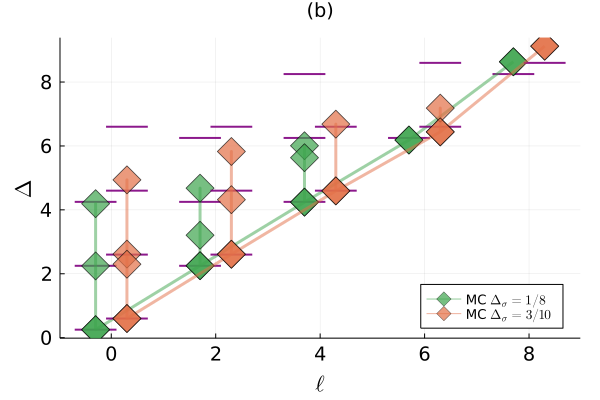

In [107]:
result

In [ ]:
dsig = 1/8


In [ ]:

specsToPlot =[[(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.00089], 
[(sec,dd) for (sec,dd) in minimaListGFT if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.004]
]

In [ ]:
# plotting fixed DT vs free DT
dsig=0.125
GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
 
specsToPlot =[[(sec,dd) for (sec,dd) in minimaList if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.00089][1], 
[(sec,dd) for (sec,dd) in minimaListGFT if dd[1] == dsig && getQuality(gftReferenceValues[2,dsig],(sec,dd))<=0.004][1]
]
    refSecVec = containerVector([sec for (sec,xxx) in specsToPlot])

        spinPair = [(2.0*(i-1), refSecVec[i]) for i in 1:length(refSecVec)]
        refTemp = vcat([ GFTdataMatrix[(GFTdataMatrix[:,2].==spin),:][1:min(mult,sum(GFTdataMatrix[:,2].==spin)),:] for (spin, mult) in spinPair]...)

        result = scatter(
            refTemp[1:end,2] .- 0.5,
            refTemp[1:end,1],
            label=L"GFT $\Delta_\sigma = 1/8$",
            marker=(
                11, 0.4,stroke(2,:black)
            ),
                color=:purple,
                        )

(sec,dd) = specsToPlot[1]
        plot!(result,
            spinVec(sec .+ 1) .- 0.0, 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond,
        ),
                color=1,
        line=(3,0.5),
label=L"\Delta_T \geq 2"
        )

(sec,dd) = specsToPlot[2]
        plot!(result,
            spinVec(sec .+ 1) .+ 0.5, 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond,
        ),
                color=2,
        line=(3,0.5),
label=L"\Delta_T = 2 + 2\Delta_\sigma"
        )


    xaxis!(result, L"\ell")
    yaxis!(result, L"\Delta")
    xticks!(result, 0:2:(length(refSecVec)*2 - 2))
    plot!(result, title="(b)", legend=:topleft)
savefig(result,"../2dSpecComparison-dsig125.pdf")

In [ ]:
dsig=0.125
GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
specsToPlot = [(sec,dd) for (sec,dd) in minimaList if dd[1] == 1/8 && getQuality(gftReferenceValues[2,0.125],(sec,dd))<=0.00089]
pp=plotSpectrum([GFTdataMatrix], specsToPlot, "GFT")
plot!(pp,title =  L"\Delta_T = 2 + 2\Delta_\sigma")
#savefig(pp,"../spectrumDTGFT.pdf")

###### Analyzing distance to GFT

In [ ]:
isingRef = [ 1,2,
ref2dIsing[2,3],
ref2dIsing[3,3],
]
#see usefulBits.m to compute OPE coefficients
gftRef = [ 1/4,2 + 1/4,
2,
0.00703125
]

In [ ]:
dtFreeDists = vcat([[getQuality(isingRef,(sec,dd))  getQuality(gftRef,(sec,dd))] for (sec,dd) in minimaListFree if dd[1] == 1/8]...)
dtdDists = vcat([[getQuality(isingRef,(sec,dd))  getQuality(gftRef,(sec,dd))] for (sec,dd) in minimaList if dd[1] == 1/8]...)
dtGFTDists = vcat([[getQuality(isingRef,(sec,dd))  getQuality(gftRef,(sec,dd))] for (sec,dd) in minimaListGFT if dd[1] == 1/8]...)

In [ ]:
pp=plot(
    xaxis=L"Q(\mathbf{v},\mathbf{v}_{Ising})",
    yaxis=L"Q(\mathbf{v},\mathbf{v}_{GFT})",
)
markerValues = (10,0.8)
scatter!(pp, dtFreeDists[:,1],dtFreeDists[:,2],label=L"\Delta_T \geq 2", marker=markerValues)
scatter!(pp, dtGFTDists[:,1],dtGFTDists[:,2],label=L"\Delta_T = 2 + 2\Delta_\sigma", marker=markerValues)
scatter!(pp, dtdDists[:,1],dtdDists[:,2],label=L"\Delta_T = 2", marker=markerValues)

In [ ]:

plot!(pp,axis=:log,legend=:bottomleft,title="")
savefig(pp,"../distanceIsingvsGFT.pdf")

In [ ]:
distToIsing = [getQuality(isingRef,min) for min in specsToPlot]
distToGFT = [getQuality(gftRef,min) for min in     specsToPlot]


##### Studying the effect of $\Delta_T$

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("2d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains]
        
    catch e
        @show dir, e
    end

end

In [ ]:
actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if !DTfixed && length(sec)==5 && getAction(sec,dd)<actionCutoff ];
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];

In [ ]:
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


###### $\Delta_T$ $\Delta_\sigma$ plane

In [ ]:
[getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList]

In [ ]:
filter(x->x<2.01, [getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList])

In [ ]:

scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.2,
    label = nothing ,color=1
)

In [ ]:

plot!(x->2x + 2,[0.1,0.3],label="GFT",line=( 5,0.8),color=3)

In [ ]:
xaxis!(L"\Delta_\sigma")
yaxis!(L"\Delta_T")
plot!(legend=:topleft,margins = marginConstant)

In [ ]:
savefig("../d$(stDim)-dtvsdsig.pdf")

In [ ]:
cleanMinima = specsToPlotGlobal[2,false,0.125]

In [ ]:
scatter(
    [getOpDelta(sec,dd,2,0) for (sec,dd) in cleanMinima],
    [getAction(sec,dd) for (sec,dd) in cleanMinima]
)

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.25-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 4, cleanMinima);

In [ ]:
scatter(
    [getOpDelta(sec,dd,2,0) for (sec,dd) in cleanMinima],
    [getAction(sec,dd) for (sec,dd) in cleanMinima]
)


##### checking GFT free \Delta_T vs fixed $\Delta_\sigma = 1/8$

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.125-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_T=2$ "
    )

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.125-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter!(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"free $\Delta_T$ "
    )

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.125-",x) && occursin("dtFixedtrue",x) , dirs2dGFT)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter!(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_T = 2\Delta_\sigma +2$ "
    )

In [ ]:
vline!([1/4], label = L"2\Delta_\sigma")

In [ ]:
xlabel!(L"\Delta_\epsilon")
ylabel!(L"S")
#plot!(legend=:bottomright)
title!(L"\Delta_\sigma = 1/8")

In [ ]:
savefig("gft2ddsig125Comparison.pdf")

In [ ]:
pwd()

##### checking GFT free \Delta_T vs fixed $\Delta_\sigma = 0.2$

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.2-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima)

In [ ]:
scatter(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_T=2$ "
    )

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.2-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima)

In [ ]:
scatter!(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"free $\Delta_T$ "
    )

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.2-",x) && occursin("dtFixedtrue",x) , dirs2dGFT)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter!(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_T = 2\Delta_\sigma +2$ "
    )

In [ ]:
vline!([0.4], label = L"2\Delta_\sigma")

In [ ]:
xlabel!(L"\Delta_\epsilon")
ylabel!(L"S")
title!(L"\Delta_\sigma = 0.2")

In [ ]:
savefig("gft2dComparison.pdf")

In [ ]:
pwd()

It is clear that fixing $\Delta_T$ restricts the landscape to points closer to the GFT.

##### exploring branches

We first define the plots in which we will display all the info.

In [ ]:
#dsigdepsPlot=deepcopy(contourAndExtremalPlot)
 dsigdepsPlot = plot(extremalLine2dBehanHi[:,1],extremalLine2dBehanHi[:,2],label="SDPB bounds",
line=(:dash, 5,0.8),color=2)
 plot!(dsigdepsPlot, extremalLine2dBehanLo[:,1],extremalLine2dBehanLo[:,2],label=nothing,
line=(:dash, 5,0.8),color=2)

ylims!(dsigdepsPlot, 0.2,1.8),
xlims!(dsigdepsPlot, 0.09,0.22)
plot!(dsigdepsPlot,legend=:topleft)
contourAndExtremalPlot =scatter!(dsigdepsPlot,
    minimalModels[:,1],
    minimalModels[:,2],
    label="Minimal Models",
    marker=(:x,15,),
    color=2,
    xaxis=L"\Delta_\sigma",
    yaxis=L"\Delta_\epsilon",
)

plot!(dsigdepsPlot,x->2x,[0.1,0.3],label="GFT",
line=( 5,0.8),color=3,
xaxis=L"\Delta_\sigma",
yaxis=L"\Delta_\epsilon",
)

actVSdstarPlot = plot(
    xaxis = L"\Delta^{*}",
    yaxis = L"S",
)


In [ ]:

branchesToPlotDict = Dict()

###### $\Delta_\sigma = 1/8$

In [108]:
path = filter(x-> occursin("2d",x) && occursin("0.125-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [109]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

"Fixed"

In [110]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)
        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)
@show length(cleanMinima)

length(cleanMinima) = 85
length(cleanMinima) = 84


84

In [111]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];



length(allBranches) = 54
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-38.77634902076333, -38.77466241961967)
(i, j) = (2, 3)
keeping 2

In [112]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end

actionToSize (generic function with 1 method)

In [113]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:circle,0.2)
    )
end

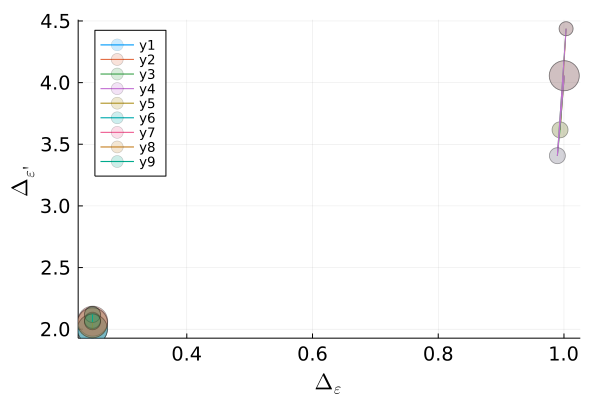

In [114]:
plot!(legend=:topleft)

In [19]:
length.(chains)

12-element Vector{Int64}:
 2
 3
 3
 4
 3
 2
 4
 4
 2
 5
 5
 3

In [20]:
length.(filter(x->x[end][2][2]>0.5, chains))

4-element Vector{Int64}:
 3
 4
 3
 2

In [21]:

branchesToPlotDict["Ising-like"] = filter(x->x[end][2][2]>0.5, chains)[2]

UndefVarError: UndefVarError: branchesToPlotDict not defined

In [22]:
#branchesToPlotDict["GFT-like 1"] = chains[5]

spinOffsetStep = 0.26666666666666666


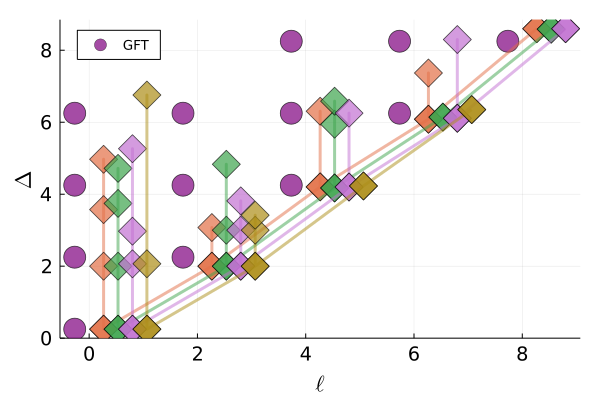

In [23]:
dsig=0.125
GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
pp=plotSpectrum([GFTdataMatrix],filter(x->x[2][2]<0.5,endPoints)|>unique,"GFT")
#savefig(pp,"../2dGFTMinima.pdf")

In [115]:
tmp = deepcopy(filter(x->x[end][2][2]>0.5, chains)[4][end])

([3, 1, 1, 1, 1], [0.125, 1.005370636845729, 4.631063738675404, 4.63413594711159, 2.0, 4.08080259466105, 6.03449177520485, 8.000087076352486, -32.45846893395511, 0.2489341425536572, 0.0001383583365820863, 4.870715665969548e-7, 0.01567636336809142, 0.0002347879834667879, 7.475187244844241e-6, 3.569899220814009e-7])

In [116]:
tmp[1][1]=2
spec1=tmp[2][1:3]
spec2=tmp[2][5:end]
specsToPlot = [filter(x->x[end][2][2]>0.5, chains)[2][end],
(tmp[1], vcat(spec1,spec2))]

2-element Vector{Tuple{Vector{Int64}, Vector{Float64}}}:
 ([2, 2, 2, 1, 1], [0.125, 1.000489907854998, 4.055923263486402, 2.0, 6.203204772039512, 4.025628393166863, 5.742268159443332, 6.030437787766646, 8.452563887780196, -38.49397827889496, 0.2499009535541097, 0.0002340675129249689, 0.01563153939306184, 2.161467975351091e-6, 0.0002283176366097032, 6.677923177994446e-6, 7.510324966968464e-6, 3.475004104260847e-7])
 ([2, 1, 1, 1, 1], [0.125, 1.005370636845729, 4.631063738675404, 2.0, 4.08080259466105, 6.03449177520485, 8.000087076352486, -32.45846893395511, 0.2489341425536572, 0.0001383583365820863, 4.870715665969548e-7, 0.01567636336809142, 0.0002347879834667879, 7.475187244844241e-6, 3.569899220814009e-7])

In [122]:

function plotSpectrum(refs::Vector{Matrix{Float64}}, minimaToPlot,nameTag::String)

    #make things pretty
    halfWidth = 0.7
    spinOffsetStep = (2*halfWidth -0.2) /(length(minimaToPlot)-1)
    @show spinOffsetStep

    refSecVec = containerVector([sec for (sec,xxx) in minimaToPlot])

    function scatterRef(refSecVec::Vector{Int64}, dataMatrix)
        spinPair = [(2.0*(i-1), refSecVec[i]) for i in 1:length(refSecVec)]
        refTemp = vcat([ dataMatrix[(dataMatrix[:,2].==spin),:][1:min(mult,sum(dataMatrix[:,2].==spin)),:] for (spin, mult) in spinPair]...)

        x = refTemp[1,2]
        y = refTemp[1,1]
        result = plot(
            [x-halfWidth, x+halfWidth],
            [y,y],
            label=nameTag,
            line=(
                2, 0.9
            ),
                color=:purple,
        )
        for iOp in 2:length(refTemp[:,1])
            x = refTemp[iOp,2]
            y = refTemp[iOp,1]
            plot!(
                [x-halfWidth, x+halfWidth],
                [y,y],
                label=nothing,
                line=(
                    2, 0.9
                ),
                    color=:purple,
            )
        end
        return result
    end
#need to implement case for more than one reference... can leave out for now


    outputPlot = scatterRef(refSecVec, refs[1])

    for (ii,(sec,dd)) in enumerate(minimaToPlot)
        plot!(outputPlot,
            (spinVec(sec .+ 1) .- halfWidth  .+ 0.1 .+ spinOffsetStep*(ii-1)), 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond
        ),
        line=(3,0.5),
            label = nothing,
        color = ii+1
        )
    end

    xaxis!(outputPlot, L"\ell")
    yaxis!(outputPlot, L"\Delta")
    xticks!(outputPlot, 0:2:(length(refSecVec)*2 - 2))
    plot!(outputPlot, legend=:topleft)

    return outputPlot
end

plotSpectrum (generic function with 1 method)

In [123]:

pp = plotSpectrum([ref2dIsing],specsToPlot,"Ising")
title!(pp, L"\Delta_\sigma = 1/8")
savefig(pp,"../2dIsingMinima.pdf")

spinOffsetStep = 1.2


###### $\Delta_\sigma = 1/5$

In [124]:
path = filter(x-> occursin("2d",x) && occursin("0.2-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)
        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)
@show length(cleanMinima)
        
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2);
endPoints = [x[end] for x in chains];

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


length(cleanMinima) = 60
length(cleanMinima) = 52
length(allBranches) = 14


actionToSize (generic function with 1 method)

In [55]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

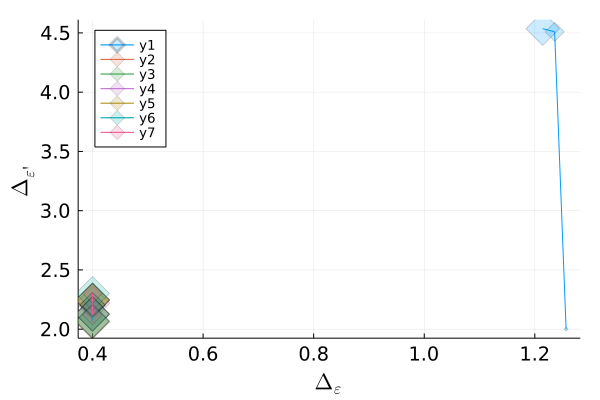

In [56]:
plot!(legend=:topleft)

In [57]:
length.(chains)

8-element Vector{Int64}:
 3
 5
 6
 4
 6
 5
 2
 3

In [58]:
[getAction(sec,dd) for (sec,dd) in endPoints]

8-element Vector{Float64}:
 -36.06633986392149
 -36.27765637325727
 -36.27765637325727
 -36.2580500695771
 -36.27765637325727
 -36.27276077326245
 -29.79411305866202
 -29.79411305866202

In [59]:
length.(filter(x->x[end][2][2]>0.5, chains))

1-element Vector{Int64}:
 3

In [60]:
filter(x->x[end][2][2]>0.5, chains)

1-element Vector{Vector{Tuple{Vector{Int64}, Vector{Float64}}}}:
 [([1, 2, 1], [0.2, 1.256580276183895, 2.0, 4.576770438017104, 4.19079522554851, -22.92650372884212, 0.3567242320996767, 0.03194574413696914, 0.0006843034090200709, 0.0006387646879234773]), ([2, 2, 1, 1], [0.2, 1.235823280511791, 4.509483886423157, 2.0, 3.981141032803359, 4.251147846431375, 6.342525707532426, -29.60340531918198, 0.3619509284042166, 0.000295918506524997, 0.03124222168009588, 0.00107003773614713, 0.0005790479633418468, 2.497314075515276e-5]), ([2, 2, 2, 1, 1], [0.2, 1.21420170430735, 4.535543413125175, 2.0, 3.373330799227645, 4.096017683578984, 6.093403840689294, 6.165132490692384, 8.616350692949526, -36.06633986392149, 0.368596366721963, 0.0004769228278558534, 0.02945582774804573, 0.002091181384202873, 0.0005654785705849263, 3.548834375852821e-5, 2.148735478003639e-5, 1.10077179465011e-6])]

In [61]:

#branchesToPlotDict["MM54-like"] = filter(x->x[end][2][2]>0.5, chains)[1]

In [125]:
gftLikeChains = filter(x->x[end][2][2]<0.5, chains)
length.(gftLikeChains)

7-element Vector{Int64}:
 5
 6
 4
 6
 5
 2
 3

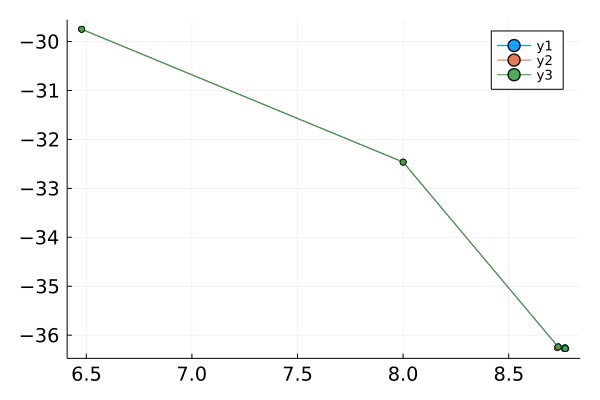

In [63]:
plot()
for chain in gftLikeChains[[2,3,5]]
    plot!([maximum(dd[2:sum(sec)+2]) for (sec,dd) in chain],
    [getAction(sec,dd) for (sec,dd) in chain],
    marker=(0.9)
    )
end
plot!()

In [ ]:
branchesToPlotDict["GFT-like"] = gftLikeChains[5]

In [126]:
dsig=0.2
GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
pp=plotSpectrum([GFTdataMatrix],[x[end] for x in gftLikeChains[[5,2]]],"GFT")
title!(pp, L"\Delta_\sigma = 1/5")
savefig(pp,"../2dGFTMinima.pdf")

spinOffsetStep = 1.2


###### Plotting everything together

In [ ]:
#parameters for size representation
actionsVec =  [getAction(sec,dd) for (name,branch) in  branchesToPlotDict for  (sec,dd) in branch ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
ii = 1
for (name,branch) in branchesToPlotDict
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), 
        #label=name,
        label=nothing,
        color = ii==1 ? 1 : 3,
    )

    plot!(dsigdepsPlot,
        [dd[1] for (sec, dd) in branch],
        [dd[2] for (sec, dd) in branch],
        line= (3,0.5),
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=( 0.7),
        #label=name,
        label=nothing,
        color = ii==1 ? 1 : 3

    )
    ii+=1
end

In [ ]:

wut = readdlm("/home/puercoerrante/fortranTests/2d/2022a12-lowTfromIsing/branch1.dat")

isingMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

In [ ]:

    plot!( actVSdstarPlot,
        [maximum(dd[1:(sum(sec) + 1)]) for (sec,dd) in isingMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in isingMinima],
        label =nothing, #" Ising Ref. Chain",
        marker = (0.7, :square),
        color = 4,
        xaxis=L"\Delta^{*}",
    )

In [ ]:

plot!(dsigdepsPlot,   size = (3/2) .*(300,300), ylims=(0.25,1.4))
plot!(actVSdstarPlot, size = (3/2) .*(500,300), margins = 4Plots.PlotMeasures.mm)

In [ ]:
title!(dsigdepsPlot,  "(a)")
title!(actVSdstarPlot,"(b)")

In [ ]:
savefig(actVSdstarPlot,"../d$(stDim)-actVSdstarPlot.pdf")
savefig(dsigdepsPlot,"../d$(stDim)-dsigdepsPlot.pdf")

###### $\Delta_\sigma = 3/10$

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.3-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
function recursiveNodeConnector(chain::Vector{Tuple{Vector{Int64}, Vector{Float64}}},
goodPairs::Vector,
 roots::Vector{Tuple{Vector{Int64}, Vector{Float64}}})
 
 if chain[end] in roots #|| length(chain) > 6
    return Chain(chain)
 else
    return [ recursiveNodeConnector(vcat(chain,[(s2,d2)]),goodPairs, roots) for ((s1,d1),(s2,d2)) in goodPairs if (s1,d1) == chain[end] ]
 end
end

#branches 
function branchesFromCleanMinima(cleanMinima, relTol::Float64, maxMismatch::Int64)

    ### Constructing pairs and chains
    pairs = []
    for (s1,d1) in cleanMinima, (s2,d2) in cleanMinima
        if compatibleSectors(s1,s2,maxMismatch)
            if areMinimaCompatible(d1,d2,s1,s2,relTol) && getAction(s1,d1)>getAction(s2,d2)
                push!(pairs,((s1,d1),(s2,d2)))
                
            end

        end
    end
    length(pairs)

    leaves = setdiff([ (s1,d1) for ((s1,d1),(s2,d2)) in pairs], [ (s2,d2) for ((s1,d1),(s2,d2)) in pairs])
    roots = setdiff([ (s2,d2) for ((s1,d1),(s2,d2)) in pairs], [ (s1,d1) for ((s1,d1),(s2,d2)) in pairs])
    allBranches = vcat([cleanNestedLists(recursiveNodeConnector([leaf],pairs,roots)) for leaf in leaves]...)
    @show length(allBranches)
    #filter!(chainGoesDown,allBranches)
    branchDict = Dict(b => filter(x-> x[end]==b,allBranches) for b in roots)

    bestBranches = [argmin( weakestLink,list) for (key,list) in branchDict if !isempty(list) ];

    #keep everything
    branchesToPlot =(bestBranches);

    ### matrix of endPoints' Distances

    function compatibleVecDif(v1,v2)
        smallDim,targetDim = minmax(length.([v1,v2])...)
        result = zeros(Int64,targetDim)
        result[1:smallDim] = v1[1:smallDim] - v2[1:smallDim]
        if length(v1) > length(v2)
            result[(smallDim + 1):end] = v1[(smallDim + 1):end]
        else
            result[(smallDim + 1):end] = -v2[(smallDim + 1):end]
        end
        return result
    end
    endPoints = [branch[end] for branch in branchesToPlot];
    distanceMatrix = [maxDistBetweenMinima(min1,min2,sec1,sec2) for (sec1,min1) in endPoints,(sec2,min2) in endPoints]
    sectorsDifMatrix = [compatibleVecDif(sec1,sec2) for (sec1,min1) in endPoints,(sec2,min2) in endPoints]
    m=length(branchesToPlot)
    coincidenceMatrix = []
    for i in 1:m, j in 1:m
        
        if sum(abs.(sectorsDifMatrix[i,j])) < 3 && distanceMatrix[i,j] < 0.2
            push!(coincidenceMatrix, (i,j))
        end
    end
        
        
    # Remove redundances
    nEnds = length(endPoints)
    redundantEndPoints = []
    for i in 1:nEnds, j in i+1:nEnds-1
        if (i,j) in coincidenceMatrix
            (ss1,dd1) = endPoints[i]
            (ss2,dd2) = endPoints[j]
            if dd1[sum(ss1)+2] < dd2[sum(ss2)+2]
                @show dd1[sum(ss1)+2],  dd2[sum(ss2)+2]
                @show (i,j)
                print("keeping $i")
                push!(redundantEndPoints,j)
            else
                print("keeping $j")
                push!(redundantEndPoints,i)
            end
        end
    end


    endPoints = endPoints[setdiff(1:nEnds,redundantEndPoints)]
    dsig = endPoints[1][2][1] 
    isolatedPoints =filter(x->!(x in union(allBranches...) ), cleanMinima);
    goodIsolatedPoints = []
    actionCutoff = 1.1

    for (i,mm) in enumerate(endPoints)

        sameLmaxMinima = filter(x->length(x[1]) == length(mm[1]), cleanMinima)
        actionsToCompare = [ x[2][sum(x[1])+2] for x in sameLmaxMinima]

        endPointAction = mm[2][sum(mm[1])+2]
        if sum(x<endPointAction for x in actionsToCompare)/length(actionsToCompare) < 0.05
            push!(goodIsolatedPoints,mm)
        end

    end


    goodEndPoints = []
    for (i,mm) in enumerate(endPoints)

        sameLmaxMinima = filter(x->length(x[1]) == length(mm[1]), cleanMinima)
        actionsToCompare = [ x[2][sum(x[1])+2] for x in sameLmaxMinima]

        endPointAction = mm[2][sum(mm[1])+2]
        if sum(x<=endPointAction for x in actionsToCompare)/length(actionsToCompare) < actionCutoff
            push!(goodEndPoints,i)
        end

    end
    #choosing groups
    specsToPlot = vcat(endPoints[goodEndPoints],goodIsolatedPoints)
    return specsToPlot, allBranches

end


In [ ]:
filter!(x -> length(x[1]) <= 6, cleanMinima)

sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2);

In [ ]:
filter(x->x[end][2][2]>0.8, chains)
#filter(x->x[2][2]>0.8, cleanMinima)

In [ ]:
endPoints = [x[end] for x in chains];

In [ ]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>=2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [ ]:
[getAction(sec,dd) for (sec,dd) in endPoints]

In [ ]:
length.(filter(x->x[end][2][2]>0.5, chains))

In [ ]:
filter(x->x[end][2][2]>0.5, chains)

In [ ]:

branchesToPlotDict["MM65-like"] = filter(x->x[end][2][2]>0.5, chains)[1]

In [ ]:
branchesToPlotDict["GFT-like 3"] = chains[2]

###### $\Delta_\sigma = \sqrt{5}/10$

In [ ]:
sqrt(5)

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.2236",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.3,3);

In [ ]:
endPoints = [x[end] for x in chains]
filter(x->x[2][2]>0.5,endPoints)

In [ ]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [ ]:
[getAction(sec,dd) for (sec,dd) in endPoints]

In [ ]:
length.(filter(x->x[end][2][2]>0.5, chains))

In [ ]:
filter(x->x[end][2][2]>0.5, chains)

In [ ]:

branchesToPlotDict["MM54-like"] = filter(x->x[end][2][2]>0.5, chains)[1]

In [ ]:
branchesToPlotDict["GFT-like 2"] = chains[2]

#### GFT stability test

In [ ]:
dataCollection = Dict(dsig => [readdlm("/home/puercoerrante/fortranTests/2d/2022e06-GFTsearch-d2/n$i-dsig$dsig.dat") for i in 1:34] for dsig in [1/8, 0.15, 0.175, 0.2, 0.25, 0.223606797749979, 0.25, 0.3])

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,2] for dd in data if length(dd)<2000],marker = (10,0.4),label=nothing)
end
plot!(x->2x,[1/8,0.3],label="GFT",xaxis = L"\Delta_\sigma",yaxis = L"\Delta_\epsilon",)

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,3] for dd in data if length(dd)<2000],marker = (10,0.4))
end
plot!(x->2x+2,[1/8,0.3])

We still have some open questions:
- What are the other operators doing?
 - we could maybe plot initial sec vs effective sec
- how is the action converging?
- What does the minimum with $\Delta_\epsilon$ mean?

###### $\Delta_\sigma = 1/8$ branch

In [ ]:
dsig = 0.125
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/2d/2022e06-GFTsearch-d2")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)
gftBestChain = gftChains[argmax(gftChainlengths)]

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.125-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
length.(chains)
bestMCChain = chains[10]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 1/8")
    savefig(actVSdstarPlot, "../gftvsMC-dsig125.pdf")

###### $\Delta_\sigma = 1/4$ branch

In [ ]:
dsig = 0.25
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/2d/2022e06-GFTsearch-d2")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)
gftBestChain = gftChains[argmax(gftChainlengths)]

In [ ]:
path = filter(x-> occursin("2d",x) && occursin("0.25-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)

bestMCChain = chains[argmax(length.(chains))]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 1/8")
    savefig(actVSdstarPlot, "../gftvsMC-dsig125.pdf")

### $d=3$

In [127]:
stDim=3

3

##### ergodic landscape

In [81]:
path = "/home/puercoerrante/fortranTests/3d/2022c22-ergodicLandscape"
cd(path)

generating grid data
```
#fname = "input0.8-multicritical"
fname = "input0.8"
testData = readdlm("$fname.dat")[:,[1,2,10]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

xvec = minimum(testData[:,1]):0.1:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.2: maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5

 xs,ys,data = smartBin(testData,xvec,yvec, 100,500)
testData = nothing
substituteNaN!(data);
writedlm( "T0.8-grid_x.dat", collect(xs))
writedlm( "T0.8-grid_y.dat", collect(ys))
pwd()

writedlm("T0.8-data.dat", data)

```

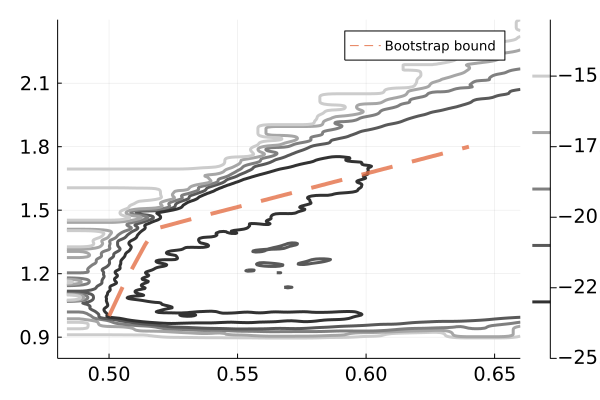

In [82]:

xs = readdlm( "T0.8-grid_x.dat")
ys = readdlm( "T0.8-grid_y.dat");
data = readdlm("T0.8-data.dat");
data2 = imfilter(data, Kernel.gaussian(2));

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, 
clim=(-25,-13),
levels=5,
ylim=(0.8,2.4),
xlim=(0.48,0.66),
line=(3)
)
contourAndExtremalPlot = plot!(extremalLine3d[:,1],extremalLine3d[:,2],label="Bootstrap bound",
line=( :dash, 4,0.8))

##### all $\ell_{max}$ analysis

In [ ]:
stDim=3

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("$(stDim)d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        @show length(cleanMinima)
        filter!(x -> length(x[1]) <= 6, cleanMinima)
        @show length(cleanMinima)

        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)
        @show length(cleanMinima)
        #sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:
bb=plot()
cutoffDict=Dict(6=>-31, 5=>-27, 4=>-20, 3=>-15)
for (icolor,lLimit) in enumerate([6,5,4,3])
    actionCutoff=cutoffDict[lLimit]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [getAction(sec,dd) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$lLimit" ,
        color = icolor
)
end

In [ ]:
bb=plot()
cutoffDict=Dict(6=>-31, 5=>-27, 4=>-20, 3=>-15)
for (icolor,lLimit) in enumerate([6,5,
    #4,
    3])
    actionCutoff=cutoffDict[lLimit]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit #&& getAction(sec,dd)<actionCutoff 
    && dsig == 0.565];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[2] for (sec,dd) in minimaList],
        [getC(sec,dd,3) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$lLimit" ,
        color = icolor
)
end

In [ ]:
bb

In [ ]:

bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.5,0.6],label="GFT",line=( 5,0.8), color=3)
cutoffDict=Dict(6=>-31, 5=>-27, 4=>-20, 3=>-15)
for (icolor,lLimit) in enumerate([6,5,4,3])
    actionCutoff=cutoffDict[lLimit]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$(2lLimit-2)" ,
        color = icolor
)
end

In [ ]:
#title!(L"d = 3, minima distribution, fixed $\Delta_T$")
xaxis!(bb, L"\Delta_\sigma")
yaxis!(bb, L"\Delta_\epsilon")
xlims!(bb,0.495,0.534)
ylims!(bb, (0.9,1.6))
plot!(bb,legend=:topleft,colorbar_title=L"S")


In [ ]:
savefig(bb,"../d$(stDim)-multiLmaxPlot.pdf")

##### Branch Analysis

In [ ]:
stDim=3

In [ ]:
dsigList=[]
for dir in directoriesToAnalyze
    occursin("3d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        push!(dsigList,dsig)
    catch e
        @show e
    end

end

In [ ]:
dsigList|>unique|>sort

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("3d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)


        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if length(branch) >= 2]
        
    catch e
        @show dir, e
    end

end

###### $\Delta_T$ $\Delta_\sigma$ plane

In [ ]:
actionCutoff=-34
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if !DTfixed && length(sec)<=6 && getAction(sec,dd)<actionCutoff ];
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 4
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = nothing ,color= 1
    #color= 1 .+ 2 .* [Int(1.1>getOpDelta(sec,dd,2,0)) for (sec,dd) in minimaList]
)

#plot!(x->2x + 2,[0.5,0.56],label="GFT",line=( 5,0.8),color=3)
bb=plot!(x->2x +2,[0.5,0.56],label=nothing,line=( 5,0.8),color=3)


        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_T")
        xlims!(bb, (0.499,0.565))
        ylims!(bb, (2.99,3.2))
        plot!(bb,title = L"d=3", size=3 .* (400,100),legend = :topleft, margins = 10Plots.PlotMeasures.mm)



savefig(bb,"../d3-DTFree-overview.pdf")

In [ ]:
#get the data
specsToPlotGFT = Dict()
for dir in dirs3dGFT
    occursin("3d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)


        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGFT[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if length(branch) > 2]
        #specsToPlotGFT[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:

actionCutoff = -28
excludedDsigs = [0.515,0.521,0.527,0.615]
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)>=5 && all(dsig .!=excludedDsigs ) && getAction(sec,dd)<actionCutoff];
unique!(minimaList);
filter(x->x[2][2]<1,minimaList)

###### $(\Delta_\sigma,  \Delta_\epsilon)$ plane

In [ ]:
actionCutoff = -28
excludedDsigs = [0.515,0.521,0.527,0.615]
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)>=5 && all(dsig .!=excludedDsigs ) && getAction(sec,dd)<actionCutoff];
unique!(minimaList)
minimaListGFT = []
minimaListGFT = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGFT for (sec,dd) in minima if DTfixed && length(sec)>=5 && all(dsig .!=excludedDsigs ) && getAction(sec,dd)<actionCutoff];
unique!(minimaListGFT)
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for  (sec,dd) in [minimaList...,minimaListGFT...] ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 5
maxSize = 9
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
scatter(actionsVec)

In [ ]:
bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.5,0.66],label="GFT",line=( 5,0.8))
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = nothing,
    #label = L"\Delta_T = 3 " ,
    #color=1,
    color= 1 .+ 2 .* [Int(1.1>getOpDelta(sec,dd,0,0)) for (sec,dd) in minimaList],
        colorbar_title=L"S"
)

scatter!(bb,
    [0.51815],
    [1.4126],
    label = "Ising",
    #label = L"\Delta_T = 3 " ,
    #color=1,
    color= 4)
scatter!(bb,
    [0.5],
    [1],
    label = "FT",
    #label = L"\Delta_T = 3 " ,
    #color=1,
    color= 5)




        #title!(L"d = 3, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")
        xlims!(bb, (0.495,0.57))
        ylims!(bb, (0.9,1.75))


plot!(bb,legend=:topleft)

In [ ]:
#Including fixed GFT points
bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.5,0.66],label="GFT",line=( 5,0.8))
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = L"\Delta_T = 3 " ,
    color=1,
    #color= 1 .+ 2 .* [Int(1.1>getOpDelta(sec,dd,0,0)) for (sec,dd) in minimaList],
        colorbar_title=L"S"
)

if !isempty(minimaListGFT)
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaListGFT],
        [dd[2] for (sec,dd) in minimaListGFT],
    ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaListGFT], 
                α=0.4,
                #marker=(:square),
        label = L"\Delta_T = 2\Delta_\sigma  + 2 " ,color=2,
        #label = L"\Delta_T = 2\Delta_\sigma  + 2 " ,color=2,
    )
end

scatter!(bb,
    [0.51815],
    [1.4126],
    label = "Ising",
    #label = L"\Delta_T = 3 " ,
    #color=1,
    color= 4)
scatter!(bb,
    [0.5],
    [1],
    label = "FT",
    #label = L"\Delta_T = 3 " ,
    #color=1,
    color= 5)



        #title!(L"d = 3, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")
        xlims!(bb, (0.495,0.57))
        ylims!(bb, (0.9,1.85))


plot!(bb,legend=:topleft)


savefig(bb,"../$(stDim)d-generalSpectrum-overview-DTfixed-comparison.pdf")

In [ ]:
dsigs = sort(unique([dsig[3] for dsig in keys(specsToPlotGlobal) if dsig[3]<0.57]))
out =""
for dsig in dsigs
    out *= "$dsig , \\,"
end

In [ ]:
clipboard(out)


#papero
Figure: we consider here the endpoints of chains with $\ell_{max} = 8,10$ and at least 3 minima. The radius of the circles is proportional to the action at the minima.

Here we see a qualitative difference between the landscape in $d=2$, where the minima that do not fall on the extremal line create a faint locus with $\Delta_\epsilon < 1$, instead of following the GFT line (at low $\ell_{max}$ we do get minima along the GFT line, but they do not create consistent branches.)

In [ ]:
containerVector([sec for (sec,dd) in minimaList])

In [ ]:
savefig(bb,"../d$(stDim)-DTd-overview.pdf")

###### $\Delta_T = 2\Delta_\sigma + 2$

###### zoom in around FT

In [ ]:
actionCutoff = -28
#excludedDsigs = [0.515,0.521,0.527,0.615]
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)>=5 && dsig <=0.522 && getAction(sec,dd)<actionCutoff];
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 3
maxSize = 9
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
scatter(actionsVec)

In [ ]:
bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[0.5,0.66],label="GFT",line=( 5,0.8))
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.2,
    label = nothing ,color=1
)


        #title!(L"d = 3, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")
xlims!(0.49,0.523)
        ylims!(bb, (0.9,1.5))
        plot!(bb, legend=:topleft)



In [ ]:
savefig(bb,"../d$(stDim)-overviewzoomFT.pdf")

##### exploring branches

We first define the plots in which we will display all the info.

In [ ]:
dsigdepsPlot=plot(extremalLine3d[:,1],extremalLine3d[:,2],label="Bootstrap bound",
line=( :dash, 4,0.8), color=2)

plot!(dsigdepsPlot,x->2x,[0.5,0.65],label="GFT",
line=( 5,0.8),color=3,
xaxis=L"\Delta_\sigma",
yaxis=L"\Delta_\epsilon",
)

actVSdstarPlot = plot(
    xaxis = L"\Delta^{*}",
    yaxis = L"S",
)


In [ ]:

branchesToPlotDict = Dict()

###### $\Delta_\sigma = 0.518...$(Ising)

In [128]:
path = filter(x-> occursin("3d",x) && occursin("0.5181489-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

length(cleanMinima) = 37


37

In [129]:
all([getOpDelta(sec,dd,2,0) for (sec,dd) in cleanMinima] .== 3)

true

In [130]:
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


length(allBranches) = 36


actionToSize (generic function with 1 method)

In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [131]:
isingBranches = filter(x->x[end][2][2]>1.3, chains)
length.(isingBranches)

10-element Vector{Int64}:
 2
 3
 4
 2
 4
 3
 2
 4
 2
 2

In [ ]:
plot()
for chain in isingBranches[[6,9,8]]
    plot!([maximum(dd[2:sum(sec)+2]) for (sec,dd) in chain],
    [getAction(sec,dd) for (sec,dd) in chain],
    marker=(0.9)
    )
end
plot!()

In [ ]:

branchesToPlotDict["Ising-like"] = isingBranches[6]

In [132]:

pp = plotSpectrum([ref3dIsingFull],[x[end] for x in isingBranches[[6,8]]],"Ising")
plot!(pp, title = L"\Delta_\sigma = 0.5181489" ,legend=:bottomright)
savefig(pp,"../3dIsingMinima.pdf")

spinOffsetStep = 1.2


###### $\Delta_\sigma = 0.53$

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.53-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];

In [ ]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [ ]:
branchesGFT = filter(x->x[end][2][2]<1, chains)


In [ ]:

branchesToPlotDict["below GFT"] = filter(x->x[end][2][2]<1, chains)[1]


In [ ]:
dsig = endPoints[1][2][1]

GFTdataMatrix = []
#GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
#pp = plotSpectrum([GFTdataMatrix],[branch[end] for branch in branchesGFT],nothing)
minimaToPlot = [branch[end] for branch in branchesGFT]
pp = plot(title = L"\Delta_\sigma = 0.53" )
    spinOffsetStep = 1.6/(length(minimaToPlot)+2)
    @show spinOffsetStep
scatter!(pp,[], label=nothing,color=:purple)
    refSecVec = containerVector([sec for (sec,xxx) in minimaToPlot])

#need to implement case for more than one reference... can leave out for now



    for (ii,(sec,dd)) in enumerate(minimaToPlot)
        plot!(pp,
            spinVec(sec .+ 1) .+ spinOffsetStep*(ii-1), 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond
        ),
        line=(3,0.5),
            label = nothing,
            #color = ii+4
        )
    end

    xaxis!(pp, L"\ell")
    yaxis!(pp, L"\Delta")
    xticks!(pp, 0:2:(length(refSecVec)*2 - 2))
    plot!(pp, legend=:topleft)
savefig(pp,"../3dGFTMinima.pdf")

###### $\Delta_\sigma = 0.55$(excluded)

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.55-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
all([getOpDelta(sec,dd,2,0) for (sec,dd) in cleanMinima] .== 3)

In [ ]:
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [ ]:
isingBranches = filter(x->x[end][2][2]>1.3, chains)
length.(isingBranches)

In [ ]:
plot()
for chain in isingBranches[[1,2,3,5,6]]
    plot!([maximum(dd[2:sum(sec)+2]) for (sec,dd) in chain],
    [getAction(sec,dd) for (sec,dd) in chain],
    marker=(0.9)
    )
end
plot!()

In [ ]:

branchesToPlotDict["Excluded"] = isingBranches[2]

###### plotting everything together

In [ ]:
# making life easier
names = [  
  "Ising-like"
    "below GFT"
  "Excluded"]
colorList = [1,3,5]
#parameters for size representation
actionsVec =  [getAction(sec,dd) for (name,branch) in  branchesToPlotDict for  (sec,dd) in branch ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
ii = 1
for name in names
  branch = branchesToPlotDict[name]
  plot!(actVSdstarPlot,
      [getDstar(sec,dd) for (sec, dd) in branch],
      [getAction(sec,dd) for (sec, dd) in branch],
      line= (3,0.5),
      marker= ( 0.7), label=nothing,#name,
      color = colorList[ii],
  )

    plot!(dsigdepsPlot,
        [dd[1] for (sec, dd) in branch],
        [dd[2] for (sec, dd) in branch],
        line= (3,0.5),
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=( 0.7),
        #label=name,
        label=nothing,
        color = colorList[ii]

    )
    ii+=1
end

In [ ]:

plot!(dsigdepsPlot,   size = (3/2) .*(300,300))
plot!(actVSdstarPlot, size = (3/2) .*(500,300), margins = 4Plots.PlotMeasures.mm)

In [ ]:

scatter!(dsigdepsPlot,[0.5182],[1.412],label="Ising",marker=(:x,15),color=2,legend=:topleft)
plot!(dsigdepsPlot,  xlims = (0.5,0.56),  ylims = (0.9,1.65), legend=:topleft)

In [ ]:
title!(dsigdepsPlot,  "(a)")
title!(actVSdstarPlot,"(b)")

In [ ]:
savefig(actVSdstarPlot,"../d$(stDim)-actVSdstarPlot.pdf")
savefig(dsigdepsPlot,"../d$(stDim)-dsigdepsPlot.pdf")

##### c bounds

###### $\lambda_0$ dependence and the bounds on $c$

We take one minimum in $d=3$ with $\Delta_\sigma = 0.565$ and calculate the action and OPE coefficients for that same point but at different $\lambda_0$. (The reference value is $0.42$.)

In [ ]:
minimaTemp = sort(filter(x->x[2][1]==0.565,minimaList), by = x->getAction(x...))
clipboard(minimaTemp[3][2][1:14])
sector = minimaTemp[3][1]
refCs = [getC(sec, dd, 3) for (sec,dd) in minimaTemp]

In [ ]:
cd("/home/puercoerrante/fortranTests/3d/2022e30-cVslambda0")
dataCvsLambda = [readdlm("input$l.dat") for l in 38:50]
CvsLambda = [getC(sector, x, 3) for x in dataCvsLambda]

In [ ]:

dataCvsLambdaMin = [readdlm("inputMC$l.dat") for l in 38:4:50]
CvsLambdaMin = [getC(sector, x[end,:], 3) for x in dataCvsLambdaMin]

In [ ]:
scatter(collect(38:50) ./ 100, CvsLambda,)
scatter!(collect(38:4:50) ./ 100, CvsLambdaMin, label = "After min")
scatter!(0.42 .* ones(length(refCs)),refCs,
xaxis=L"\lambda_0",
yaxis=L"c",
)
savefig("../cVslambda0.pdf")

In [ ]:

plot(extremalLine3dc[:,1],extremalLine3dc[:,2],label="Lower Bound",line=(:dash, 5,0.8),
color=2)

scatter!(
    [dd[1] for (sec,dd) in minimaList],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.3,
    #label = L"\Delta_\epsilon<1" ,color=1,
    label=nothing,

    color= 1 .+ 2 .* [Int(1.1>getOpDelta(sec,dd,0,0)) for (sec,dd) in minimaList],
)

scatter!(
    [1/2],
    [1],
    label="FT",
    color=5
)
scatter!(
    [0.5182],
    [0.95],
    label="Ising (2012)",

    color=4
)

        yaxis!( L"c")
        xaxis!( L"\Delta_\sigma")


In [ ]:
xlims!(0.495,0.569)
ylims!(0.93,1.08)
#title!("(b)")

In [ ]:
savefig("../d$(stDim)-cvsdsig-comparison.pdf")

In [ ]:

plot(extremalLine3dc[:,1],extremalLine3dc[:,2],label="lower bound (2012)",line=(:dash, 5,0.8),
color=2)
minimaList1 = filter(x->x[2][2]<1, minimaList)
minimaList2 = filter(x->x[2][2]>=1, minimaList)

scatter!(
    [dd[1] for (sec,dd) in minimaList1],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList1],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList1], 
            α=0.3,
    label = L"\Delta_\epsilon<1" ,color=1,

)

scatter!(
    [dd[1] for (sec,dd) in minimaList2],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList2],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList2], 
            α=0.3,
            marker=(:square),
    label = L"\Delta_\epsilon>1" ,color=1,

)
scatter!(
    [1/2],
    [1],
    label="FT",
    color=3
)
scatter!(
    [0.5182],
    [0.95],
    label="Ising (2014)",

    color=4
)

        yaxis!( L"c")
        xaxis!( L"\Delta_\sigma")


In [ ]:
savefig("../d$(stDim)-cvsdsig-comparison.pdf")

In [ ]:
minimaListIsing = filter(x->x[2][1]<0.52, minimaList2)
scatter!( mmPlotCvsDeps ,
    [dd[2] for (sec,dd) in minimaListIsing],
    [getC(sec,dd,stDim) for (sec,dd) in minimaListIsing],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaListIsing], 
            α=0.3,
    color=1,
    label = nothing

)

In [ ]:

scatter!(mmPlotCvsDeps,
    [1],
    [1],
    label=L"FT ($d=3$) ",
    color=3
)
scatter!(mmPlotCvsDeps,
    [1.412],
    [0.95],
    label="Ising (2014)",

    color=4
)

#### proof of instability in $\Delta_\sigma$

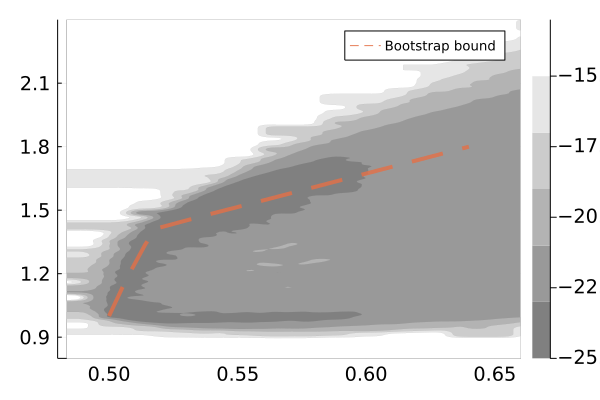

In [6]:
path = "/home/puercoerrante/fortranTests/3d/2022c22-ergodicLandscape"
cd(path)
xs = readdlm( "T0.8-grid_x.dat")
ys = readdlm( "T0.8-grid_y.dat");
data = readdlm("T0.8-data.dat");
data2 = imfilter(data, Kernel.gaussian(2));

contour(vec(xs),vec(ys),data2', 
fill=true, line_smoothing=0.5,
c = [RGBA(x,x,x,0.1) for x in 0.5:0.1:1], 
clim=(-25,-13),
levels=5,
ylim=(0.8,2.4),
xlim=(0.48,0.66),
line=(0)
)
contourAndExtremalPlot = plot!(extremalLine3d[:,1],extremalLine3d[:,2],label="Bootstrap bound",
line=( :dash, 4,0.8))

In [7]:
stDim=3

3

In [8]:
path = "/home/puercoerrante/fortranTests/3d/2022c23-gridInitialPoints-d3"
cd(path)

In [9]:

   spins=readdlm("n1")[15:end,1] |> Vector{Int}

nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

9-element BitVector:
 0
 1
 0
 0
 0
 1
 1
 0
 0

In [10]:
inits = Matrix{Float64}[ ]
		dsig0 = (stDim-2)/2 + 0.005
		dsig1 = (stDim-2)/2 + 0.2
		deps0 = (stDim-2) - 0.1
		deps1 = (stDim-2) + 0.9
		for dsig in dsig0:0.01:dsig1, deps in deps0:0.1:deps1
            push!(inits, [dsig deps -10])
        end

In [11]:
trajectoriesMC = Matrix{Float64}[ ]
endPointsMC = Vector{Float64}[ ]

nMins = 220
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l n$i.dat`,String))
                dd =readdlm("n$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtraj = Float64.(dd[1:end,:])
                cleanTraj = [ddtraj[:,1] leadingScalar ddtraj[:,10]]
                push!(endPointsMC, cleanTraj[end,:] )
                dd =readdlm("nInit$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtrajInit = Float64.(dd[1:end,:])
                
                push!(trajectoriesMC,[
                    inits[i]
                    [ddtrajInit[:,1] leadingScalar ddtrajInit[:,10]]
                    cleanTraj
                ])
            end
            catch e
                @show i
                @show e
            
        end
    end
endPointsMC = vcat([x' for x in endPointsMC]...)

220×3 Matrix{Float64}:
 0.499725  1.00364   -24.3555
 0.499598  1.00847   -24.3557
 0.499624  1.00566   -24.3558
 0.499694  1.01445   -24.3567
 0.500634  0.999599  -24.3494
 0.499745  1.00876   -24.3565
 0.499631  1.00471   -24.3556
 0.499727  1.00322   -24.3549
 0.499633  1.01509   -24.3561
 0.499637  1.01574   -24.3556
 ⋮                   
 0.499611  1.00608   -24.3559
 0.499633  1.01568   -24.3557
 0.500692  0.999987  -24.3496
 0.499693  1.0181    -24.3556
 0.499615  1.01192   -24.3563
 0.499534  1.01064   -24.3563
 0.49961   1.01512   -24.3561
 0.499611  1.0238    -24.356
 0.499703  1.01281   -24.3563

In [12]:
endPointsdif = Vector{Float64}[ ]

nMins = 220
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l n$i.dat`,String))
                dd =readdlm("n$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtraj = Float64.(dd[1:end,:])
                cleanTraj = [ddtraj[:,1] leadingScalar ddtraj[:,10]]
                dd =readdlm("nInit$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtrajInit = Float64.(dd[1:end,:])
                push!(endPointsdif, cleanTraj[1,:] - [ddtrajInit[end,1], leadingScalar[end], ddtrajInit[end,10]] )
            end
        catch e
            @show i
            @show e
            
        end
    end

In [13]:
findall(x->abs(x)>0.05,[x[2] for x in endPointsdif])

7-element Vector{Int64}:
   4
  67
  78
 144
 155
 196
 212

In [14]:
bb=deepcopy(contourAndExtremalPlot);
scatter!(bb,
    [0.5],
    [1.0],
    label="FT",
marker=(  10,0.99 ),color=3,
legend=:topright
)
#scatter!(bb,
    #[x[1] for x in inits],
    #[x[2] for x in inits],
    #label = "Initial Conditions",
    #marker = (2,0.5)
#)
trajectoriesToShow=vcat([42,62,82,102],[10,21,12*11 + 4])
i=1
for dd in trajectoriesMC[trajectoriesToShow]
        plot!(bb,
            dd[:,1],
            dd[:,2],
            line = (
            3,0.9
            ),
            label = nothing,
            color=i+1
        )
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,L"\Delta_\sigma")
        yaxis!(bb,L"\Delta_\epsilon")
        xranges = (0.495,0.63)
        yranges = (0.88,1.83)
        scaleFactor = (yranges[2]-yranges[1])/(xranges[2]-xranges[1])

        xlims!(bb,xranges)
        ylims!(bb,yranges)
plot!(bb, 
    colorbar_title=L"S"
)
xx,yy = Float64[],Float64[]
for dd in trajectoriesMC[trajectoriesToShow]
    push!(xx,  dd[end,1])
    push!(yy,  dd[end,2])
end

scatter!(bb,
xx,yy,
marker=(7,0.6),
label="Endpoints", color=2)

xx,yy = Float64[],Float64[]
for dd in trajectoriesMC[trajectoriesToShow]
    push!(xx,  dd[1,1])
    push!(yy,  dd[1,2])
end

scatter!(bb,
xx,yy,
marker=(4,0.9),
label=nothing, color=:black)


arrowLength = 0.007
for dd in trajectoriesMC[trajectoriesToShow]
        p0 = [dd[1,1], dd[1,2]]
    for mcIndex in 2:length(dd[:,1])

        p1 = [dd[mcIndex,1], dd[mcIndex,2]]
        arrowVec = (p1 .- p0)
        #arrowNorm = sum(( arrowVec ) .^2 )
        arrowNorm = sum(( arrowVec .* [scaleFactor,1]) .^2 )
        @show arrowNorm
        arrowNorm < arrowLength && continue
        
        p2 = [dd[mcIndex+1,1], dd[mcIndex+1,2]]

        @show sum( ( arrowVec ./ sqrt(arrowNorm)) .^ 2)

        plot!(bb,
        [p1[1], (p2[1]+9p1[1])/10],
        [p1[2], (p2[2]+9p1[2])/10],
        arrow=arrow(10),color=:black,linewidth=2,label=nothing,#line=(0,0)
        )
        break
    end
end

arrowNorm = 0.008815972171987076
sum((arrowVec ./ sqrt(arrowNorm)) .^ 2) = 0.9984228303905631


arrowNorm = 3.427272956962697e-5
arrowNorm = 0.00014389337318265318
arrowNorm = 0.0003234961352583367
arrowNorm = 0.0007520101376172967
arrowNorm = 0.0013027178190840026
arrowNorm = 0.0018346591607759687
arrowNorm = 0.0024270494483708735
arrowNorm = 0.0031244472774499456
arrowNorm = 0.0037921146355416194
arrowNorm = 0.004689322867458792
arrowNorm = 0.005804641035193883
arrowNorm = 0.0067489744489575175
arrowNorm = 0.008480649650397713
sum((arrowVec ./ sqrt(arrowNorm)) .^ 2) = 0.06460972088211346
arrowNorm = 3.555096094422855e-5
arrowNorm = 0.00012400295019865913
arrowNorm = 0.00024051000017858752
arrowNorm = 0.00039521216360269507
arrowNorm = 0.0004972528384132697
arrowNorm = 0.0006718411841143279
arrowNorm = 0.0008495158873648478
arrowNorm = 0.0010651688906330092
arrowNorm = 0.00138453281334005
arrowNorm = 0.0016312892731180691
arrowNorm = 0.0018865297480538177
arrowNorm = 0.002128188653701221
arrowNorm = 0.002378704224709306
arrowNorm = 0.002665493666319294
arrowNorm = 0.003157045272

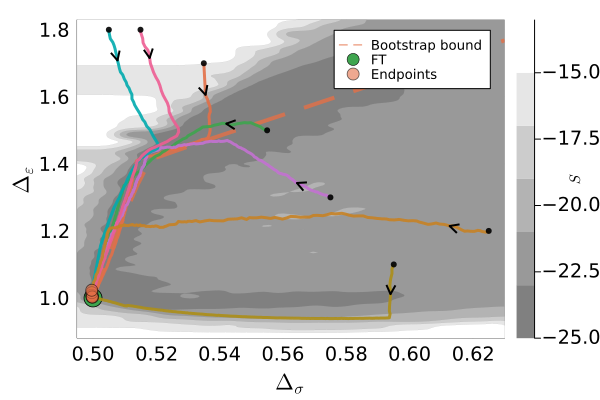

In [15]:
bb

In [79]:
savefig(bb,"../lowTMCevolution.pdf")

In [18]:
[(i,dd[1,1],dd[1,2]) for (i,dd) in enumerate(trajectoriesMC)][12*11 + 4]

(136, 0.625, 1.2)

##### Convergence for special one

In [24]:
# Let's extract the subleading scalar's OPE
                dd =readdlm("nInit102.dat")
                #current winner 62
            

1000×18 Matrix{Float64}:
 0.594427  1.08637   3.0  5.00043  6.99996  …  0.0  0.00839277  0.0
 0.594432  1.07269   3.0  5.0022   7.00074     0.0  0.0080667   0.0
 0.594019  1.05662   3.0  4.99948  7.00279     0.0  0.00761057  0.0
 0.593877  1.04811   3.0  5.00051  7.00075     0.0  0.00734948  0.0
 0.593755  1.03579   3.0  5.00056  7.00139     0.0  0.00694432  0.0
 0.593941  1.023     3.0  5.00204  6.99966  …  0.0  0.00638692  0.000320652
 0.593971  1.01254   3.0  5.00125  7.00203     0.0  0.00587107  0.000641365
 0.593913  1.00161   3.0  5.00135  7.00236     0.0  0.00527398  0.000995153
 0.593747  0.98543   3.0  5.00142  7.00274     0.0  0.00428373  0.00158467
 0.593644  0.972041  3.0  4.99841  7.00425     0.0  0.00336215  0.00215469
 ⋮                                          ⋱  ⋮                
 0.499722  1.00291   3.0  4.99991  7.00923     0.0  1.31664e-6  0.0
 0.499747  1.00273   3.0  4.99991  7.00923     0.0  1.90876e-6  0.0
 0.499747  1.00273   3.0  4.99991  7.00923     0.0  1.90

In [25]:
# Δ convergence
bb=
hline([1/2],label=L"\Delta_\sigma",line=(:dash,3),color=1)
hline!(bb, [1],label=L"\Delta_\epsilon",line=(:dash,3),color=2)
hline!(bb, [5],label=L"\Delta_4",line=(:dash,3),color=3)

        timeList = 1:100:100000

        i=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,1],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,2],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,4],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1

        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\Delta")
        plot!(bb,legend=:topright)
        xlims!(bb,0,23_999)
        #ylims!(bb,0.88,2.2)
        savefig(bb,"../DeltavsT.pdf")

In [26]:
# Δ convergence in error
bb=plot()
exactDeltas = [1/2, 1, 5]
        timeList = 1:100:100000

        i=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,1] .- exactDeltas[i],
            line = (
            3,0.75
            ),
            label = L"\Delta_\sigma",
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,2] .- exactDeltas[i],
            line = (
            3,0.75
            ),
            label = L"\Delta_\epsilon",
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,4] .- exactDeltas[i],
            line = (
            3,0.75
            ),
            label = L"\Delta_4",
            color=i
        )
    i+=1

        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\Delta -  \Delta_{FT}")
        plot!(bb,legend=:topright)
        xlims!(bb,0,24_999)
        #ylims!(bb,0.88,2.2)
        savefig(bb,"../DeltaErrorvsT.pdf")

In [27]:
# Δ convergence
bb=
hline([2],label=L"\lambda^2_{\sigma\sigma\epsilon}",line=(:dash,3),color=1)
hline!(bb, [0.09375],label=L"\lambda^2_{\sigma\sigma T}",line=(:dash,3),color=2)
hline!(bb, [0],label=L"\lambda^2_{\sigma\sigma\epsilon'}",line=(:dash,3),color=3)

        timeList = 1:100:100000

        i=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,11],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,12],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,15],
            line = (
            3,0.75
            ),
            label = nothing,
            color=i
        )
    i+=1

        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\lambda^2")
        plot!(bb,legend=:topleft)
        xlims!(bb,0,35_999)
        #ylims!(bb,0.88,2.2)
        savefig(bb,"../OPEvsT.pdf")

In [28]:
# Δ convergence in error
bb=plot()
exactOPEs = [2, 0.09375, 0]
        timeList = 1:100:100000

        i=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,11] .- exactOPEs[i],
            line = (
            3,0.75
            ),
label=L"\lambda^2_{\sigma\sigma\epsilon}",
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,12] .- exactOPEs[i],
            line = (
            3,0.75
            ),
label=L"\lambda^2_{\sigma\sigma T}",      
            color=i
        )
    i+=1
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,15] .- exactOPEs[i],
            line = (
            3,0.75
            ),
label=L"\lambda^2_{\sigma\sigma\epsilon'}",
            color=i
        )
    i+=1

        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\OPE_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\lambda^2 -  \lambda^2_{FT}")
        plot!(bb,legend=:bottomright)
        xlims!(bb,0,35_999)
        #ylims!(bb,0.88,2.2)
        savefig(bb,"../OPEErrorvsT.pdf")

##### Convergence for all

In [ ]:
# Let's extract the subleading scalar's OPE
subLeadingScalarOPE = Matrix{Float64}[ ]

nMins = 220
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l n$i.dat`,String))
                dd =readdlm("nInit$i.dat")
                push!(subLeadingScalarOPE,dd[:,[15,16]])
            end
            catch e
                @show i
                @show e
            
        end
    end

In [ ]:
# dsig convergence
bb=
hline([1/2],label="FT",line=(:dash,4),color=3)

        timeList = vcat(1:100:100000, 100_001:100_000:2*10^8)
i=1
for dd in trajectoriesMC[trajectoriesToShow]
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,1],
            line = (
            2,0.6
            ),
            label = nothing,
            color=i
        )
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\Delta_\sigma")
        plot!(bb,legend=:topright)
        xlims!(bb,0,99_999)
        #ylims!(bb,0.88,2.2)

In [ ]:
savefig(bb,"../lowTMCevolutiondsig.pdf")

In [ ]:
# dsig convergence
bb=
hline([1],label="FT",line=(:dash,4),color=3)

        timeList = vcat(1:100:100000, 100_001:100_000:2*10^8)
i=1
for dd in trajectoriesMC[trajectoriesToShow]
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,2],
            line = (
            2,0.6
            ),
            label = nothing,
            color=i
        )
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\Delta_\epsilon")
        plot!(bb,legend=:topright)
        xlims!(bb,1,99_999)
        #ylims!(bb,0.88,2.2)

In [ ]:
savefig(bb,"../lowTMCevolutiondeps.pdf")

In [ ]:
# dsig convergence
bb=
hline([0],label="FT",line=(:dash,4),color=3)

        timeList = vcat(1:100:100000, 100_001:100_000:2*10^8)
i=1
for dd in subLeadingScalarOPE[trajectoriesToShow]
        plot!(bb,
            timeList[1:length(dd[:,1])],
            dd[:,1],
            line = (
            2,0.6
            ),
            label = nothing,
            color=i
        )
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,"MC Time")
        yaxis!(bb,L"\lambda^2_{\sigma\sigma\epsilon'}")
        plot!(bb,legend=:topright)
        xlims!(bb,1,49_999)
        ylims!(bb,0,0.9)

In [ ]:
savefig(bb,"../lowTMCevolutionlambdaepsprime.pdf")

##### checking the effect of fixing $\Delta_4 = 5$ away from FT

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.53-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_4 $ free "
    )

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.53-",x) && occursin("dtFixedtrue",x) , dirsInconsistent )[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
filter!(x->length(x[1]) == 6, cleanMinima);

In [ ]:
scatter!(
        [dd[2] for (sec,dd) in cleanMinima],
        [dd[(sum(sec) + 2)] for (sec,dd) in cleanMinima],
        label = L"$\Delta_4 = 5$ fixed "
    )

In [ ]:
vline!([1/4], label = L"2\Delta_\sigma")

In [ ]:
xlabel!(L"\Delta_\epsilon")
ylabel!("action")
title!(L"$\Delta_\sigma = 1/8$: comparison between free and fixed $\Delta_T$")

In [ ]:
savefig("gft2ddsig125Comparison.pdf")

In [ ]:
pwd()

Fixing $\Delta_4$ has a very striking effect on the action and the number of minima.

#### GFT stability test

In [ ]:
dataCollection = Dict(dsig => [readdlm("/home/puercoerrante/fortranTests/3d/2022e06-GFTsearch-d3/n$i-dsig$dsig.dat") for i in 1:34] for dsig in [0.51  0.53  0.54])

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,2] for dd in data if length(dd)<2000],marker = (10,0.4),label=nothing)
end
plot!(x->2x,[1/2,0.54],label="GFT",xaxis = L"\Delta_\sigma",yaxis = L"\Delta_\epsilon",)

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,3] for dd in data if length(dd)<2000],marker = (10,0.4))
end
plot!(x->2x+2,[1/2,0.54])

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([size(dd)[2]/2 for dd in data if length(dd)<2000],[dd[end,3] for dd in data if length(dd)<2000],marker = (10,0.4))
end
#plot!(x->2x+2,[1/2,0.54])

In [ ]:
plot!()

###### $\Delta_\sigma = 0.51$ branch

In [ ]:
dsig = 0.51
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/3d/2022e06-GFTsearch-d3")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)
gftBestChain = gftChains[argmax(gftChainlengths)]

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.51-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)

In [ ]:

bestMCChain = chains[ sortperm(length.(chains))[end-2] ]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 0.51")
    savefig(actVSdstarPlot, "../gftvsMC-dsig51.pdf")

###### $\Delta_\sigma = 0.54$ branch

In [ ]:
dsig = 0.54
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/3d/2022e06-GFTsearch-d3")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)

In [ ]:

gftBestChain = gftChains[sortperm(gftChainlengths)[end-4]]

In [ ]:
path = filter(x-> occursin("3d",x) && occursin("0.54-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)

In [ ]:

bestMCChain = chains[ sortperm(length.(chains))[end] ]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 0.54")
    savefig(actVSdstarPlot, "../gftvsMC-dsig54.pdf")

### $d=4$

In [ ]:
stDim=4

##### ergodic landscape

In [ ]:
path = "/home/puercoerrante/fortranTests/4d/2022d02-ergodicLandscape"
cd(path)

generate grid data
```
#fname = "input0.8-multicritical"
fname = "input0.7"
testData = readdlm("$fname.dat")[:,[1,2,10]];
#testData = readdlm("$fname.dat");
   spins=readdlm("$fname")[15:end,1] |> Vector{Int}
nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

xvec = minimum(testData[:,1]):0.1:maximum(testData[:,1])
yvec = minimum(testData[:,2]):0.2: maximum(testData[:,2])
#xvec = 0.5:0.05:0.7
#yvec = 0.8:0.1:2.5

 xs,ys,data = smartBin(testData,xvec,yvec, 100,500)
testData = nothing
substituteNaN!(data);
writedlm( "T0.7-grid_x.dat", collect(xs))
writedlm( "T0.7-grid_y.dat", collect(ys))
pwd()

writedlm("T0.7-data.dat", data)
```

In [ ]:

xs = readdlm( "T0.7-grid_x.dat")
ys = readdlm( "T0.7-grid_y.dat")
data = readdlm("T0.7-data.dat");
data2 = imfilter(data, Kernel.gaussian(2));

contour(vec(xs),vec(ys),data2', fill=false, line_smoothing=0.5, c = :grays, 
clim=(-19,-10),ylim=(1.4,4),
levels = 5,
line=(3),
colorbar_title = L"S",
)
plot!(extremalLine4d[:,1],extremalLine4d[:,2],
#label="Bootstrap bounds ('08)",
label="Bootstrap bounds",
line=(:dash, 5,0.8))
contourPlotRef = plot!(extremalLine4dSOTA[:,1],extremalLine4dSOTA[:,2],
label="Bootstrap bounds",
line=(:dash, 5,0.8),
color = 4)
contourAndExtremalPlot = contourPlotRef

##### proof of instability in $\Delta_\sigma$

In [ ]:
path = "/home/puercoerrante/fortranTests/4d/2022c23-gridInitialPoints-d4"
cd(path)

In [ ]:

   spins=readdlm("n1")[15:end,1] |> Vector{Int}

nOps = length(spins)
scalars = 0 .== spins
#leadingScalar = [minimum(testData[i,1:nOps][scalars]) for i in 1:length(testData[:,1])]

In [ ]:
inits = Matrix{Float64}[ ]
		dsig0 = (stDim-2)/2 + 0.005
		dsig1 = (stDim-2)/2 + 0.2
		deps0 = (stDim-2) - 0.1
		deps1 = (stDim-2) + 0.9
		for dsig in dsig0:0.01:dsig1, deps in deps0:0.1:deps1
            push!(inits, [dsig deps -10])
        end

In [ ]:
trajectoriesMC = Matrix{Float64}[ ]
endPointsMC = Vector{Float64}[ ]

nMins = 220
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l n$i.dat`,String))
                dd =readdlm("n$i.dat")
                leadingScalar = [
                    minimum(dd[i,1:nOps][scalars]) 
                    for i in 1:length(dd[:,1])
                        ]
                        #@show size(leadingScalar)
                ddtraj = Float64.(dd[1:end,:])
                cleanTraj = [ddtraj[:,1] leadingScalar ddtraj[:,10]]
                push!(endPointsMC, cleanTraj[end,:] )
                
                push!(trajectoriesMC,[
                    inits[i]
                    #[ddtrajInit[:,1] leadingScalar ddtrajInit[:,10]]
                    cleanTraj
                ])
            end
            catch e
                @show i
                @show e
            
        end
    end
endPointsMC = vcat([x' for x in endPointsMC]...)

In [ ]:
trajectoriesMC[200]

In [ ]:
bb=deepcopy(contourAndExtremalPlot);
i=1
for dd in trajectoriesMC[2:5:end]
    if i!=2
        plot!(bb,
            dd[:,1],
            dd[:,2],
            line = (
            5,0.6
            ),
            label = nothing,
            color=i
        )
    end
    i+=1
end
        #title!(bb,L"d = 3, low$-T$ trajectories, fixed $\Delta_T$")
        xaxis!(bb,L"\Delta_\sigma")
        yaxis!(bb,L"\Delta_\epsilon")
        plot!(bb,legend=:topleft)
        xlims!(bb,1,1.2)
        ylims!(bb,1.4,3)

In [ ]:
plot!(bb, 
    colorbar_title=L"S"
)

In [ ]:
savefig(bb,"../lowTMCevolutiond4.pdf")

In [ ]:
findall(x->x[end,1]>1.01 , trajectoriesMC)

##### all $\ell_{max}$ analysis

In [ ]:
stDim=4

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("$(stDim)d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        @show length(cleanMinima)
        filter!(x -> length(x[1]) <= 6, cleanMinima)
        @show length(cleanMinima)

        DTfixed && filter!(x -> getOpDelta(x...,2,0) == stDim, cleanMinima)
        @show length(cleanMinima)
        #sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:
bb=plot()
cutoffDict=Dict(6=>-21, 5=>-20, 4=>-15, 3=>-10)
for (icolor,lLimit) in enumerate([6,5,4,3])
 #   actionCutoff=cutoffDict[lLimit]
 actionCutoff=-2
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [getAction(sec,dd) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$lLimit" ,
        color = icolor
)
end
bb

In [ ]:

bb=deepcopy(contourAndExtremalPlot);

plot!(bb,x->2x,[1,1.3],label="GFT",line=( 5,0.8), color=3)
for (icolor,lLimit) in enumerate([6,5,4,3])
    actionCutoff=cutoffDict[lLimit]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        label = L"\ell_{max} ="*"$(2lLimit-2)" ,
        color = icolor
)
end

In [ ]:
#title!(L"d = 3, minima distribution, fixed $\Delta_T$")
xaxis!(bb, L"\Delta_\sigma")
yaxis!(bb, L"\Delta_\epsilon")
xlims!(bb,0.99,1.34)
ylims!(bb, (1.65,3.6))
plot!(bb,legend=:topleft,colorbar_title=L"S")


In [ ]:
savefig(bb,"../d$(stDim)-multiLmaxPlot.pdf")

##### Branch Analysis

In [ ]:
stDim=4

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in directoriesToAnalyze
    occursin("4d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)


        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if length(branch) >= 2]
        
    catch e
        @show dir, e
    end

end

In [ ]:
#get the data
specsToPlotGFT = Dict()
for dir in dirs4dGFT
    occursin("4d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)


        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGFT[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if length(branch) > 2]
        #specsToPlotGFT[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:
actionCutoff = -26

minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)>=5 && getAction(sec,dd)<actionCutoff];
unique!(minimaList)
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 3
maxSize = 9
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
scatter(actionsVec)

In [ ]:
containerVector([sec for (sec,dd) in minimaList])

###### getting 1.05 point

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.05",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)
push!(minimaList, filter(x->x[2][2]>2.02 && getAction(x...)<-actionCutoff &&length(x[1])==5,cleanMinima)[1])

###### getting 1.1 point

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.1-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)
push!(minimaList, filter(x->x[2][2]>2.02 && getAction(x...)<-actionCutoff &&length(x[1])==5,cleanMinima)[1])

In [ ]:
bb = deepcopy(contourPlotRef)
plot!(bb,x->2x,[1,1.3],label="GFT",line=( 5,0.8),color=3)
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = nothing ,
    color= 1 .+ 2 .* [Int(2.1>getOpDelta(sec,dd,0,0)) for (sec,dd) in minimaList],

    #margins=marginConstant
)

scatter!(bb,
    [1],
    [2],
    color = 5,
    label = "FT",
)

        #title!(L"d = 4, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")
xlims!(bb,(0.99,1.33))
ylims!(bb,(1.6,4.01))
plot!(bb, legend=:topleft)

In [ ]:

savefig(bb,"../$(stDim)d-generalSpectrum-overview-DTfixed.pdf")
savefig(bb,"../$(stDim)d-generalSpectrum-overview-DTfixed.svg")

In [ ]:
minimaListGFT = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGFT for (sec,dd) in minima if DTfixed && length(sec)>=5 && all(dsig .!=excludedDsigs ) && getAction(sec,dd)<actionCutoff];
unique!(minimaListGFT)
#parameters for size representation
actionsVec =  [dd[sum(sec) + 2] for  (sec,dd) in [minimaList...,minimaListGFT...] ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 3
maxSize = 9
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
bb = deepcopy(contourPlotRef)
plot!(bb,x->2x,[1,1.3],label="GFT",line=( 5,0.8),color=3)
scatter!(bb,
    [dd[1] for (sec,dd) in minimaList],
    [dd[2] for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = L"\Delta_T = 4" ,color=1,
)


        #title!(L"d = 4, minima distribution, fixed $\Delta_T$")
        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_\epsilon")

xlims!(bb,(0.99,1.33))
ylims!(bb,(1.6,4.01))
plot!(bb, legend=:topleft)

scatter!(bb,
    [dd[1] for (sec,dd) in minimaListGFT],
    [dd[2] for (sec,dd) in minimaListGFT],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaListGFT], 
            α=0.4,
            #marker=(:square),
    label = L"\Delta_T = 2\Delta_\sigma  + 2 " ,color=2,
    colorbar_title=L"S"
)




In [ ]:
savefig(bb,"../$(stDim)d-generalSpectrum-overview-DTfixed-comparison.pdf")

###### $\Delta_T$ $\Delta_\sigma$ plane

In [ ]:
actionCutoff=-25
minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if !DTfixed && length(sec)<=6 && getAction(sec,dd)<actionCutoff ];
#minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpDelta(sec,dd,2,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.4,
    label = nothing ,color=1
)

#plot!(x->2x + 2,[0.5,0.56],label="GFT",line=( 5,0.8),color=3)
bb=plot!(x->2x +2 ,[1,1.3],label=nothing,line=( 5,0.8),color=3)


        xaxis!(bb, L"\Delta_\sigma")
        yaxis!(bb, L"\Delta_T")
        #xlims!(bb, (0.499,0.565))
        #ylims!(bb, (0.95,1.62))
        plot!(bb,title = L"d=4", size=3 .* (400,100),legend = :topleft, margins = 10Plots.PlotMeasures.mm)


savefig(bb,"../d4-DTFree-overview.pdf")

##### exploring chains

We first define the plots in which we will display all the info.

In [ ]:
dsigdepsPlot = plot(extremalLine4d[:,1],extremalLine4d[:,2],label=L"$k=3$ bounds",line=(:dash, 5,0.8), color = 2)
plot!(dsigdepsPlot, extremalLine4dSOTA[:,1],extremalLine4dSOTA[:,2],label=L"$k=11$ bounds",line=(:dash, 5,0.8),
color = 4)

plot!(dsigdepsPlot,x->2x,[1,1.3],label="GFT",
line=( 5,0.8),color=3,
xaxis=L"\Delta_\sigma",
yaxis=L"\Delta_\epsilon",
)

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)


In [ ]:

branchesToPlotDict = Dict()

###### $\Delta_\sigma = 1.2$

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.2-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];

In [ ]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
extremalBranches = filter(x->length(x)>4,chains)[1:2]

In [ ]:
plot()
for chain in extremalBranches
    plot!([maximum(dd[2:sum(sec)+2]) for (sec,dd) in chain],
    [getAction(sec,dd) for (sec,dd) in chain],
    marker=(0.9)
    )
end
plot!()

In [ ]:

branchesToPlotDict["Extremal"] = extremalBranches[1]

In [ ]:
dsig = extremalBranches[1][2][1]

GFTdataMatrix = []
#GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
#pp = plotSpectrum([GFTdataMatrix],[branch[end] for branch in branchesGFT],nothing)
minimaToPlot = [branch[end] for branch in extremalBranches]
pp = plot(title = L"\Delta_\sigma = 1.2" )
    spinOffsetStep = 1.6/(length(minimaToPlot)+2)
    @show spinOffsetStep
scatter!(pp,[], label=nothing,color=:purple)
    refSecVec = containerVector([sec for (sec,xxx) in minimaToPlot])

#need to implement case for more than one reference... can leave out for now



    for (ii,(sec,dd)) in enumerate(minimaToPlot)
        plot!(pp,
            spinVec(sec .+ 1) .+ spinOffsetStep*(ii-1), 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond
        ),
        line=(3,0.5),
            label = nothing,
            #color = ii+4
        )
    end

    xaxis!(pp, L"\ell")
    yaxis!(pp, L"\Delta")
    xticks!(pp, 0:2:(length(refSecVec)*2 - 2))
    plot!(pp, legend=:topleft)
savefig(pp,"../4dExtremalMinima.pdf")

###### $\Delta_\sigma = 1.05$

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.05-",x) && occursin("dtFixedtrue",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
endPoints = [x[end] for x in chains];

In [ ]:

#parameters for size representation
actionsVec =  [getAction(sec,dd) for  (sec,dd) in cleanMinima ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end


In [ ]:
plot(
    xaxis=L"\Delta_\epsilon",
    yaxis=L"\Delta_{\epsilon'}",
)
for branch in filter(x->length(x)>2,chains)

    plot!(
        [dd[2] for (sec,dd) in branch],
        [dd[3] for (sec,dd) in branch],
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=(:diamond,0.2)
    )
end

In [ ]:
plot!(legend=:topleft)

In [ ]:
length.(chains)

In [ ]:

plot([[length(sec) for (sec,dd) in branch] for branch in filter(x->x[end][2][2]>2 && length(x)>3, chains) ] )

In [ ]:
filter(x->x[end][2][2]>2 && length(x)>3, chains)[4]

In [ ]:
nonextremalBranches = filter(x->length(x)>2 && x[1][2][2]<2,chains)

In [ ]:
plot()
for chain in nonextremalBranches[[2,5]]
    plot!([maximum(dd[2:sum(sec)+2]) for (sec,dd) in chain],
    [getAction(sec,dd) for (sec,dd) in chain],
    marker=(0.9)
    )
end
plot!()

In [ ]:

branchesToPlotDict["Non-Extremal"] = nonextremalBranches[2]

In [ ]:
dsig = extremalBranches[1][2][1]

GFTdataMatrix = []
#GFTdataMatrix = vcat([ dsig -2 1],[[ ll+2dsig+n ll 1] for ll in 0:2:14 for n in 0:2:10]...)
#pp = plotSpectrum([GFTdataMatrix],[branch[end] for branch in branchesGFT],nothing)
minimaToPlot = [branch[end] for branch in nonextremalBranches[[2,5]]]
pp = plot(title = L"\Delta_\sigma = 1.05" )
    spinOffsetStep = 1.6/(length(minimaToPlot)+2)
    @show spinOffsetStep
scatter!(pp,[], label=nothing,color=:purple)
    refSecVec = containerVector([sec for (sec,xxx) in minimaToPlot])

#need to implement case for more than one reference... can leave out for now



    for (ii,(sec,dd)) in enumerate(minimaToPlot)
        plot!(pp,
            spinVec(sec .+ 1) .+ spinOffsetStep*(ii-1), 
            extendDDsforPlot(sec,dd)[2:end], 
        marker=(
                    14,0.7,
                    :diamond
        ),
        line=(3,0.5),
            label = nothing,
            #color = ii+4
        )
    end

    xaxis!(pp, L"\ell")
    yaxis!(pp, L"\Delta")
    xticks!(pp, 0:2:(length(refSecVec)*2 - 2))
    plot!(pp, legend=:topleft)
savefig(pp,"../4dNonExtremalMinima.pdf")

###### plotting everything together

In [ ]:

for (name,branch) in branchesToPlotDict
    @show name
    @show [sum(sec) for (sec,dd) in branch]
end

In [ ]:
#parameters for size representation
actionsVec =  [getAction(sec,dd) for (name,branch) in  branchesToPlotDict for  (sec,dd) in branch ]
bestAction, worstAction = extrema(actionsVec)
actionScale = worstAction - bestAction
minSize = 2
maxSize = 15
function actionToSize(act::Float64)
    maxSize *(worstAction - act)/actionScale + minSize
end
ii = 1
for (name,branch) in branchesToPlotDict
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label=name,
        color = ii==1 ? 1 : 5,
    )

    plot!(dsigdepsPlot,
        [dd[1] for (sec, dd) in branch],
        [dd[2] for (sec, dd) in branch],
        line= (3,0.5),
        ms=[actionToSize(getAction(sec,dd)) for (sec,dd) in branch],
        marker=( 0.7),
        #label=name,
        label=nothing,
        color = ii==1 ? 1 : 5

    )
    ii+=1
end

In [ ]:

plot!(dsigdepsPlot,   size = (3/2) .*(300,300))
plot!(actVSdstarPlot, size = (3/2) .*(500,300), margins = 4Plots.PlotMeasures.mm)

In [ ]:

plot!(dsigdepsPlot,  xlims = (1,1.25),  ylims = (1.6,3.2),legend=:topleft)

In [ ]:
title!(dsigdepsPlot,  "(a)")
title!(actVSdstarPlot,"(b)")

In [ ]:
savefig(actVSdstarPlot,"../d$(stDim)-actVSdstarPlot.pdf")
savefig(dsigdepsPlot,"../d$(stDim)-dsigdepsPlot.pdf")

##### c bounds

In [ ]:

plot(extremalLine4dc[:,1],extremalLine4dc[:,2],label="lower bound (2012)",line=(:dash, 5,0.8),color=2)
minimaList1=minimaList
scatter!(
    [dd[1] for (sec,dd) in minimaList1],
    [getC(sec,dd,stDim) for (sec,dd) in minimaList1],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList1], 
            α=0.3,
            label=nothing,
    color= 1 .+ 2 .* [Int(2.1>getOpDelta(sec,dd,0,0)) for (sec,dd) in minimaList],


)
scatter!(
    [1],
    [1],
    label="FT",
    color=4
)

        yaxis!( L"c")
        xaxis!( L"\Delta_\sigma")
        plot!(legend=:topleft)


In [ ]:
savefig("../d$(stDim)-cvsdsig-comparison.pdf")

In [ ]:
scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpOPE(sec,dd,0,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.3,
    label = "ΔT fixed" ,color=1
)
scatter!(
    [1],
    [2],
    label="FT"
)

        yaxis!( L"p_{\sigma\sigma\epsilon}")
        xaxis!( L"\Delta_\sigma")


In [ ]:
savefig("../pssepsVsdsig-4d.pdf")

In [ ]:
scatter(
    [dd[1] for (sec,dd) in minimaList],
    [getOpOPE(sec,dd,2,0) for (sec,dd) in minimaList],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
            α=0.3,
    label = "ΔT fixed" ,color=1
)
scatter!(
    [1],
    [1/3],
    label="FT"
)

        yaxis!( L"p_{\sigma\sigma T}")
        xaxis!( L"\Delta_\sigma")


In [ ]:
savefig("../pssTVsdsig-4d.pdf")

In [ ]:
minimaListIsing = filter(x->x[2][1]<1.01, minimaList2)
scatter!( mmPlotCvsDeps ,
    [dd[2] for (sec,dd) in minimaListIsing],
    [getC(sec,dd,stDim) for (sec,dd) in minimaListIsing],
 ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaListIsing], 
            α=0.3,
    color=1,
    label = nothing

)

In [ ]:

scatter!(mmPlotCvsDeps,
    [2],
    [1],
    label=L"FT ($d=4$) ",
    color=5
)

In [ ]:
plot!(mmPlotCvsDeps,legend=:bottomright)

In [ ]:
savefig(mmPlotCvsDeps,"../allDimensionSummaryCvsDeps.pdf")

#### GFT stability test

In [ ]:
dataCollection = Dict(dsig => [readdlm("/home/puercoerrante/fortranTests/4d/2022e06-GFTsearch-d4/n$i-dsig$dsig.dat") for i in 1:34] for dsig in [1.1, 1.2, 1.3])

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,2] for dd in data if length(dd)<2000],marker = (10,0.4),label=nothing)
end
plot!(x->2x,[1.1, 1.3],label="GFT",xaxis = L"\Delta_\sigma",yaxis = L"\Delta_\epsilon",)

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([dsig for dd in data if length(dd)<2000],[dd[end,3] for dd in data if length(dd)<2000],marker = (10,0.4))
end
plot!(x->2x+2,[1.1, 1.3])

In [ ]:
plot()
for (dsig,data) in dataCollection 
    scatter!([size(dd)[2]/2 for dd in data if length(dd)<2000],[dd[end,3] for dd in data if length(dd)<2000],marker = (10,0.4))
end
#plot!(x->2x+2,[1/2,0.54])

In [ ]:
plot!()

###### $\Delta_\sigma = 1.1$ branch

In [ ]:
dsig = 1.1
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/4d/2022e06-GFTsearch-d4")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)
gftBestChain = gftChains[argmax(gftChainlengths)]

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.1-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)

In [ ]:

bestMCChain = chains[ sortperm(length.(chains))[end] ]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 1.1")
    savefig(actVSdstarPlot, "../gftvsMC-dsig11.pdf")

###### $\Delta_\sigma = 1.2$ branch

In [ ]:
dsig = 1.2
    lowTDataDump = []
    cd("/home/puercoerrante/fortranTests/4d/2022e06-GFTsearch-d4")
    nMins = 34
    @show nMins
    for i in 1:nMins
        #@show n, i
        try
            if !occursin(r"^0 ",read(`wc -l lowT$i-dsig$dsig.dat`,String))
                dd =readdlm("lowT$i-dsig$dsig.dat")
                if dd[end-1,1] == 1
                    ddInput = Float64.(dd[end,:])
                    inp = readdlm("lowT$i-dsig$dsig")
                    sps = Int64.(inp[18:end,1] )
                    push!(lowTDataDump,sectorSplitter(ddInput, sps, 10^-8))
                end
            end
            catch e
                @show i
                @show e
            
        end
    end
    cd("../")

In [ ]:
xx, gftChains = branchesFromCleanMinima(lowTDataDump, 0.2,2)
gftChainlengths = length.(gftChains)
gftBestChain = gftChains[sortperm(gftChainlengths)[end-1]]

In [ ]:
path = filter(x-> occursin("4d",x) && occursin("1.2-",x) && occursin("dtFixedfalse",x) , directoriesToAnalyze)[1]
cd(path)

In [ ]:

    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end

In [ ]:
wut = readdlm("cleanMinima.dat")
cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])];

@show length(cleanMinima)

In [ ]:
        filter!(x -> length(x[1]) <= 5, cleanMinima)

        sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)

In [ ]:
endPoints = [branch[end] for branch in chains]|>unique

In [ ]:

bestMCChain = chains[ sortperm(length.(chains))[end] ]

In [ ]:

actVSdstarPlot = plot(
    xaxis = L"\Delta^*",
    yaxis = L"S",
)
branch = gftBestChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="GFT",
        color = 1
    )

branch = bestMCChain
    plot!(actVSdstarPlot,
        [getDstar(sec,dd) for (sec, dd) in branch],
        [getAction(sec,dd) for (sec, dd) in branch],
        line= (3,0.5),
        marker= ( 0.7), label="MC protocol",
        color = 2
    )

In [ ]:

    plot!(actVSdstarPlot, title = L"\Delta_\sigma = 1.2")
    savefig(actVSdstarPlot, "../gftvsMC-dsig12.pdf")

## General spectra with more than one $Z_2$ even relevant scalar.

### $d=2$

In [ ]:
stDim=2

##### all $\ell_{max}$ analysis

In [ ]:
stDim=2

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in dirsMoreScalars
    occursin("2d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        #sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
        specsToPlotGlobal[(stDim,DTfixed,dsig)] = cleanMinima
        
    catch e
        @show dir, e
    end

end

In [ ]:

bb = plot(x->2x,[0.1,0.3],label="GFT",line=( 5,0.8), color=3)
actionCutoff=-2
for lLimit in [6,5,4,3]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [dd[1] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,marker=(:square),
        label = L"\ell_{max} ="*"$lLimit" 
)
end

In [ ]:
bb

In [ ]:

 plot!(bb,extremalLine2d[:,1],extremalLine2d[:,2],label="extremal",
line=(:dash, 5,0.8),color=2)

ylims!(bb,0.1,2.8),
xlims!(bb,0.08,0.31)
plot!(bb,legend=:bottomright)
scatter!(bb,
    minimalModels[:,1],
    minimalModels[:,2],
    label="MM",
    marker=(:x,15,),
    color=2,
    xaxis=L"\Delta_\sigma",
    yaxis=L"\Delta_\epsilon",
)

The improtant conclusion is that the density of minima between the two valleys changes only for $\ell_{max} = 10$; for smaller values the minima are roughly the same.

### $d=3$

In [2]:
stDim=3

3

##### Checking ergodicity 

In [ ]:
data = readdlm("/home/puercoerrante/fortranTests/3d/2022g01-dsig0.519-dtFixedtrue-ONexperiments/decimated-n42.dat");

In [ ]:
lowActionBoys = data[:,13] .< -29.5 .* data
scatter(data[lowActionBoys,2],data[lowActionBoys,8])
hline!(oNValues[:,2])
hline!(oNValues[:,3])
vline!(oNValues[:,2], color = 2)
vline!(oNValues[:,3], color = 3)

In [ ]:
plot()
for op in 2:12
    plot!(data[1:10:end,op], label = "$op")
end

In [ ]:
plot!()

##### Analyzing results 

In [3]:
oNValues = [
0.51905 1.51124 1.237 
0.51875 1.5939  1.211 
0.51825 1.6649  1.189 
0.5155  1.691   1.170
]

4×3 Matrix{Float64}:
 0.51905  1.51124  1.237
 0.51875  1.5939   1.211
 0.51825  1.6649   1.189
 0.5155   1.691    1.17

##### all $\ell_{max}$ analysis

In [4]:
stDim=3

onExperiments3d =[

"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.5-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.52-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.515-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51926-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51928-dtFixedtrue-ONexperiments"

"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.512-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.519-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.5195-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.518-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.516-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.514-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.521-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.517-dtFixedtrue-ONexperiments"
]

oN_2relevantScalarsOld = [
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.52-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.521-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.5195-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.518-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.519-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.5185-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.513-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.517-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.516-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.515-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.514-dtFixedtrue-ONexperiments"

"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.53-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.527-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.524-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.523-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.522-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.508-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.51-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.505-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.503-dtFixedtrue-ONexperiments"
]


oN_2relevantScalars = [
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.53-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.52-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.527-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.524-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.523-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.522-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.521-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.519-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.51-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.518-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.517-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.516-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.514-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.515-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.503-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.513-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.508-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g06-dsig0.505-dtFixedtrue-ONexperiments"


]

18-element Vector{String}:
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.53-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.52-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.527-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.524-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.523-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.522-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.521-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.519-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.51-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.518-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.517-dtFixedtrue-ONexperiments"
 "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.516-dtFixed

In [5]:
#get the data
specsToPlotGlobal = Dict()
for dir in oN_2relevantScalars
    occursin("3d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        onlyEndMinima=true
        if onlyEndMinima
            sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
            specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if branch[end][1][1]>=2]
        else
            specsToPlotGlobal[(stDim,DTfixed,dsig)] = filter(x->x[1][1]>=2,cleanMinima)
        end
        
    catch e
        @show dir, e
    end

end

dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.53-dtFixedtrue-ONexperiments"
length(allBranches) = 

7


dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.52-dtFixedtrue-ONexperiments"
length(allBranches) = 6
keeping 2dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.527-dtFixedtrue-ONexperiments"


length(allBranches) = 9
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.524-dtFixedtrue-ONexperiments"


length(allBranches) = 11
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.523-dtFixedtrue-ONexperiments"


length(allBranches) = 9
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-17.90797683860323, -17.8858576593752)


(i, j) = (1, 3)
keeping 1dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.522-dtFixedtrue-ONexperiments"
length(allBranches) = 8
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.521-dtFixedtrue-ONexperiments"
length(allBranches) = 

18
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-17.93360134033996, -17.91346935622646)
(i, j) = (3, 4)
keeping 3dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.519-dtFixedtrue-ONexperiments"
length(allBranches) = 10
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-17.95921025418824, -17.941072337908)
(i, j) = (2, 4)
keeping 2dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.51-dtFixedtrue-ONexperiments"
length(allBranches) = 

15
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.43471469096789, -35.42134415634084)
(i, j) = (2, 3)
keeping 2(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-35.42134415634084, -35.39170425020471)
(i, j) = (3, 4)
keeping 3keeping 6dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.518-dtFixedtrue-ONexperiments"
length(allBranches) = 26
keeping 10dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.517-dtFixedtrue-ONexperiments"
length(allBranches) = 

28
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-17.98479868810373, -17.96866264099718)
(i, j) = (3, 5)
keeping 3(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-36.08956965307927, -36.07560016677049)
(i, j) = (4, 7)
keeping 4dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.516-dtFixedtrue-ONexperiments"
length(allBranches) = 16
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.514-dtFixedtrue-ONexperiments"
length(allBranches) = 

18
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-36.29165111130123, -36.14150208551125)
(i, j) = (6, 7)
keeping 6dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.515-dtFixedtrue-ONexperiments"


length(allBranches) = 29
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-36.16679676092488, -34.8252600002598)
(i, j) = (1, 5)
keeping 1keeping 9dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.503-dtFixedtrue-ONexperiments"


length(allBranches) = 31
(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-24.21225982855615, -18.16196815621203)
(i, j) = (2, 6)
keeping 2dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.513-dtFixedtrue-ONexperiments"
length(allBranches) = 

27
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.508-dtFixedtrue-ONexperiments"
length(allBranches) = 25
dir = "/home/puercoerrante/fortranTests/3d/2022g06-dsig0.505-dtFixedtrue-ONexperiments"
length(allBranches) = 

70
keeping 6(dd1[sum(ss1) + 2], dd2[sum(ss2) + 2]) = (-36.35332453110492, -35.95351834446888)
(i, j) = (1, 8)
keeping 1

In [6]:
sectorList = [sec for ((xx,yy,zz),minima) in specsToPlotGlobal for (sec,dd) in minima] |>unique

33-element Vector{Vector{Int64}}:
 [4, 3, 2, 1, 1, 1]
 [3, 3, 2, 1, 1, 1]
 [3, 3, 3, 1, 1, 1]
 [4, 2, 2, 2, 1, 1]
 [3, 2, 2, 2, 1, 1]
 [3, 2, 2, 1, 1, 1]
 [3, 3, 1, 2, 1, 1]
 [2, 3, 2, 2, 1, 1]
 [4, 1, 1, 1, 1, 1]
 [3, 2, 3, 1, 1, 1]
 ⋮
 [3, 2, 1, 1, 1, 1]
 [3, 2, 1, 2, 1, 1]
 [2, 2, 2, 2, 1, 1]
 [5, 2, 1, 1, 1, 1]
 [3, 2, 2, 2, 2, 1]
 [3, 3, 2, 2, 2, 1]
 [4, 3, 1, 2, 1, 1]
 [3, 1, 1, 1, 1, 1]
 [2, 3, 1, 1, 1, 1]

In [ ]:
sort(sectorList, by=x->length(x)) |> clipboard

In [ ]:
specsToPlotGlobal[3,true,0.503]

In [ ]:

bb = plot(x->2x,[0.5,0.53],label="GFT",line=( 5,0.8), color=3)
actionCutoff=-2
for lLimit in [6,5,4,3]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff && sec[1]>=2 ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,2) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,marker=(:square),
        label = L"\ell_{max} ="*"$lLimit" 
)
end

In [7]:
dsigsToPlot = [
     0.503
 0.505
 0.508
 0.51
 0.513
 0.514
 0.515
 0.516
 0.517
 0.518
 #0.5185
 0.519
 #0.5195
 0.52
 0.521
 0.522
 0.523
 0.524
 0.527
 0.53
]

18-element Vector{Float64}:
 0.503
 0.505
 0.508
 0.51
 0.513
 0.514
 0.515
 0.516
 0.517
 0.518
 0.519
 0.52
 0.521
 0.522
 0.523
 0.524
 0.527
 0.53

In [26]:
lLimit=6
actionCutoff=-32
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff && dsig in dsigsToPlot #&& dd[2] <1.4  && dd[3] < 2.1
    ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && getAction(sec,dd)<actionCutoff && sec[1]>=2 ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 12
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end

actionToSize (generic function with 1 method)

In [27]:
@show length(minimaList)

length(minimaList) = 176


176

In [28]:
function dphiON(N::Real)
    (1/2) + (4/(3*pi^2))/N - 256/(27*pi^4)* N^(-2)
end

function dSON(N::Real)
    (2) - (32/(3*pi^2))/N + 32(16-27pi^2)/(27*pi^4)* N^(-2)
end
function dTON(N::Real)
    (1) + (32/(3*pi^2))/N - 512/(27*pi^4)* N^(-2)
end

listN = 4:100
listdphi = dphiON.(listN)
listdS = dSON.(listN)
listdT = dTON.(listN);

In [29]:
oNValues = [
0.51905 1.51124 1.237 
0.51875 1.5939  1.211 
0.51825 1.6649  1.189 
0.5155  1.691   1.170
]

4×3 Matrix{Float64}:
 0.51905  1.51124  1.237
 0.51875  1.5939   1.211
 0.51825  1.6649   1.189
 0.5155   1.691    1.17

In [30]:
minimaList[2]

([3, 3, 2, 1, 1, 1], [0.505, 1.127398927419189, 2.577220531488468, 4.838361490980881, 3.0, 4.196877935160873, 8.778342212765429, 5.008346151281822, 11.17541975133251, 7.009310958606842  …  0.01909644599494266, 3.420691149099599e-5, 0.09657123249085263, 0.0002190429354287694, 1.077831967387634e-7, 0.004405090498822561, 1.471105129997283e-7, 0.0002287122658701883, 1.199346811273341e-5, 8.686941171858665e-7])

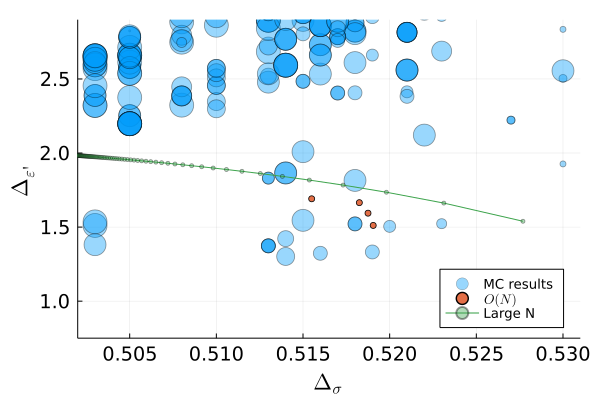

In [31]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[1] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (0.502, 0.531),
        ylims = (0.75,2.9),
        label = "MC results"
)
scatter!(oNValues[:,1],oNValues[:,2],
        label=L"O(N)",
        xaxis=L"\Delta_\sigma",
        yaxis=L"\Delta_{\epsilon'}",
        legend= :bottomright
)
plot!(listdphi,listdS, label="Large N",
marker=(0.4,3)
)


In [32]:

savefig("../endMinima-2relevantScalarsdepsPrimeVSdsig.pdf")

In [16]:
[0.68726, 0.5244] .^2

2-element Vector{Float64}:
 0.4723263076
 0.27499535999999997

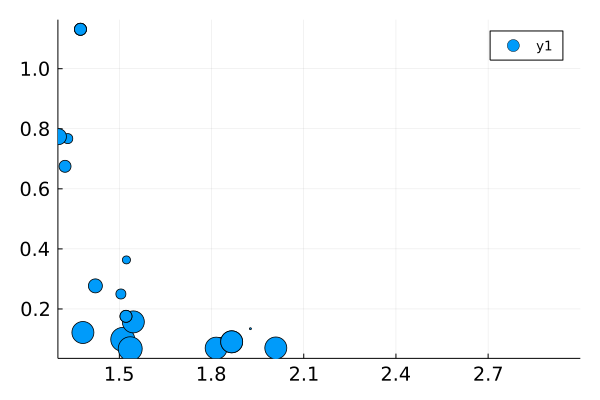

In [17]:
    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        [getOpOPE(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #α=0.4,marker=(:square),
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (1.3,3)
)

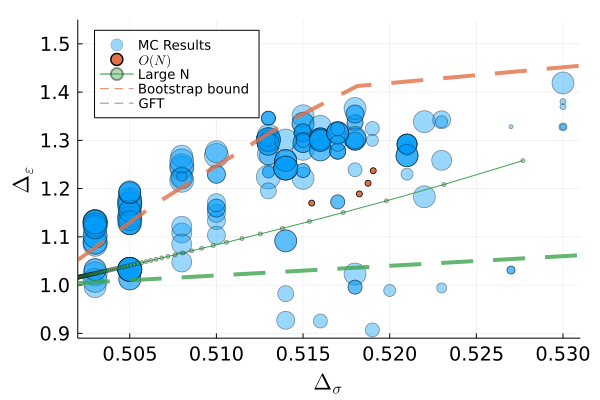

In [34]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[1] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #marker=(:square),
α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (0.502,0.531),
        ylims = (0.89,1.55),
        label="MC Results"
)
scatter!(oNValues[:,1],oNValues[:,3],
        label=L"O(N)",
        xaxis=L"\Delta_\sigma",
        yaxis=L"\Delta_\epsilon",
        legend= :topleft
)
plot!(listdphi,listdT, label="Large N",
marker=(0.4,3)
)
plot!(extremalLine3d[:,1],extremalLine3d[:,2],label="Bootstrap bound",
line=( :dash, 4,0.8),
color=2)
 plot!(x->2x,0.5:0.001:0.531,label="GFT",
line=( :dash, 4,0.8),
color=3)

In [35]:
savefig("../endMinima-2relevantScalarsdepsVSdsig.pdf")

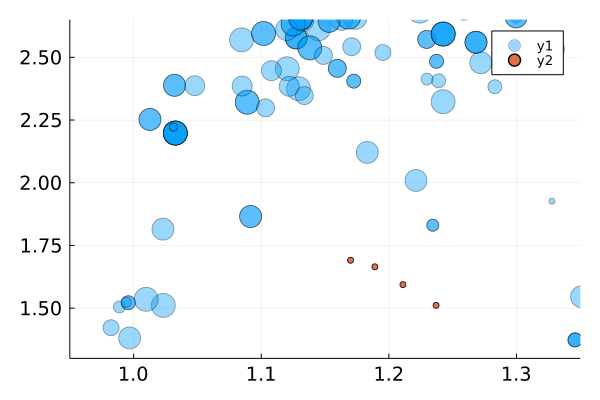

In [36]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #marker=(:square),
α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (0.95,1.35),
        ylims = (1.3,2.65)
)
scatter!(oNValues[:,3],oNValues[:,2])

**Preeliminary analysis:**
The presence of minima well inside the allowed region is indisputable. It remains unclear though whether these minima can be identified with the $O(N)$
 models in any way.

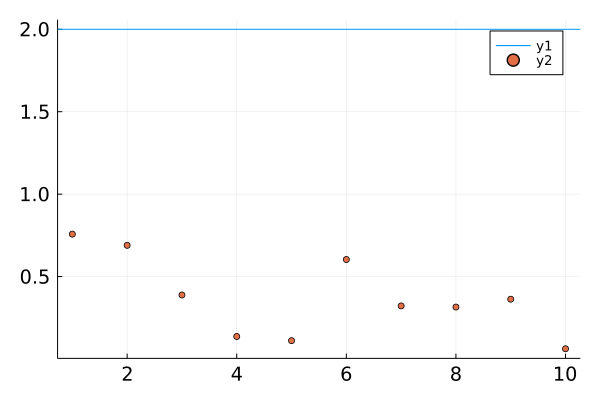

In [44]:
hline([1,2],[2])
scatter!(rand(10))

#### Analyzing $\Delta_\sigma$ stability

In [3]:
cd("/home/puercoerrante/fortranTests/3d/2022g07-ONTests")

In [4]:
lowT = readdlm("stabilityTest.dat")[1:10:end,:];

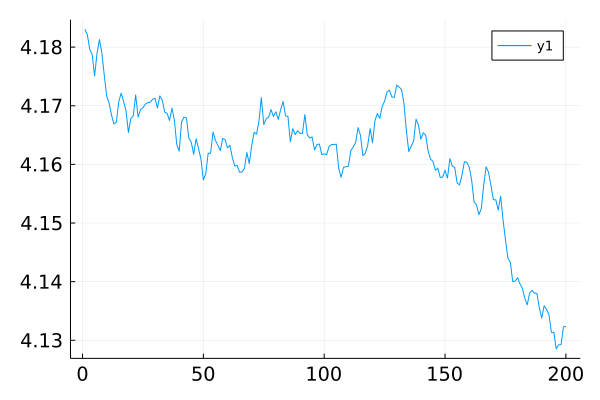

In [37]:
plot( lowT[1:200,4], )

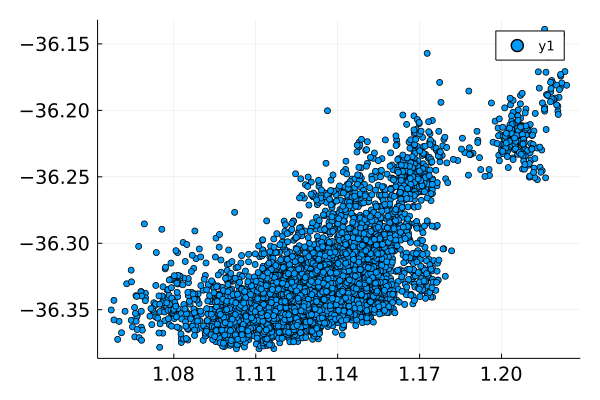

In [19]:
scatter( lowT[1:5000,2],lowT[1:5000,13], )

In [20]:
ergodic6 = readdlm("T0.6.dat")[1:10:end,:];

In [30]:
lowActionPoints  = ergodic6[:,13] .< -35;

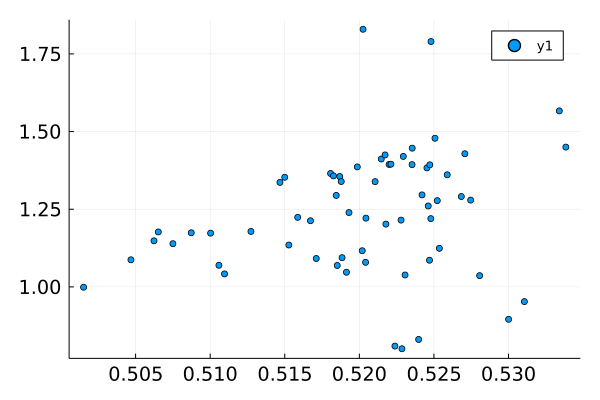

In [45]:
scatter(ergodic6[lowActionPoints,1],ergodic6[lowActionPoints,2],)

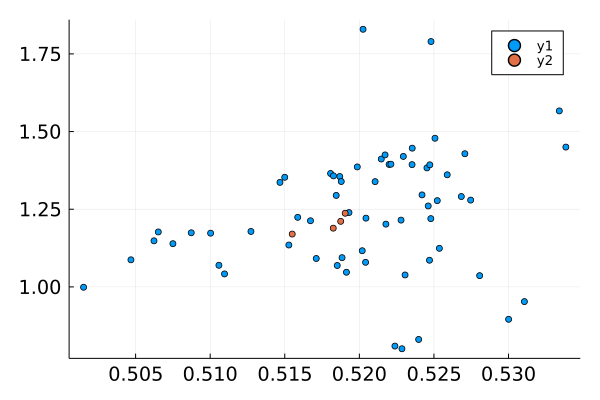

In [46]:
scatter!(oNValues[:,1],oNValues[:,3],)

#### scalar gap alternative approach

In [ ]:
stDim=3

In [38]:
oNValues = [
0.51905 1.51124 1.237 
0.51875 1.5939  1.211 
0.51825 1.6649  1.189 
0.5155  1.691   1.170
]

4×3 Matrix{Float64}:
 0.51905  1.51124  1.237
 0.51875  1.5939   1.211
 0.51825  1.6649   1.189
 0.5155   1.691    1.17

##### all $\ell_{max}$ analysis

In [ ]:
stDim=3

onExperiments3d =[

"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.5-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.52-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.515-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51926-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.51928-dtFixedtrue-ONexperiments"

"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.512-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.519-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.5195-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.518-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.516-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.514-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.521-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022f27-dsig0.517-dtFixedtrue-ONexperiments"
]

oN_2relevantScalars = [
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.52-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.521-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.5195-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.518-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.519-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.5185-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.513-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.517-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.516-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.515-dtFixedtrue-ONexperiments"
"/home/puercoerrante/fortranTests/3d/2022g01-dsig0.514-dtFixedtrue-ONexperiments"

]

In [ ]:
#get the data
specsToPlotGlobal = Dict()
for dir in oN_2relevantScalars
    occursin("3d",dir)  || continue
    @show dir
    cd(dir)
    
    tmpParam = readdlm("params.dat")

    stDim = tmpParam[1]|>Int
    DTfixed = tmpParam[2]|>Bool
    if DTfixed
        DTfixedTag = "Fixed"
    else
        DTfixedTag = "Free"
    end
    try 
        wut = readdlm("cleanMinima.dat")
        cleanMinima = [([parse(Int, x ) for x in split(wut[i,1],'_')],float.(filter(!isempty, wut[i,2:end]))) for i in 1:length(wut[:,1])]
        #wut = readdlm("specsToPlot.dat")
        #specsToPlot = [([parse(Int, x ) for x in split(wut[i,1],'_')],filter(!isempty, wut[i,2:end])) for i in 1:length(wut[:,1])]
        dsig = cleanMinima[1][2][1]
        filter!(x -> length(x[1]) <= 6, cleanMinima)

        onlyEndMinima=false
        if onlyEndMinima
            sss,chains = branchesFromCleanMinima(cleanMinima, 0.2,2)
            specsToPlotGlobal[(stDim,DTfixed,dsig)] = [branch[end] for branch in chains if branch[end][1][1]>=2]
        else
            specsToPlotGlobal[(stDim,DTfixed,dsig)] = filter(x->x[1][1]>=2,cleanMinima)
        end
        
    catch e
        @show dir, e
    end

end

In [ ]:
specsToPlotGlobal[3,true,0.515]

In [ ]:

bb = plot(x->2x,[0.5,0.53],label="GFT",line=( 5,0.8), color=3)
actionCutoff=-2
for lLimit in [6,5,4,3]
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff && sec[1]>=2 ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end
    scatter!(bb,
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,2) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,marker=(:square),
        label = L"\ell_{max} ="*"$lLimit" 
)
end

In [ ]:
lLimit=6
actionCutoff=-35
    minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==lLimit && getAction(sec,dd)<actionCutoff && dd[3] <2 ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && getAction(sec,dd)<actionCutoff && sec[1]>=2 ];
    #minimaList = [(sec,dd) for ((stDim,DTfixed,dsig),minima) in specsToPlotGlobal for (sec,dd) in minima if DTfixed && length(sec)==5];
    #parameters for size representation
    actionsVec =  [getAction(sec,dd) for  (sec,dd) in minimaList ]
    bestAction, worstAction = extrema(actionsVec)
    actionScale = worstAction - bestAction
    minSize = 2
    maxSize = 15
    function actionToSize(act::Float64)
        maxSize *(worstAction - act)/actionScale + minSize
    end

In [ ]:

oNComparibleMinima = [sum(dd[2:1+sec[1]] .< 3) for (sec,dd) in minimaList] .< 3
fullMinima = copy(minimaList)
minimaList = minimaList[oNComparibleMinima]

In [ ]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[1] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        ylims = (1.25,1.8)
)
scatter!(oNValues[:,1],oNValues[:,2])

In [ ]:
[0.68726, 0.5244] .^2

In [ ]:
    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        [getOpOPE(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #α=0.4,marker=(:square),
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (1.3,3)
)

In [ ]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[1] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #marker=(:square),
α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        ylims = (1,1.35)
)
scatter!(oNValues[:,1],oNValues[:,3])

In [ ]:

    scatter(
        #[getOpDelta(sec,dd,0,0) for (sec,dd) in minimaList],
        [dd[2] for (sec,dd) in minimaList],
        [getOpDelta(sec,dd,0,1) for (sec,dd) in minimaList],
        ms = [actionToSize(dd[sum(sec) + 2]) for (sec,dd) in minimaList], 
                #marker=(:square),
α=0.4,
        #label = L"\ell_{max} ="*"$lLimit" 
        xlims = (0.8,1.35),
        ylims = (1.3,2.05)
)
scatter!(oNValues[:,3],oNValues[:,2])

In [ ]:
plot()
for (sec,dd) in minimaList
    plot!(sort(dd[2:1+sec[1]]),label=nothing,marker=(3,0.5))
end

In [ ]:
plot!(ylims=(1,3))
hline!([1.3])

In [ ]:

 plot!(bb,extremalLine2d[:,1],extremalLine2d[:,2],label="extremal",
line=(:dash, 5,0.8),color=2)

ylims!(bb,0.1,2.8),
xlims!(bb,0.08,0.31)
plot!(bb,legend=:bottomright)
scatter!(bb,
    minimalModels[:,1],
    minimalModels[:,2],
    label="MM",
    marker=(:x,15,),
    color=2,
    xaxis=L"\Delta_\sigma",
    yaxis=L"\Delta_\epsilon",
)

# Appendix plots

In [2]:
path="/home/puercoerrante/fortranTests/3d/2021k11-isingMinimaValidation/"
cd(path)

In [ ]:
mathData = readdlm("mathdata.dat");
fortData = readdlm("testcheck.dat")#[1:100,1:end]
        errors=(mathData - fortData[1:length(mathData),9]) ./abs.(fortData[1:length(mathData),9]) ;

In [ ]:
pp=histogram(vec(errors) .* 100, label=nothing)
    xaxis!("relative error  ( \$\\%\$ ) ")
    yaxis!("Counts ")
savefig(pp,"histogram.pdf")


In [29]:
exact = readdlm("BlockExactValues.dat")
interpolated = readdlm("BlockFortranValues.dat")[1:5001,[1,3]];

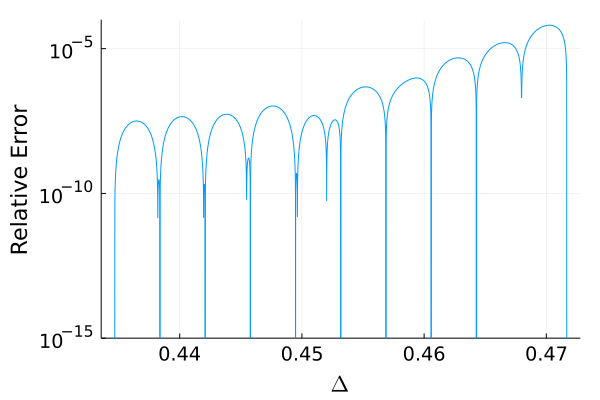

┌ Warning: Invalid negative or zero value 0.0 found at series index 4501 for log10 based yscale
└ @ Plots /home/puercoerrante/.julia/packages/Plots/5S9Hg/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 4501 for log10 based yscale
└ @ Plots /home/puercoerrante/.julia/packages/Plots/5S9Hg/src/utils.jl:95
┌ Warning: Invalid negative or zero value 0.0 found at series index 4501 for log10 based yscale
└ @ Plots /home/puercoerrante/.julia/packages/Plots/5S9Hg/src/utils.jl:95


In [34]:
plot(exact[:,1],abs.(exact[:,2]-interpolated[:,2]) ./ exact[:,2],xaxis=(L"\Delta"),yaxis=("Relative Error",:log),legend = nothing,ylims = (10^-15,10^-4))
#plot(exact[:,1],abs.(exact[:,2]-interpolated[:,2]) ,xaxis=(L"\Delta"),yaxis=("Relative Error",:log),legend = nothing)

In [35]:
savefig("../relativeErrorInterpolation.pdf")

┌ Warning: Invalid negative or zero value 0.0 found at series index 4501 for log10 based yscale
└ @ Plots /home/puercoerrante/.julia/packages/Plots/5S9Hg/src/utils.jl:95


# Appendix: Mathematica plots

## derivative Determinants Bootstrap

In [2]:
using DelimitedFiles
using Plots
#using Plotly
using Statistics
using LaTeXStrings

using ImageFiltering
using DataFrames
using Counters
using CSV


default(titlefont = (13), legendfontsize = 9, guidefont = (15, :black), tickfont = (13, :black),
margins = 3Plots.PlotMeasures.mm)
cd("/Users/urieluval/fortranmc/dataAnalysisNotebooks")
include("$(pwd())/utilities.jl");

In [3]:
cd("/Users/urieluval/fortranTests/4d/2022g15-checkDerivatives")

In [23]:
data = readdlm("Res-Higher-d_logdet_8000-step-beta=1.5maxDer=6.dat")

8000×6 Matrix{Float64}:
 1.0  3.0       5.2917   9.0      11.0      35.4461
 1.0  3.0       5.2917   9.05894  11.0      35.5253
 1.0  0.348015  5.2917   9.05894  11.0      35.287
 1.0  0.348015  6.3975   9.05894  11.0      33.9091
 1.0  0.348015  6.3975   9.05894  11.0      33.9091
 1.0  0.348015  6.3975   9.05894  11.0      33.9091
 1.0  0.348015  6.3975   9.05894  11.0      33.9091
 1.0  0.348015  6.3975   9.05894  11.0      33.9091
 1.0  0.348015  6.3975   8.79471  11.0      34.6282
 1.0  0.348015  6.3975   8.79471  11.0      34.6282
 ⋮                                           ⋮
 1.0  1.96096   3.99953  5.99906   7.99933  12.7298
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 1.0  1.96096   3.99953  5.99906   7.99926  13.206
 

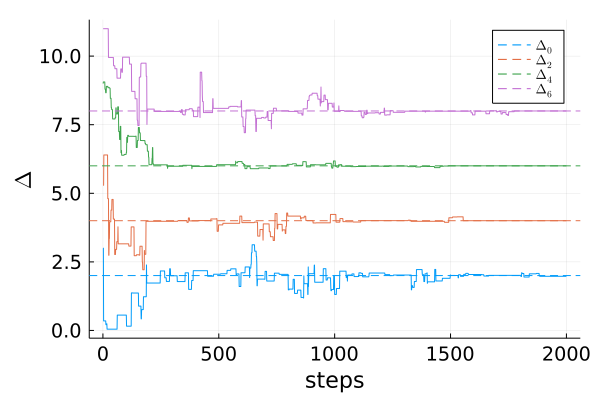

In [31]:
pp = plot()
references = collect(2:2:8)
names = ["\$\\Delta_$l\$"  for l in 0:2:6]
for i in 1:4
    plot!(pp,data[1:2000,i+1],color=i,label=nothing)
    hline!([references[i]],color=i, line=:dash, label = names[i])
end
plot!(pp,xaxis="steps", yaxis = L"\Delta")

In [32]:
savefig(pp,"../derMC-FT.pdf")

## derivative Determinants Bootstrap -- freezing edition

In [1]:
using DelimitedFiles
using Plots
#using Plotly
using Statistics
using LaTeXStrings

using ImageFiltering
using DataFrames
using Counters
using CSV


default(titlefont = (13), legendfontsize = 9, guidefont = (15, :black), tickfont = (13, :black),
margins = 3Plots.PlotMeasures.mm)
cd("/home/puercoerrante/fortranmc/dataAnalysisNotebooks")
include("$(pwd())/utilities.jl");

In [2]:
cd("/home/puercoerrante/fortranTests/4d/2022g29-highlDers")

In [3]:
data = readdlm("Res-Higher-d_logdet_5000-step-beta=1dstar=13maxDer=8.dat")

5000×7 Matrix{Float64}:
 1.0  2.00048  4.00009  5.99999  7.99999  3.0      17.8631
 1.0  2.00048  4.00009  5.99999  7.99999  3.0      17.8631
 1.0  2.00048  3.9999   5.99999  7.99999  3.0      17.8798
 1.0  2.00051  3.9999   5.99999  7.99999  3.0      17.8812
 1.0  2.00051  3.9999   5.99999  7.99999  3.0      17.8812
 1.0  2.00051  3.9999   5.99999  7.99999  2.99945  17.8791
 1.0  2.00061  3.9999   5.99999  7.99999  2.99945  17.8837
 1.0  2.00061  3.9999   5.99999  7.99999  3.00059  17.8882
 1.0  2.00061  3.9999   5.99999  7.99999  3.00438  17.9033
 1.0  2.00061  3.9999   5.99999  7.99999  3.0018   17.8931
 ⋮                                        ⋮        
 1.0  2.00012  3.9239   5.98401  8.00875  2.00012   8.73877
 1.0  2.00012  3.92616  5.98401  8.00875  2.00012   8.69309
 1.0  2.00012  3.9321   5.98401  8.00875  2.00012   8.56693
 1.0  2.00012  3.91402  5.98401  8.00875  2.00012   8.92578
 1.0  2.00012  3.91402  5.98401  8.02118  2.00012   9.25035
 1.0  2.00012  3.91402  5.99078  8

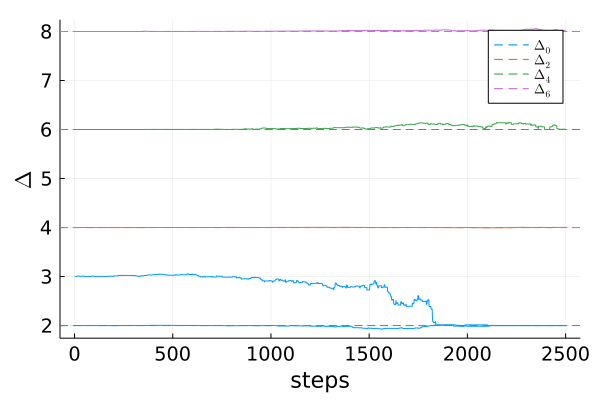

In [6]:
maxStep = 2500
pp = plot()
references = collect(2:2:8)
names = ["\$\\Delta_$l\$"  for l in 0:2:6]
for i in 1:4
    plot!(pp,data[1:maxStep,i+1],color=i,label=nothing)
    hline!([references[i]],color=i, line=:dash, label = names[i])
end
plot!(pp,data[1:maxStep,6],color=1,label=nothing, 
xaxis="steps", yaxis = L"\Delta")

In [11]:
savefig(pp,"../derMC-FT-freezingMultiScalar.pdf")

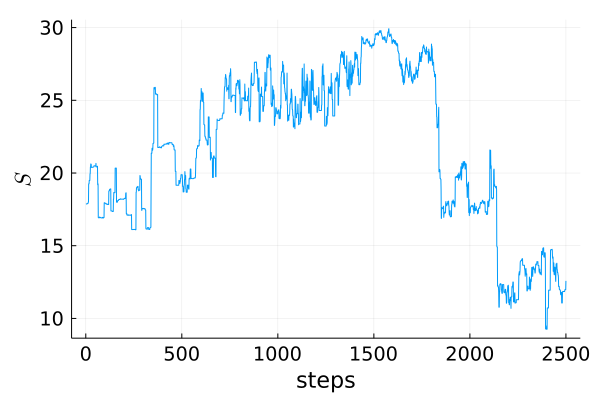

In [10]:
plot(data[1:2500,7], label=nothing, xaxis="steps",yaxis=L"S")

In [12]:

savefig("../derMC-FT-freezingMultiScalar-S.pdf")

## zPoint Determinants Bootstrap 

In [1]:
using DelimitedFiles
using Plots
#using Plotly
using Statistics
using LaTeXStrings

using ImageFiltering
using DataFrames
using Counters
using CSV


default(titlefont = (13), legendfontsize = 9, guidefont = (15, :black), tickfont = (13, :black),
margins = 3Plots.PlotMeasures.mm)
cd("/home/puercoerrante/fortranmc/dataAnalysisNotebooks")
include("$(pwd())/utilities.jl");

In [3]:
cd("/home/puercoerrante/fortranTests/4d/2022h04-zPointDet")

In [4]:
data = readdlm("10000-step-beta=100dstar=11maxDer=maxDerMC.dat")

3200×6 Matrix{Float64}:
 1.0  3.00048  6.00009  9.0      11.0      -2.10655
 1.0  3.00048  6.00009  9.0      11.0      -2.10655
 1.0  3.00048  5.77102  9.0      11.0      -2.11063
 1.0  3.00048  5.77102  9.0      11.0      -2.11063
 1.0  3.00048  5.77102  8.87035  11.0      -2.12754
 1.0  3.00048  5.77102  8.87035  11.0      -2.12754
 1.0  3.00048  5.56396  8.87035  11.0      -2.13312
 1.0  3.00048  5.60734  8.87035  11.0      -2.13171
 1.0  3.00048  5.60734  8.66912  11.0      -2.16142
 1.0  3.19439  5.60734  8.66912  11.0      -2.15457
 ⋮                                          ⋮
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.78485
 1.0  2.00054  4.00001  6.00001   8.00006  -3.

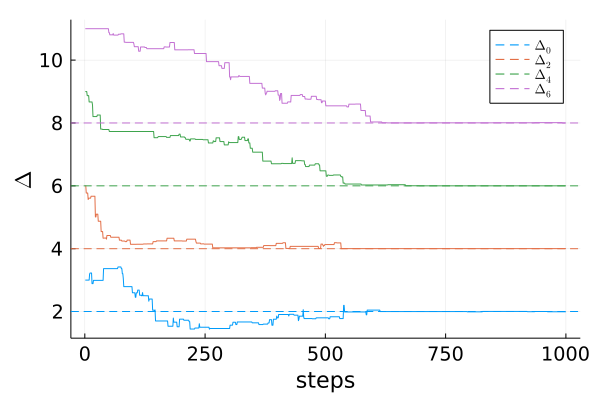

In [8]:
maxStep = 1000
pp = plot()
references = collect(2:2:8)
names = ["\$\\Delta_$l\$"  for l in 0:2:6]
for i in 1:4
    plot!(pp,data[1:maxStep,i+1],color=i,label=nothing)
    hline!([references[i]],color=i, line=:dash, label = names[i])
end
plot!(pp, 
xaxis="steps", yaxis = L"\Delta")

In [10]:
savefig(pp,"../zPointMC-FT.pdf")

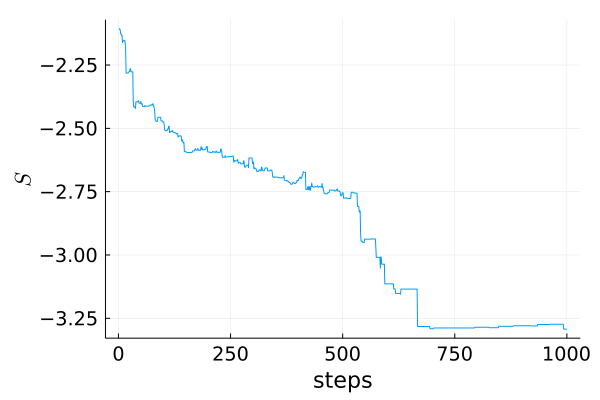

In [12]:
plot(data[1:maxStep,6], label=nothing, xaxis="steps",yaxis=L"S")

In [13]:

savefig("../zPointMC-FT-S.pdf")

## zPoint residual Bootstrap  in Mathe.

In [1]:
using DelimitedFiles
using Plots
#using Plotly
using Statistics
using LaTeXStrings

using ImageFiltering
using DataFrames
using Counters
using CSV


default(titlefont = (13), legendfontsize = 9, guidefont = (15, :black), tickfont = (13, :black),
margins = 3Plots.PlotMeasures.mm)
cd("/home/puercoerrante/fortranmc/dataAnalysisNotebooks")
include("$(pwd())/utilities.jl");

In [2]:
cd("/home/puercoerrante/fortranTests/4d/2022h05-rFacMathematica")

In [3]:
data = readdlm("decimatedBeta1.dat")

1000×7 Matrix{Float64}:
 1.1  2.09434   5.92163  4.0      6.04643  8.3777   -11.2149
 1.1  2.09434   5.952    4.11088  6.00274  8.73146  -12.3653
 1.1  2.03983   5.952    4.41849  6.00274  8.42404  -12.1399
 1.1  2.22954   5.952    4.21343  6.28277  8.60862  -15.5377
 1.1  2.18613   5.9909   4.21343  6.03515  8.80521  -14.0823
 1.1  2.18613   5.96812  4.21343  6.18467  8.38042  -14.7611
 1.1  2.46345   5.52971  4.21343  6.18467  8.38042  -15.7156
 1.1  2.34376   5.34976  4.22853  6.18467  8.42736  -16.3425
 1.1  2.02128   5.56124  4.22853  6.21333  8.79584  -15.3556
 1.1  2.29249   5.61361  4.22853  6.15927  8.81271  -16.1872
 ⋮                                         ⋮        
 1.1  2.08981   5.05352  4.20201  9.9364   8.64393  -10.5087
 1.1  2.4508    6.66321  4.20201  9.9364   9.33939   -9.52362
 1.1  1.72967   6.66321  4.0693   9.9364   9.66193   -9.36571
 1.1  1.72967   7.02814  4.0693   9.9364   9.66193   -9.36571
 1.1  1.72967   6.76392  4.17051  9.9364   8.52017  -10.2202
 1.1 

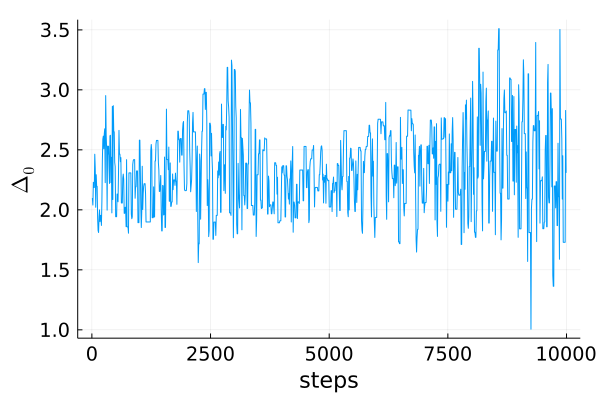

In [16]:
plot(1:10:10000, data[:,2],label=nothing,xaxis="steps",yaxis=L"\Delta_0")

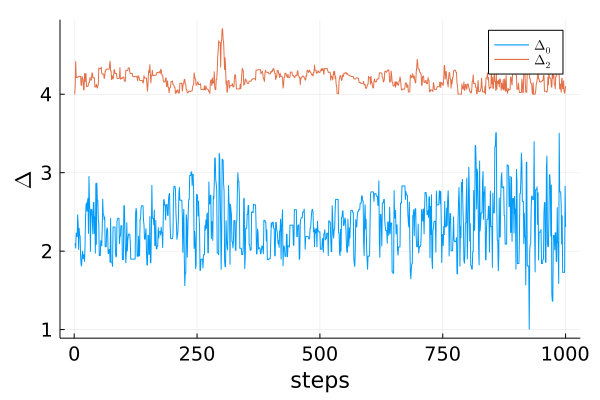

In [24]:
maxStep = 1000
pp = plot()
references = collect(2:2:8)
names = ["\$\\Delta_$l\$"  for l in 0:2:6]
for i in 1:2
    plot!(pp,data[1:maxStep,[2,4][i]],color=i, label = names[i])
    #hline!([references[i]],color=i, line=:dash, label = names[i])
end
#plot!(pp,data[1:maxStep,6],color=1,label=nothing, xaxis="steps", yaxis = L"\Delta")
plot!(pp, xaxis="steps", yaxis = L"\Delta")

In [17]:

savefig("../mathResiduals.pdf")

In [25]:
data = readdlm("decimatedBeta1Fortran.dat")

2000×12 Matrix{Float64}:
 1.1  2.50777   5.10823  4.10055  …  0.426531  0.0344043   0.00442659
 1.1  2.09844   6.55837  4.10011     0.455442  0.0204147   0.008337
 1.1  2.0614    6.7909   4.07752     0.401323  0.0430172   0.0017612
 1.1  2.0631    7.32624  4.28455     0.398086  0.0377521   0.00374715
 1.1  1.88458   7.7943   4.1913      0.418593  0.0358433   0.00416037
 1.1  2.06097   7.46067  4.26183  …  0.40388   0.0359755   0.00414124
 1.1  1.93381   5.6588   4.02857     0.43437   0.0345169   0.00418244
 1.1  2.29755   4.94165  4.05308     0.518296  0.0         0.0136785
 1.1  1.94045  10.7143   4.05318     0.511098  0.0         0.0140057
 1.1  1.6671    8.46804  4.12975     0.555262  0.0         0.0140836
 ⋮                                ⋱            ⋮           
 1.1  2.58627   5.51073  4.24478     0.400266  0.0421537   0.00225047
 1.1  2.90414   7.18235  4.0529      0.440971  0.0350606   0.00401699
 1.1  2.24467   7.50155  4.00158     0.464414  0.0199996   0.00813216
 1.1  2.638

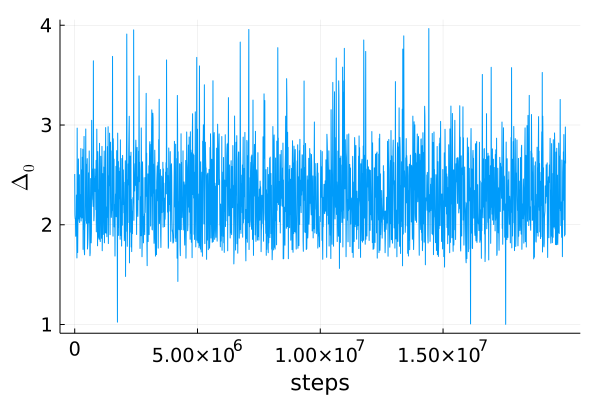

In [41]:
plot(1:10_000:20000000, data[:,2],label=nothing,xaxis="steps",yaxis=L"\Delta_0",xticks=[0,10^7/2,10^7,10^7*(3/2)])

In [42]:

savefig("../mathResidualsFortran.pdf")